# Sweep enrichments

> ### NB: This notebook needs to run in the simons_jupyter environment

Load global analysis variables:

In [6]:
%run standard.py

We look for enrichments in all the 90%-regions

In [7]:
import re, os, sys, pickle, pickle
from pathlib import Path
import numpy
import scipy
import pandas
import pandas as pd
from pandas import DataFrame, Series
from sklearn.decomposition import PCA
from collections import Counter, defaultdict
import random, bisect

random.seed(7)

import pyfaidx

# my own libaries
#from ChromosomeWindows import window
import genominterv

%env http_proxy=http://proxyserv:3128
%env https_proxy=http://proxyserv:3128
%env ftp_proxy=http://proxyserv:3128
import geneinfo as gi
gi.email('kaspermunch@birc.au.dk')
        
numpy.random.seed(7)

class left:
    def __rlshift__(self, df):
        "Left align columns of data frame: df << left()"
        left_aligned_df = df.style.set_properties(**{'text-align': 'left'})
        left_aligned_df = left_aligned_df.set_table_styles(
        [dict(selector = 'th', props=[('text-align', 'left')])])
        display(left_aligned_df)

env: http_proxy=http://proxyserv:3128
env: https_proxy=http://proxyserv:3128
env: ftp_proxy=http://proxyserv:3128


Plotting setup:

In [8]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D 
import matplotlib.cbook as cbook
# from mpl_toolkits.basemap import Basemap
#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

import mpld3

import seaborn as sns
sns.set() # sets seaborn default "prettyness:
sns.set_style("whitegrid")
sns.set_context("paper")

# lowess for plotting
from statsmodels.nonparametric.smoothers_lowess import lowess

set1 = {'red': '#e41a1c', 'blue': '#377eb8', 'green': '#4daf4a',
        'purple': '#984ea3', 'orange': '#ff7f00', 
        'yellow': '#ffff33', 'brown': '#a65628'}

Ignore deprecation warnings from mainly seaborn:

In [9]:
# silence deprecation warnings (lots from seaborn)
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=numpy.VisibleDeprecationWarning)

Analysis dirs:

In [10]:
root_dir = Path(os.environ['HOME'], 'simons/faststorage/people/kmt')
meta_data_dir = Path(os.environ['HOME'], 'simons/faststorage/data/metadata')
steps_dir = root_dir / 'steps'
argweaver_dir = steps_dir / 'argweaver/output'
results_dir = root_dir / 'results'
figures_dir = root_dir / 'figures'
data_dir = root_dir / 'data'
pi_dir = steps_dir / 'pi_stores'
dist_dir = steps_dir / 'dist_stores'
#pi_dir = root_dir / 'old_pi_stores'
male_x_haploid_dir = steps_dir / 'male_x_haploids'

Local code in the scripts dir on the cluster:

In [11]:
scripts_dir = root_dir / 'scripts'
if str(scripts_dir) not in sys.path:
    sys.path.append(str(scripts_dir))

import simons_meta_data
import hg19_chrom_sizes

from toggle_code_and_errors import toggle_code_html, toggle_errors_html

Import variables global to the entire analysis:

In [12]:
import analysis_globals

## Convenience functions

In [13]:
def silent_nanmean(x):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        return numpy.nanmean(x)
    
def ident_scalar(s):
    x = s.unique()
    assert(len(x)) == 1, x
    return x[0]

## Load meta data

In [14]:
# easy loading of meta data in a consistent manner across code
individuals, populations, regions = simons_meta_data.get_meta_data(meta_data_dir=meta_data_dir)

pop_categories = pandas.read_hdf(str(results_dir / 'population_categories.store'), 'sr')
region_categories = pandas.read_hdf(str(results_dir / 'region_categories.store'), 'sr')

region_colors = dict(zip(list(region_categories), 
                         ['#e41a1c', '#377eb8',  '#984ea3', '#4daf4a',
                          '#ff7f00', '#ffff33', '#a65628']))

chromosome_lengths = dict((k.replace('chr', ''), v) for k, v in hg19_chrom_sizes.hg19_chrom_sizes.items())

reference_genome_file = Path('/home', 'kmt', 'simons', 
                        'faststorage', 'cteam_lite_public3', 'FullyPublic', 'Href.fa')

In [15]:
def genes_close_to(genes, peaks, dist):    
    lst = list()
    for tup in peaks.itertuples():
        df = genes.copy().loc[(genes.start < tup.pos+dist) & (genes.end > tup.pos-dist)]
        df['peak_start'] = tup.start
        df['peak_end'] = tup.end
        lst.append(df)
    return pandas.concat(lst)

def genes_overlapping_intervals(genes, peaks):    
    lst = list()
    for tup in peaks.itertuples():
        df = genes.copy().loc[(genes.start < tup.end) & (genes.end > tup.start)]
        df['peak_start'] = tup.start
        df['peak_end'] = tup.end
        lst.append(df)
    return pandas.concat(lst)
        
def genes_in_intervals(genes, peaks):
    pos = genes.start + (genes.end-genes.start)/2
    idx = numpy.equal(numpy.searchsorted(peaks.start, pos) - 1, numpy.searchsorted(peaks.end, pos, side='left'))
    return genes.copy().iloc[idx]

## Sweep peak and region data

In [16]:
sweep_peaks = pandas.read_hdf(results_dir / f'sweep_peaks_{ech_calling_tag}.hdf')

In [17]:
extended_peak_regions_subset = (pandas.read_hdf(results_dir / f'extended_peak_regions_{ech_calling_tag}_90%.hdf')
                        )
extended_peak_regions_subset.head()
extended_peak_regions_subset['start'] = extended_peak_regions_subset.start_pos
extended_peak_regions_subset['end'] = extended_peak_regions_subset.end_pos

## Overlapping circRNA from Trine Line

In [13]:
trine_line_x_genes = pandas.read_hdf(results_dir / 'trine_line_x_genes.hdf')
#genes_overlapping_intervals(trine_line_x_genes, extended_peak_regions_subset)

## Overlap to ampliconic genes

In [14]:
ampliconic_regions = pandas.read_hdf(results_dir / 'ampliconic_regions.hdf')

In [15]:
extended_peak_regions_subset.head()

,pos,peak_start,peak_end,peak_prop_swept,start_pos,end_pos,prop_swept,swept_indivs,start,end
0,19850000.0,19800000,19900000,0.828571,19600000,20100000,0.771429,"['B_Australian-4', 'B_Crete-2', 'B_Dai-4', 'B_...",19600000,20100000
1,21250000.0,21200000,21300000,0.814286,21100000,21600000,0.785714,"['B_Australian-4', 'B_Crete-2', 'B_French-3', ...",21100000,21600000
2,36300000.0,36200000,36400000,0.664286,36000000,36400000,0.635714,"['B_Crete-2', 'B_Dai-4', 'B_French-3', 'B_Han-...",36000000,36400000
3,37500000.0,37300000,37700000,0.507143,37200000,37700000,0.500000,"['B_Crete-2', 'B_Dai-4', 'B_Han-3', 'B_Karitia...",37200000,37700000
4,49750000.0,49500000,50000000,0.528571,49500000,50000000,0.528571,"['B_Australian-4', 'B_French-3', 'B_Papuan-15'...",49500000,50000000


In [16]:
@genominterv.bootstrap('hg19', samples=100000)
def jaccard_test(query, annot):
    return genominterv.jaccard(query, annot)

#jaccard_stat, p_value = jaccard_test(intervals, other_intervals)
    

jaccard_test(extended_peak_regions_subset.assign(chrom = 'chrX'), 
             ampliconic_regions.loc[lambda df: df.chrom == 'X'].assign(chrom='chrX'))

(0.0, 1.0)

Non-random distance to ampliconic reginos not overlapping: Are ampliconic regions not overlapping low pi regions closer the low pi regions than expected?

In [17]:
ampl_reg_not_overlapping = genominterv.interval_diff(ampliconic_regions.loc[lambda df: df.chrom == 'X'],
                                                          extended_peak_regions_subset.assign(chrom = 'X'))
genominterv.proximity_test(ampl_reg_not_overlapping, extended_peak_regions_subset.assign(chrom = 'X'))

TestResult(statistic=0.2243200000000002, pvalue=0.0241)

## Overlap to low ILS regions

In [16]:
human_chimp_low_ils_regions_chrX = pandas.read_hdf(results_dir / 'human_chimp_low_ils_regions_chrX.hdf')
human_orang_low_ils_regions_chrX = pandas.read_hdf(results_dir / 'human_orang_low_ils_regions_chrX.hdf')

Human-chimp ILS:

In [19]:
jaccard_test(extended_peak_regions_subset.assign(chrom='chrX'), 
             human_chimp_low_ils_regions_chrX.assign(chrom='chrX'))

p-value is zero smaller than 0.001. Increase nr samples to get actual p-value.


(0.13452914798206278, 0.0)

Human-orang ILS:

In [20]:
jaccard_test(extended_peak_regions_subset.assign(chrom='chrX'), 
             human_orang_low_ils_regions_chrX.assign(chrom='chrX'))

(0.07368421052631578, 0.124)

## Plot for paper

In [17]:
human_chimp_low_ils_regions_chrX = pandas.read_hdf(results_dir / 'human_chimp_low_ils_regions_chrX.hdf')
ampliconic_regions = pandas.read_hdf(results_dir / 'ampliconic_regions.hdf')
non_afr_total_swept = pandas.read_hdf(results_dir / f'non_afr_total_swept_{ech_calling_tag}.hdf')

extended_regions = pandas.read_hdf(results_dir / f'extended_peak_regions_{ech_calling_tag}_90%.hdf')

ust_ishim_sweep_inclusion_incl_upgma = pandas.read_hdf(results_dir / f'ust_ishim_sweep_inclusion_incl_upgma_{ech_calling_tag}_90%.hdf')

ust_ishim_sweep_data = pandas.read_hdf(clique_data_with_ust_ishim_file_name)
ust_ishim_ech = ust_ishim_sweep_data.loc[(ust_ishim_sweep_data.swept == True) & (ust_ishim_sweep_data.indiv_1 == 'Ust_Ishim'), ['start', 'end']]

In [18]:
ust_ishim_ech['ech_run'] = (ust_ishim_ech.start.astype(float) != ust_ishim_ech.end.shift()).cumsum()
#ust_ishim_ech.groupby('ech_run').apply(lambda df: pandas.DataFrame(dict(start=[df.start.min()], end=[df.end.max()])))
ust_ishim_ech_coords = ust_ishim_ech.groupby('ech_run').agg(start=("start", "min"), end=("end", "max")).reset_index()
ust_ishim_ech_coords

,ech_run,start,end
0,1,20700000,21600000
1,2,35900000,36600000
2,3,98500000,99200000
3,4,109400000,110900000
4,5,113800000,114500000
5,6,126800000,127600000


In [19]:
non_afr_total_swept['start_mb'] = non_afr_total_swept.start / 1000000
non_afr_total_swept['end_mb'] = non_afr_total_swept.end / 1000000

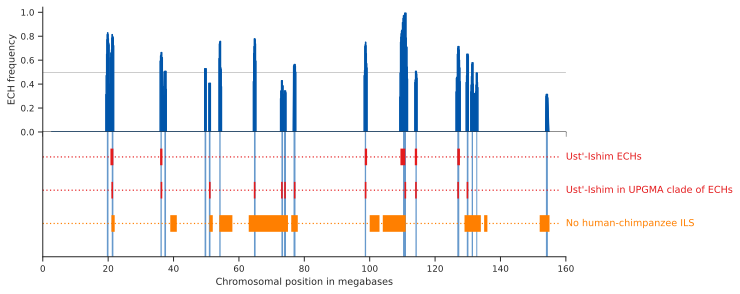

In [20]:
with sns.plotting_context('paper', font_scale=1):
    with sns.axes_style("ticks"):
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 4), sharex=True, sharey=False)

        x = [j for i in zip(non_afr_total_swept.start/1000000, non_afr_total_swept.end/1000000) for j in i]
        y = [j for i in zip(non_afr_total_swept.prop_swept, non_afr_total_swept.prop_swept) for j in i]      
        g = ax1.plot(x, y, color='#0055AA', zorder=1)        
        ax1.fill_between(x, 0, y, color='#0055AA', zorder=1)

#         ax1.scatter(sweep_peaks.loc[sweep_peaks.prop_swept>=0.5].pos, 
#                    sweep_peaks.loc[sweep_peaks.prop_swept>=0.5].prop_swept + 0.04,
#                    c='gray', marker='*', zorder=5)        
        
#         ax1.axhline(0.5, linestyle=(0, (1, 4)), color='grey', linewidth=1)
        ax1.axhline(0.5, color='black', linewidth=0.2, zorder=0)
    

        for tup in extended_regions.itertuples():
            g = ax2.add_patch(Rectangle((tup.start_pos/1000000, 0), tup.end_pos/1000000-tup.start_pos/1000000, 1, 
                         facecolor='#0055AA',
                         linewidth=0,
                         alpha=0.6,
                         zorder=0))
        
        color = set1['red']
        ax2.plot([0, 158e6/1000000], [0.75, 0.75], color=color, linestyle=(0, (1, 2)))
        plt.text(1.6e8/1000000, 0.75, "Ust'-Ishim ECHs", horizontalalignment='left', verticalalignment='center', color=color)
        for tup in ust_ishim_ech_coords.itertuples():
            g = ax2.add_patch(Rectangle((tup.start/1000000, 0.7), tup.end/1000000-tup.start/1000000, 0.1, 
                         facecolor=color,
                         linewidth=0,
                         zorder=5))
                
        x = ust_ishim_sweep_inclusion_incl_upgma.loc[ust_ishim_sweep_inclusion_incl_upgma.tishkoff_included, 'peak_pos']/1000000
        y = [0.55] * len(x)
        ax2.plot([0, 158e6/1000000], [0.55, 0.55], color=color, linestyle=(0, (1, 2)))
        plt.text(1.6e8/1000000, 0.55, "Ust'-Ishim in UPGMA clade of ECHs", horizontalalignment='left', verticalalignment='center', color=color)        
        for x, y in zip(x, y):
            g = ax2.add_patch(Rectangle((x-250000/1000000, 0.5), 500000/1000000, 0.1, 
                         facecolor=color,
                         linewidth=0,
                         zorder=5))
            
        color = set1['orange']
        ax2.plot([0, 158e6/1000000], [0.35, 0.35], color=color, linestyle=(0, (1, 2)))
        plt.text(1.6e8/1000000, 0.35, "No human-chimpanzee ILS", horizontalalignment='left', verticalalignment='center', color=color)        
        for tup in human_chimp_low_ils_regions_chrX.itertuples():
            g = ax2.add_patch(Rectangle((tup.start/1000000, 0.3), tup.end/1000000-tup.start/1000000, 0.1, 
                         facecolor=color,
                         linewidth=0,
                         alpha=1,
                         zorder=5))

#         color = '#000000'
#         ax2.plot([0, 158e6], [0.15, 0.15], color=color, linestyle=(0, (1, 2)))
#         plt.text(1.6e8, 0.15, "Ampliconic regions", horizontalalignment='left', verticalalignment='center', color=color)                
#         for tup in ampliconic_regions.itertuples():
#             g = ax2.add_patch(Rectangle((tup.start, 0.1), tup.end-tup.start, 0.1, 
#                          facecolor=color,
#                          linewidth=0,
#                          alpha=1,
#                          zorder=5))            

        plt.tight_layout()

        ax1.set_ylim(bottom=0)
        ax1.set_xlim(0,160)
        ax1.set_ylabel('ECH frequency')
        ax1.set_ylim(bottom=0)
        
#         ax2.set_ylim(0, 0.9)
        ax2.set_ylim(0.15, 0.9)
        ax2.get_yaxis().set_visible(False)
        ax2.set_xlabel('Chromosomal position in megabases')

        plt.subplots_adjust(hspace=0)

        sns.despine()
        
        plt.savefig(figures_dir / f'ech_peaks_with_annotation_{ech_calling_tag}.pdf', bbox_inches='tight')
        plt.savefig(figures_dir / f'ech_peaks_with_annotation_{ech_calling_tag}.png', bbox_inches='tight')


## Get descriptions of relevant genes

In [22]:
non_afr_total_swept = pandas.read_hdf(results_dir / f'non_afr_total_swept_{ech_calling_tag}.hdf') 
non_afr_total_swept.head()

,index,start,end,is_non_african,nr_swept,total,pos,prop_swept
0,1,2700000,2800000,True,0,139,2750000.0,0.0
1,3,2800000,2900000,True,0,140,2850000.0,0.0
2,5,2900000,3000000,True,0,140,2950000.0,0.0
3,7,3000000,3100000,True,0,140,3050000.0,0.0
4,9,3100000,3200000,True,0,140,3150000.0,0.0


In [24]:
def stairs(df, start='start', end='end', pos='pos', endtrim=0):
    "Turn a df with start, end into one with pos to plot as stairs"
    df1 = df.copy(deep=True)
    df2 = df.copy(deep=True)
    df1[pos] = df1[start]
    df2[pos] = df2[end] - endtrim
    return pandas.concat([df1, df2]).sort_values([start, end])

plot_df = stairs(non_afr_total_swept)

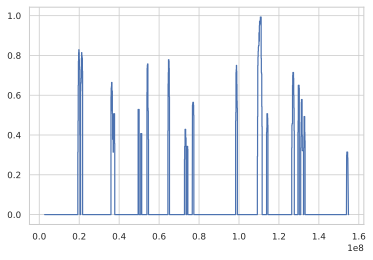

In [25]:
plt.plot(plot_df.pos, plot_df.prop_swept) ;

In [26]:
extended_peak_regions_subset

,pos,peak_start,peak_end,peak_prop_swept,start_pos,end_pos,prop_swept,swept_indivs,start,end
0,19850000.0,19800000,19900000,0.828571,19600000,20100000,0.771429,"['B_Australian-4', 'B_Crete-2', 'B_Dai-4', 'B_...",19600000,20100000
1,21250000.0,21200000,21300000,0.814286,21100000,21600000,0.785714,"['B_Australian-4', 'B_Crete-2', 'B_French-3', ...",21100000,21600000
2,36300000.0,36200000,36400000,0.664286,36000000,36400000,0.635714,"['B_Crete-2', 'B_Dai-4', 'B_French-3', 'B_Han-...",36000000,36400000
3,37500000.0,37300000,37700000,0.507143,37200000,37700000,0.500000,"['B_Crete-2', 'B_Dai-4', 'B_Han-3', 'B_Karitia...",37200000,37700000
4,49750000.0,49500000,50000000,0.528571,49500000,50000000,0.528571,"['B_Australian-4', 'B_French-3', 'B_Papuan-15'...",49500000,50000000
5,51100000.0,50800000,51400000,0.339286,50800000,51300000,0.407143,"['B_Australian-4', 'B_Crete-2', 'B_Papuan-15',...",50800000,51300000
6,54300000.0,54200000,54400000,0.757143,54000000,54400000,0.735714,"['B_Australian-4', 'B_Crete-2', 'B_Dai-4', 'B_...",54000000,54400000
7,64800000.0,64700000,64900000,0.778571,64600000,65100000,0.714286,"['B_Crete-2', 'B_Dai-4', 'B_French-3', 'B_Han-...",64600000,65100000
8,73150000.0,73000000,73300000,0.428571,73000000,73500000,0.385714,"['B_French-3', 'B_Papuan-15', 'B_Sardinian-3',...",73000000,73500000
9,74100000.0,73900000,74300000,0.342857,73800000,74400000,0.314286,"['B_Crete-2', 'B_French-3', 'B_Sardinian-3', '...",73800000,74400000


Produce a list of genes overlapping peaks:

> Enhancers are clusters of distal DNA sequences that can increase transcription of their target gene(s) in cis. The distance of enhancers to their target promoter(s) vary, and in metazoans, an enhancer is placed from 100 bp to Mb away from the regulated gene on the same chromosome [114]. "Enhancers: from developmental genetics to the genetics of common human disease. Iain Williamson 1, Robert E Hill, Wendy A Bickmore"


Get protein coding genes at peaks:

In [28]:
records = []
for tup in list(extended_peak_regions_subset.itertuples()):
    for gene in gi.get_genes_region('chrX', int(tup.peak_start)-100000, int(tup.peak_end)+100000, 
                                    assembly='hg19'):
        records.append((gene[0], 'chrX', gene[1], gene[2]))
candidate_genes = pd.DataFrame().from_records(records, columns=['name', 'chrom', 'start', 'end'])    
candidate_genes.to_hdf(results_dir / 'candidate_genes.hdf', 'df', format='table')
candidate_genes << left()

,name,chrom,start,end
0,SH3KBP1,chrX,19552094,19817891
1,SH3KBP1,chrX,19552094,19851269
2,SH3KBP1,chrX,19552094,19851269
3,SH3KBP1,chrX,19552094,19851269
4,SH3KBP1,chrX,19552094,19905718
5,SH3KBP1,chrX,19552094,19905718
6,SH3KBP1,chrX,19552094,19905718
7,SH3KBP1,chrX,19552094,19905718
8,BCLAF3,chrX,19930977,20009179
9,BCLAF3,chrX,19930977,20009179


In [ ]:
import anndata as ad
import scanpy as sc

adata_file = "adata_susbet_kasper.h5ad"
adata = sc.read(adata_file)

In [ ]:
def expr_plot(genes, layer, markersize=40, ci=95):
    df = adata.to_df(layer=layer)
    df['ptime'] = pd.cut(adata.obs.Pseudotime_scaled, include_lowest=True, bins=30)
    df.set_index('ptime', inplace=True)
    df.columns.name = 'gene'
    plot_df = df[genes].stack().to_frame('expression').reset_index()
    plt.figure(figsize=(10,5))
    ax = sns.pointplot(data=plot_df, x='ptime', y='expression', hue='gene', ci=ci, errwidth=1, scale=0.3)
    plt.setp(ax.collections, sizes=[markersize])
    plt.xticks(rotation=90)
    ax.axvline(6.5, color='grey', linestyle='dashed')
    ax.axvline(14.5, color='grey', linestyle='dashed')
    ax.set_ylabel('Raw counts')
    ax.set_xlabel('Pseudo-time')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
    sns.despine()
    
clusters = ['Spermatogonia', 'Leptotene/Zygotene', 'Pachytene', 'Spermatids']

def cat_plot(genes, layer, markersize=40, ci=95):
    df = adata.to_df(layer='raw_counts')
    df['cluster'] = adata.obs.cluster
    df.set_index('cluster', inplace=True)
    df.columns.name = 'gene'
    plot_df = df.loc[:, genes].stack().to_frame('expression').reset_index()    
    plt.figure(figsize=(10,5))
    # ax = sns.pointplot(data=plot_df, x='clst', y='exp', hue='gene', order=['SPG', 'SPC', 'SPT'])#, ci=ci, errwidth=1, scale=0.3)
    ax = sns.pointplot(data=plot_df, x='cluster', y='expression', hue='gene', order=clusters)#, ci=ci, errwidth=1, scale=0.3)
    plt.setp(ax.collections, sizes=[markersize])
    plt.xticks(rotation=90)
    ax.set_ylabel(layer)
    ax.set_xlabel('Pseudo-time')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
    sns.despine()    

In [ ]:
genes = ['CFAP47', 'AKAP4', 'DYNLT3']

In [ ]:
expr_plot(genes, 'raw_counts')

In [ ]:
cat_plot(genes, 'raw_counts')

## SFARI genes

In [ ]:
sfari_genes = pd.read_csv("../data/SFARI-Gene_genes_05-05-2022release_06-27-2022export.csv")
sfari_genes.head()

## See if there is a significant overlap between genes associated GO terms with 'sperm' and 'neuron' in them on X and not autosomes

In [ ]:
# sperm_gene_subset = gi.get_genes_for_go_regex('sperm')
# neuron_gene_subset = gi.get_genes_for_go_regex('neuron')

# sperm_gene_subset = gi.get_genes_for_go_regex('spermatogenesis')
# neuron_gene_subset = gi.get_genes_for_go_regex('brain development')

sperm_gene_subset = gi.get_genes_for_go_regex('sperm|meiosis')
neuron_gene_subset = gi.get_genes_for_go_regex('brain|neuron')


In [ ]:
neuron_gene_subset['word'] = 'neuron'
sperm_gene_subset['word'] = 'sperm'
df = pd.concat([neuron_gene_subset, sperm_gene_subset])
df.head()

In [ ]:
plot_df = (df
           .loc[~df.chrom.isin(['Y', 'MT', 'X, Y'])]
           .groupby('chrom')
           .apply(lambda df: (df.word == 'sperm').sum() / (df.word == 'neuron').sum())
           .to_frame('ratio')
           .reset_index()
          )
sns.barplot(data=plot_df, x='chrom', y='ratio', order=list(map(str, range(1,23))) + ['X']) ;

In [ ]:
from genominterv import chrom_sizes
chromosome_sizes = chrom_sizes['hg19']
d = dict([(k.replace('chr', ''), v) for k, v in chromosome_sizes.items()])
chroms = pd.Series(d)
chroms.index.name = 'chrom'
chroms = chroms.to_frame('length')
chroms.head()

In [ ]:
plot_df = (df
           .loc[~df.chrom.isin(['Y', 'MT', 'X, Y'])]
           .groupby('chrom')
           .apply(lambda df: (df.word == 'sperm').sum())
           .to_frame('ratio')
          )
plot_df.head()

In [ ]:
plot_df['length'] = chroms
plot_df['norm_ratio'] = plot_df.ratio / plot_df.length * 1000000
plot_df.reset_index(inplace=True)
plot_df.head()

In [ ]:
sns.barplot(data=plot_df, x='chrom', y='norm_ratio', order=list(map(str, range(1,23))) + ['X']) ;

## Full GO enrichment analysis

In [ ]:
# import geneinfo
# import geneinfo as gi
# import importlib
# importlib.reload(geneinfo)

In [ ]:
go_results = gi.go_enrichment(candidate_genes.name, background_chrom='X', 
                              list_study_genes=True)
go_results

## Limited GO enrichment analysis

We hypothesize that the identified selective sweeps may be the results of the meiotic drive on the X chromosome. A wide range of molecular mechanisms has been identified as meiotic drivers in other species (Núñez 2018), and we have no evidence to suggest any specific mechanism in humans. However, we speculate that any competition between developing spermatids could be related to the exchange of gene products across the cytoplasmic bridges connecting spermatids. Experiments in rats suggest that the latter may be controlled by the spindle apparatus and the genes controlling the transport of organelles along microtubules through the cytoplasmic bridges connecting spermatids (Ventelä 2003). A recent report showed that proteins associated with the spindle apparatus, a cytoskeletal structure, are enriched among genes showing amino acid substitutions after modern humans split from the ancestors of Neandertals and Denisovans and that these genes we subject to multiple exchanges between modern humans and Neanderthals.  One such gene, ATRX,  with one amino acid substitution is among our candidate genes. With this motivation, we performed an additional gene ontology enrichment analysis against only ontology terms related to “spindle” or “microtubule”. We identify 318 such terms and perform the enrichment test against these and their descendants (subcategories) in the directed acylic graph of ontology terms.

Get all go terms related to spindle or microtubule:

In [ ]:
term_subset = gi.get_terms_for_go_regex('spindle|microtubule')

In [ ]:
len(term_subset)

Enrichment among those terms and their DAG descendants, using chrX genes as background:

In [ ]:
go_results = gi.go_enrichment(candidate_genes.name, background_chrom='X', 
                              terms=term_subset, list_study_genes=True)

In [ ]:
go_results

In this constrained test two gene ontology terms rise to significance: “cytoskeleton” (FDR: ​​0.006) including roles in the movement of organelles, and “neuron projection (FDR: 0.028). The study genes explaining this enrichment are: “cytoskeleton”: DCX, FGD1, MSN, AKAP4, SH3KBP1, FRMD7, ACTRT1, CFAP47;  “neuron projection”: ATP7A, DCX, CNKSR2, SH3KBP1, FRMD7, RAB39B. In total, 11 of the 65 candidate genes are associated with one or more of the three go terms, and these genes overlap 10 of the 19 ECH  core regions.

for row in go_results.itertuples():
    print(row.term_id, row.study_genes)

gi.go_info(['GO:0005856', 'GO:0043005'])#, 'GO:0005886'])

In [ ]:
gi.show_go_dag_enrichment_results(go_results.obj)

In [ ]:
enriched_candidate_genes = list(set([name for gene_list in go_results.study_genes for name in gene_list]))
enriched_candidate_genes, len(enriched_candidate_genes)

In [ ]:
go_terms = gi.get_go_terms_for_genes(enriched_candidate_genes)

In [ ]:
gi.show_go_dag_for_terms(go_terms)

In [ ]:
gi.gene_info(enriched_candidate_genes)

In [ ]:
gi.show_go_dag_for_gene('ACTRT1')

In [ ]:
gi.show_go_dag_for_gene('DYNLT3')

Read Meritxell's list of top differentially expressed genes:

In [ ]:
all_diff_exp_genes_df = pd.read_csv('../data/mast_output.tsv', sep='\t')
all_diff_exp_genes_df.loc[all_diff_exp_genes_df.primerid.isin(enriched_candidate_genes)]

In [ ]:
diff_exp_genes_df = pd.read_csv('../data/DEG_XY_spermatids_filtered_pval1_fc2.tsv', 
                             sep='\t', names=['primerid','pval', 'coef', 'fdf'], header=None)
diff_exp_genes = diff_exp_genes_df.primerid.to_list()

In [ ]:
diff_exp_genes_df.loc[diff_exp_genes_df.primerid.isin(candidate_genes.name)]

In [ ]:
diff_exp_genes_df.loc[diff_exp_genes_df.primerid.isin(enriched_candidate_genes)]

In [ ]:

trine_line_x_genes.loc[trine_line_x_genes.ovlpRepRange.isin(enriched_candidate_genes)]

In [ ]:
trine_line_x_genes.loc[trine_line_x_genes.ovlpRepRange.isin(candidate_genes.name)]

In [ ]:
gi.show_string_network(enriched_candidate_genes, nodes=40)

| # Ask meritxell for an account of which genes are expressed at or after meiosis...

In [ ]:
# 'apoptotic process'

# 'spermatogenesis'


# 'microtubule organizing center attachment site organization'
# 'microtubule organizing center organization'
# 'cilium attachment to cell body'
# 'cilium organization'
# 'microtubule cytoskeleton organization'
#     'spindle organization'
#             'astral microtubule organization'
#             'meiotic spindle organization'
#             'microtubule anchoring at spindle pole body'
#             'mitotic spindle organization'
#             'regulation of spindle organization'
#             'spindle assembly'
#             'spindle disassembly'
#             'spindle elongation'

# 'actin cytoskeleton organization'
# 'microtubule cytoskeleton attachment to nuclear envelope'

In [ ]:
! cat ~/tessa_pib/people/tessa/summary/*.txt | grep -v ' ' | grep -v nan > ../results/tessa_codeml_signif.csv

In [ ]:
codeml_results = pd.read_csv('../results/tessa_codeml_signif.csv', names=['name', 'alt_model', 'pval', 'omega'])
codeml_results.head()

In [ ]:
"XRN2" in codeml_results.name

In [ ]:
candicate_codeml_results = pd.read_csv('../results/tessa_pib_codeml_candidate_genes.csv', names=['name', 'alt_model', 'pval', 'omega'])
candidate_codeml_signif = candicate_codeml_results.loc[~candicate_codeml_results.omega.isnull()].name.unique().tolist()
candidate_codeml_signif

In [58]:
def kaessmann_plot(gene):

    import math
    fig, ax = plt.subplots(figsize=(12, 4))

    ax.axis('off') 
    try:
        with cbook.get_sample_data(f'/home/kmt/simons/faststorage/people/kmt/results/kaessmann_spermevol_png/{gene}.png') as image_file:
            image = plt.imread(image_file)
        ax.imshow(image)
    except FileNotFoundError:
        ax.text(0.5, 0.5, 'No plot available', horizontalalignment='center')
    ax.set_title(gene, fontweight="bold")

def kaessmann_plots(genes):

    import math
    # fig, axes = plt.subplots(len(genes) // 2 + 1, 2, figsize=(12, 1 + 2.5 * len(genes) // 2))
    nr_rows = int(math.ceil(len(genes)/2))
    fig, axes = plt.subplots(nr_rows, 2, figsize=(12, 1.8*nr_rows))

    for ax in axes.flat:
        ax.axis('off') 

    for ax, gene in zip(axes.flat, genes):
        try:
            with cbook.get_sample_data(f'/home/kmt/simons/faststorage/people/kmt/results/kaessmann_spermevol_png/{gene}.png') as image_file:
                image = plt.imread(image_file)
            ax.imshow(image)
        except FileNotFoundError:
            ax.text(0.5, 0.5, 'No plot available', horizontalalignment='center')
        ax.set_title(gene, fontweight="bold")

In [59]:
region_tups = list(extended_peak_regions_subset.itertuples())

def plot_next(i):
    
    highlight = defaultdict(dict)
    
    # CodeML significant genes
    for gene in candidate_codeml_signif:
        highlight[gene].update(dict(weight='bold'))
    
    # Trin-Line genes on X:
    for gene in trine_line_x_genes.ovlpRepRange:
        highlight[gene].update(dict(style='italic'))
        
    # Meritxell diff exp genes:
    for gene in diff_exp_genes:
        highlight[gene].update(dict(color='red'))
        
    # # Candidate genes enriched in limited GO analysis:
    # for gene in enriched_candidate_genes:
    #     highlight[gene].update(dict(bbox={'edgecolor':'red','facecolor': "None", 'linewidth':0.2}))
    #     # highlight[gene].update(dict(weight='bold', bbox={'facecolor': 'grey', 'alpha': 0.3, 'pad': 1}))

    # SFARI genes
    for gene in sfari_genes['gene-symbol']:
        highlight[gene].update(dict(bbox={'edgecolor':'red','facecolor': "None", 'linewidth':0.2}))
        # highlight[gene].update(dict(weight='bold', bbox={'facecolor': 'grey', 'alpha': 0.3, 'pad': 1}))
            
        
    tup = region_tups[i]
    ax = gi.gene_plot('chrX', tup.start-500000, tup.end+500000, hg19=True, 
                      figsize=(10, 4), highlight=highlight, 
                      only_protein_coding=False)
    ax.plot(plot_df.pos, plot_df.prop_swept)
    ax.fill_between(plot_df.pos, plot_df.prop_swept, alpha=0.2)
    ax.set_xlim(tup.start-500000, tup.end+500000)
    ax.set_ylim(0, 1)
    ax.set_title(f'{tup.start}-{tup.end}')
    sns.despine(ax=ax)
    plt.tight_layout()

## Peak 1

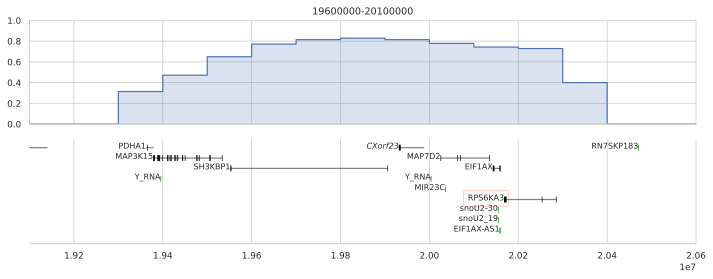

In [60]:
plot_next(0)

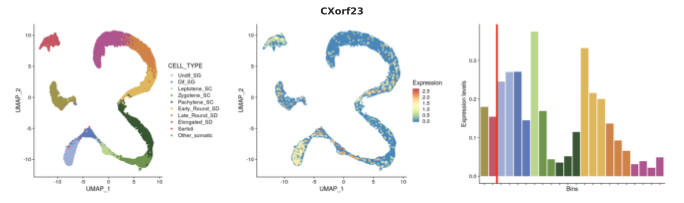

In [58]:
kaessmann_plot('CXorf23')

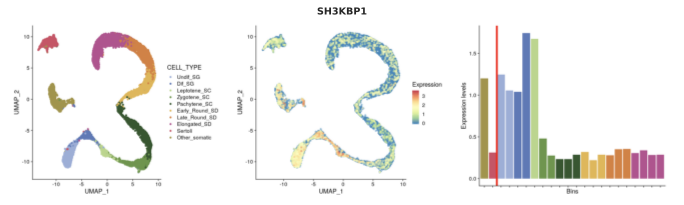

In [59]:
kaessmann_plot('SH3KBP1')

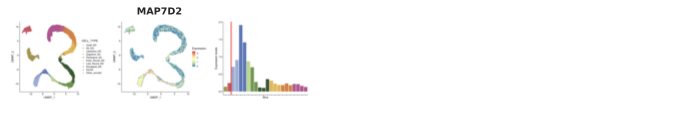

In [60]:
kaessmann_plots(['MAP7D2'])

In [185]:
gi.gene_info(['BCLAF3', 'SH3KBP1', 'MAP7D2'])

**Symbol:** **_BCLAF3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf23  
*BCLAF1 and THRAP3 family member 3*  
**Genomic position:** X:19912860-19991061 (hg38), X:19930978-19988416 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=BCLAF3)  


 ----

**Symbol:** **_SH3KBP1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** AGMX2, CD2BP3, CIN85, GIG10, HSB-1, HSB1, IMD61, MIG18  
*SH3 domain containing kinase binding protein 1*  
**Summary:** This gene encodes an adapter protein that contains one or more N-terminal Src homology domains, a proline rich region and a C-terminal coiled-coil domain. The encoded protein facilitates protein-protein interactions and has been implicated in numerous cellular processes including apoptosis, cytoskeletal rearrangement, cell adhesion and in the regulation of clathrin-dependent endocytosis. Alternate splicing results in multiple transcript variants encoding distinct isoforms. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:19533977-19887600 (hg38), X:19552093-19905719 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SH3KBP1)  


 ----

**Symbol:** **_MAP7D2_** (protein-coding)  
*MAP7 domain containing 2*  
**Genomic position:** X:20006713-20116907 (hg38), X:20024831-20135035 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MAP7D2)  


 ----

### CXorf23 aka BCLAF3

- Entrez Gene Summary: BCLAF3 (BCLAF1 And THRAP3 Family Member 3) is a Protein Coding gene. An important paralog of this gene is THRAP3.
- Differentially expressed


In [186]:
gi.go_info(gi.get_go_terms_for_genes(['BCLAF3']))

**<span style="color:gray;">GO:0003677:</span>** **DNA binding**  
 Any molecular function by which a gene product interacts selectively and non-covalently with DNA (deoxyribonucleic acid).    

 ----

**<span style="color:gray;">GO:0003712:</span>** **transcription coregulator activity**  
 A transcription regulator activity that modulates the transcription of specific gene sets via binding to a DNA-bound DNA-binding transcription factor, either on its own or as part of a complex. Coregulators often act by altering chromatin structure and modifications. For example, one class of transcription coregulators modifies chromatin structure through covalent modification of histones. A second class remodels the conformation of chromatin in an ATP-dependent fashion. A third class modulates interactions of DNA-bound DNA-binding transcription factors with other transcription coregulators.    

 ----

**<span style="color:gray;">GO:0005739:</span>** **mitochondrion**  
 A semiautonomous, self replicating organelle that occurs in varying numbers, shapes, and sizes in the cytoplasm of virtually all eukaryotic cells. It is notably the site of tissue respiration.    

 ----

**<span style="color:gray;">GO:0016592:</span>** **mediator complex**  
 A protein complex that interacts with the carboxy-terminal domain of the largest subunit of RNA polymerase II and plays an active role in transducing the signal from a transcription factor to the transcriptional machinery. The mediator complex is required for activation of transcription of most protein-coding genes, but can also act as a transcriptional corepressor. The Saccharomyces complex contains several identifiable subcomplexes: a head domain comprising Srb2, -4, and -5, Med6, -8, and -11, and Rox3 proteins; a middle domain comprising Med1, -4, and -7, Nut1 and -2, Cse2, Rgr1, Soh1, and Srb7 proteins; a tail consisting of Gal11p, Med2p, Pgd1p, and Sin4p; and a regulatory subcomplex comprising Ssn2, -3, and -8, and Srb8 proteins. Metazoan mediator complexes have similar modular structures and include homologs of yeast Srb and Med proteins.    

 ----

**<span style="color:gray;">GO:0045944:</span>** **positive regulation of transcription by RNA polymerase II**  
 Any process that activates or increases the frequency, rate or extent of transcription from an RNA polymerase II promoter.    

 ----

### SH3KBP1

**Brain**

In [187]:
gi.go_info(gi.get_go_terms_for_genes(['SH3KBP1']))

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005829:</span>** **cytosol**  
 The part of the cytoplasm that does not contain organelles but which does contain other particulate matter, such as protein complexes.    

 ----

**<span style="color:gray;">GO:0005856:</span>** **cytoskeleton**  
 Any of the various filamentous elements that form the internal framework of cells, and typically remain after treatment of the cells with mild detergent to remove membrane constituents and soluble components of the cytoplasm. The term embraces intermediate filaments, microfilaments, microtubules, the microtrabecular lattice, and other structures characterized by a polymeric filamentous nature and long-range order within the cell. The various elements of the cytoskeleton not only serve in the maintenance of cellular shape but also have roles in other cellular functions, including cellular movement, cell division, endocytosis, and movement of organelles.    

 ----

**<span style="color:gray;">GO:0005886:</span>** **plasma membrane**  
 The membrane surrounding a cell that separates the cell from its external environment. It consists of a phospholipid bilayer and associated proteins.    

 ----

**<span style="color:gray;">GO:0005911:</span>** **cell-cell junction**  
 A cell junction that forms a connection between two or more cells of an organism; excludes direct cytoplasmic intercellular bridges, such as ring canals in insects.    

 ----

**<span style="color:gray;">GO:0005925:</span>** **focal adhesion**  
 A cell-substrate junction that anchors the cell to the extracellular matrix and that forms a point of termination of actin filaments. In insects focal adhesion has also been referred to as hemi-adherens junction (HAJ).    

 ----

**<span style="color:gray;">GO:0006897:</span>** **endocytosis**  
 A vesicle-mediated transport process in which cells take up external materials or membrane constituents by the invagination of a small region of the plasma membrane to form a new membrane-bounded vesicle.    

 ----

**<span style="color:gray;">GO:0006915:</span>** **apoptotic process**  
 A programmed cell death process which begins when a cell receives an internal (e.g. DNA damage) or external signal (e.g. an extracellular death ligand), and proceeds through a series of biochemical events (signaling pathway phase) which trigger an execution phase. The execution phase is the last step of an apoptotic process, and is typically characterized by rounding-up of the cell, retraction of pseudopodes, reduction of cellular volume (pyknosis), chromatin condensation, nuclear fragmentation (karyorrhexis), plasma membrane blebbing and fragmentation of the cell into apoptotic bodies. When the execution phase is completed, the cell has died.    

 ----

**<span style="color:gray;">GO:0007010:</span>** **cytoskeleton organization**  
 A process that is carried out at the cellular level which results in the assembly, arrangement of constituent parts, or disassembly of cytoskeletal structures.    

 ----

**<span style="color:gray;">GO:0007015:</span>** **actin filament organization**  
 A process that is carried out at the cellular level which results in the assembly, arrangement of constituent parts, or disassembly of cytoskeletal structures comprising actin filaments. Includes processes that control the spatial distribution of actin filaments, such as organizing filaments into meshworks, bundles, or other structures, as by cross-linking.    

 ----

**<span style="color:gray;">GO:0007267:</span>** **cell-cell signaling**  
 Any process that mediates the transfer of information from one cell to another. This process includes signal transduction in the receiving cell and, where applicable, release of a ligand and any processes that actively facilitate its transport and presentation to the receiving cell.  Examples include signaling via soluble ligands, via cell adhesion molecules and via gap junctions.    

 ----

**<span style="color:gray;">GO:0008360:</span>** **regulation of cell shape**  
 Any process that modulates the surface configuration of a cell.    

 ----

**<span style="color:gray;">GO:0016477:</span>** **cell migration**  
 The controlled self-propelled movement of a cell from one site to a destination guided by molecular cues. Cell migration is a central process in the development and maintenance of multicellular organisms.    

 ----

**<span style="color:gray;">GO:0017124:</span>** **SH3 domain binding**  
 Binding to a SH3 domain (Src homology 3) of a protein, small protein modules containing approximately 50 amino acid residues found in a great variety of intracellular or membrane-associated proteins.    

 ----

**<span style="color:gray;">GO:0030139:</span>** **endocytic vesicle**  
 A membrane-bounded intracellular vesicle formed by invagination of the plasma membrane around an extracellular substance. Endocytic vesicles fuse with early endosomes to deliver the cargo for further sorting.    

 ----

**<span style="color:gray;">GO:0030659:</span>** **cytoplasmic vesicle membrane**  
 The lipid bilayer surrounding a cytoplasmic vesicle.    

 ----

**<span style="color:gray;">GO:0031625:</span>** **ubiquitin protein ligase binding**  
 Binding to a ubiquitin protein ligase enzyme, any of the E3 proteins.    

 ----

**<span style="color:gray;">GO:0043005:</span>** **neuron projection**  
 A prolongation or process extending from a nerve cell, e.g. an axon or dendrite.    

 ----

**<span style="color:gray;">GO:0045202:</span>** **synapse**  
 The junction between an axon of one neuron and a dendrite of another neuron, a muscle fiber or a glial cell. As the axon approaches the synapse it enlarges into a specialized structure, the presynaptic terminal bouton, which contains mitochondria and synaptic vesicles. At the tip of the terminal bouton is the presynaptic membrane; facing it, and separated from it by a minute cleft (the synaptic cleft) is a specialized area of membrane on the receiving cell, known as the postsynaptic membrane. In response to the arrival of nerve impulses, the presynaptic terminal bouton secretes molecules of neurotransmitters into the synaptic cleft. These diffuse across the cleft and transmit the signal to the postsynaptic membrane.    

 ----

**<span style="color:gray;">GO:0050871:</span>** **positive regulation of B cell activation**  
 Any process that activates or increases the frequency, rate or extent of B cell activation.    

 ----

## Peak 2

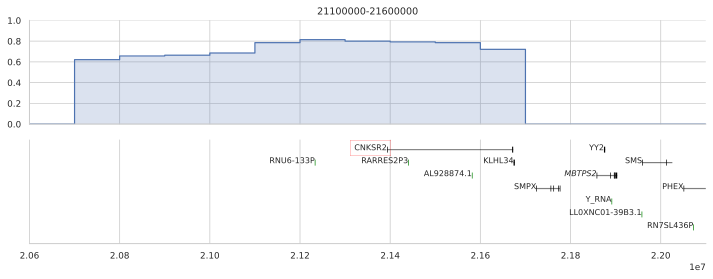

In [61]:
plot_next(1)

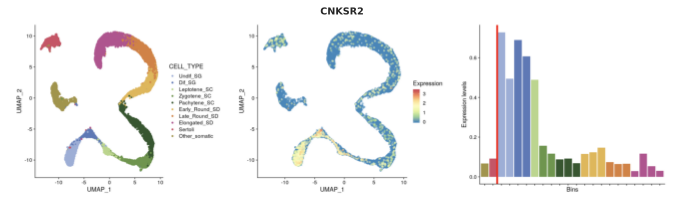

In [190]:
kaessmann_plot('CNKSR2')

In [191]:
gi.gene_info(['CNKSR2'])

**Symbol:** **_CNKSR2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CNK2, KSR2, MAGUIN, MRXSHG  
*connector enhancer of kinase suppressor of Ras 2*  
**Summary:** This gene encodes a multidomain protein that functions as a scaffold protein to mediate the mitogen-activated protein kinase pathways downstream from Ras. This gene product is induced by vitamin D and inhibits apoptosis in certain cancer cells. It may also play a role in ternary complex assembly of synaptic proteins at the postsynaptic membrane and coupling of signal transduction to membrane/cytoskeletal remodeling. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Dec 2009].  
**Genomic position:** X:21372801-21654695 (hg38), X:21392536-21672813 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CNKSR2)  


 ----

### CNKSR2

- Entrez Gene Summary: This gene encodes a multidomain protein that functions as a scaffold protein to mediate the mitogen-activated protein kinase pathways downstream from Ras. This gene product is induced by vitamin D and **inhibits apoptosis** in certain cancer cells. It may also play a role in ternary complex assembly of synaptic proteins at the postsynaptic membrane and coupling of signal transduction to membrane/cytoskeletal remodeling. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Dec 2009].

**Brain**

In [192]:
gi.go_info(gi.get_go_terms_for_genes(['CNKSR2']))

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005886:</span>** **plasma membrane**  
 The membrane surrounding a cell that separates the cell from its external environment. It consists of a phospholipid bilayer and associated proteins.    

 ----

**<span style="color:gray;">GO:0009966:</span>** **regulation of signal transduction**  
 Any process that modulates the frequency, rate or extent of signal transduction.    

 ----

**<span style="color:gray;">GO:0019901:</span>** **protein kinase binding**  
 Binding to a protein kinase, any enzyme that catalyzes the transfer of a phosphate group, usually from ATP, to a protein substrate.    

 ----

**<span style="color:gray;">GO:0035556:</span>** **intracellular signal transduction**  
 The process in which a signal is passed on to downstream components within the cell, which become activated themselves to further propagate the signal and finally trigger a change in the function or state of the cell.    

 ----

**<span style="color:gray;">GO:0042802:</span>** **identical protein binding**  
 Binding to an identical protein or proteins.    

 ----

**<span style="color:gray;">GO:0043005:</span>** **neuron projection**  
 A prolongation or process extending from a nerve cell, e.g. an axon or dendrite.    

 ----

**<span style="color:gray;">GO:0043025:</span>** **neuronal cell body**  
 The portion of a neuron that includes the nucleus, but excludes cell projections such as axons and dendrites.    

 ----

**<span style="color:gray;">GO:0070062:</span>** **extracellular exosome**  
 A vesicle that is released into the extracellular region by fusion of the limiting endosomal membrane of a multivesicular body with the plasma membrane. Extracellular exosomes, also simply called exosomes, have a diameter of about 40-100 nm.    

 ----

**<span style="color:gray;">GO:0098978:</span>** **glutamatergic synapse**  
 A synapse that uses glutamate as a neurotransmitter.    

 ----

**<span style="color:gray;">GO:0099147:</span>** **extrinsic component of postsynaptic density membrane**  
 The component of the postsynaptic density membrane consisting of gene products and protein complexes that are loosely bound to one of its surfaces, but not integrated into the hydrophobic region.    

 ----

**<span style="color:gray;">GO:0099173:</span>** **postsynapse organization**  
 A process that is carried out at the cellular level which results in the assembly, arrangement of constituent parts, or disassembly of a postsynapse.    

 ----

## Peak 3

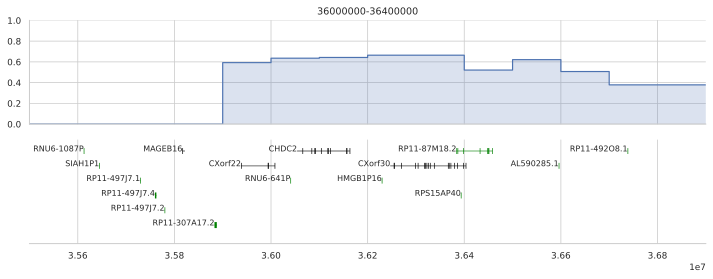

In [62]:
plot_next(2)

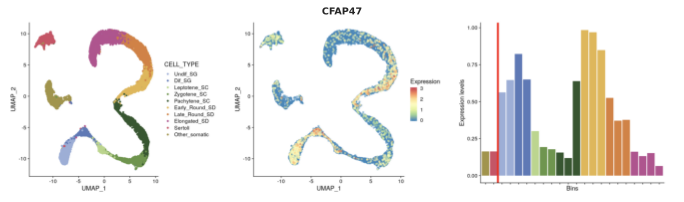

In [194]:
kaessmann_plot('CFAP47')

In [195]:
gi.gene_info('CFAP47') # CHDC2 aka CXorf22 aka CXorf30 aka CFAP47

**Symbol:** **_CFAP47_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CHDC2, CXorf22, CXorf30, CXorf59, SPGF52, SPGFX3  
*cilia and flagella associated protein 47*  
**Summary:** While this gene is well-supported by transcript data, no functional information on its protein product is currently available. [provided by RefSeq, Dec 2009].  
**Genomic position:** X:35919734-36385317 (hg38), X:36053908-36163187 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CFAP47)  


 ----

### CFAP47 (AKA CXorf30 AKA CXorf22)

- Entrez Gene Summary: **cilia and flagella associated** protein 47,  While this gene is well-supported by transcript data, no functional information on its protein product is currently available. [provided by RefSeq, Dec 2009].
- Differentially expressed

In [196]:
gi.go_info(gi.get_go_terms_for_genes(['CFAP47']))

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005856:</span>** **cytoskeleton**  
 Any of the various filamentous elements that form the internal framework of cells, and typically remain after treatment of the cells with mild detergent to remove membrane constituents and soluble components of the cytoplasm. The term embraces intermediate filaments, microfilaments, microtubules, the microtrabecular lattice, and other structures characterized by a polymeric filamentous nature and long-range order within the cell. The various elements of the cytoskeleton not only serve in the maintenance of cellular shape but also have roles in other cellular functions, including cellular movement, cell division, endocytosis, and movement of organelles.    

 ----

**<span style="color:gray;">GO:0007288:</span>** **sperm axoneme assembly**  
 The assembly and organization of the sperm flagellar axoneme, the bundle of microtubules and associated proteins that forms the core of the eukaryotic sperm flagellum, and is responsible for movement.    

 ----

**<span style="color:gray;">GO:0097224:</span>** **sperm connecting piece**  
 The segment of the sperm flagellum that attaches to the implantation fossa of the nucleus in the sperm head; from the remnant of the centriole at this point, the axoneme extends throughout the length of the flagellum.    

 ----

## Peak 4

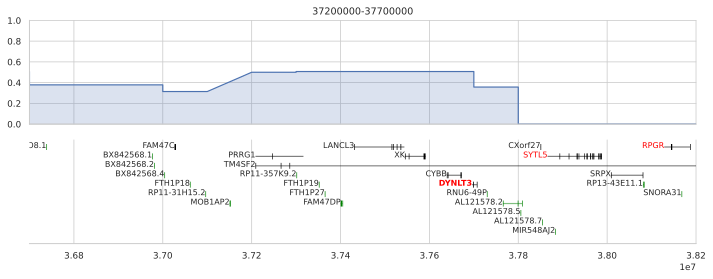

In [63]:
plot_next(3)

### DYNLT3

- Entrez Gene Summary: This gene encodes a member of a subclass of dynein light chains. The encoded protein homodimerizes and forms the **light chain component of the cytoplasmic dynein motor protein complex**. This protein may be important for **binding dynein to specific cargos including the spindle checkpoint protein BUB3**. This protein may also function independently of dynein as a **transcriptional modulator**. Pseudogenes of this gene are found on chromosomes 2 and 20.[provided by RefSeq, Mar 2010]
- A Chlamydomonas Homologue of the Putative Murine t Complex Distorter Tctex-2 Is an Outer Arm Dynein Light Chain (Patel-King et al. 1997)
- Differentially expressed

> Patel-King R. S., S. E. Benashski, A. Harrison, and S. M. King, 1997 A Chlamydomonas Homologue of the Putative Murine t Complex Distorter Tctex-2 Is an Outer Arm Dynein Light Chain. J Cell Biology 137: 1081–1090. https://doi.org/10.1083/jcb.137.5.1081


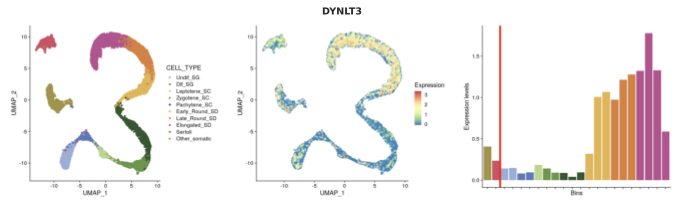

In [198]:
kaessmann_plot('DYNLT3')

TM4SF2 aka TSPAN7

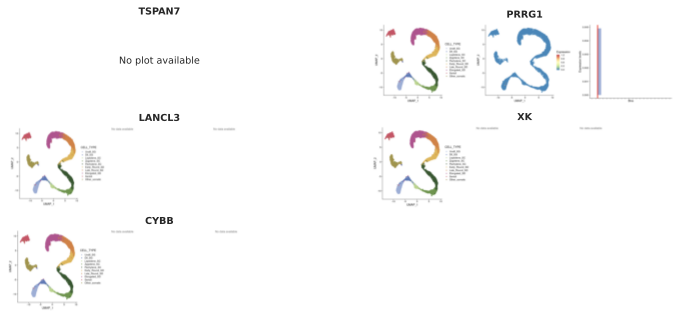

In [199]:
kaessmann_plots(['TSPAN7', 'PRRG1', 'LANCL3', 'XK', 'CYBB'])

In [62]:
gi.gene_info(['DYNLT3'])

**Symbol:** **_DYNLT3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** RP3, TCTE1L, TCTEX1L  
*dynein light chain Tctex-type 3*  
**Summary:** This gene encodes a member of a subclass of dynein light chains. The encoded protein homodimerizes and forms the light chain component of the cytoplasmic dynein motor protein complex. This protein may be important for binding dynein to specific cargos including the spindle checkpoint protein BUB3. This protein may also function independently of dynein as a transcriptional modulator. Pseudogenes of this gene are found on chromosomes 2 and 20.[provided by RefSeq, Mar 2010].  
**Genomic position:** X:37836757-37847571 (hg38), X:37696010-37706890 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=DYNLT3)  


 ----

In [63]:
gi.go_info(gi.get_go_terms_for_genes(['DYNLT3']))

**<span style="color:gray;">GO:0000776:</span>** **kinetochore**  
 A multisubunit complex that is located at the centromeric region of DNA and provides an attachment point for the spindle microtubules.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005868:</span>** **cytoplasmic dynein complex**  
 Any dynein complex with a homodimeric dynein heavy chain core that catalyzes movement along a microtubule. Cytoplasmic dynein complexes participate in many cytoplasmic transport activities in eukaryotes, such as mRNA localization, intermediate filament transport, nuclear envelope breakdown, apoptosis, transport of centrosomal proteins, mitotic spindle assembly, virus transport, kinetochore functions, and movement of signaling and spindle checkpoint proteins. Some complexes participate in intraflagellar transport. Subunits associated with the dynein heavy chain mediate association between dynein heavy chain and cargoes, and may include light chains and light intermediate chains.    

 ----

**<span style="color:gray;">GO:0007018:</span>** **microtubule-based movement**  
 A microtubule-based process that results in the movement of organelles, other microtubules, or other cellular components.  Examples include motor-driven movement along microtubules and movement driven by polymerization or depolymerization of microtubules.    

 ----

**<span style="color:gray;">GO:0007049:</span>** **cell cycle**  
 The progression of biochemical and morphological phases and events that occur in a cell during successive cell replication or nuclear replication events. Canonically, the cell cycle comprises the replication and segregation of genetic material followed by the division of the cell, but in endocycles or syncytial cells nuclear replication or nuclear division may not be followed by cell division.    

 ----

**<span style="color:gray;">GO:0007346:</span>** **regulation of mitotic cell cycle**  
 Any process that modulates the rate or extent of progress through the mitotic cell cycle.    

 ----

**<span style="color:gray;">GO:0042802:</span>** **identical protein binding**  
 Binding to an identical protein or proteins.    

 ----

**<span style="color:gray;">GO:0045505:</span>** **dynein intermediate chain binding**  
 Binding to an intermediate chain of the dynein complex.    

 ----

**<span style="color:gray;">GO:0045931:</span>** **positive regulation of mitotic cell cycle**  
 Any process that activates or increases the rate or extent of progression through the mitotic cell cycle.    

 ----

**<span style="color:gray;">GO:0051301:</span>** **cell division**  
 The process resulting in division and partitioning of components of a cell to form more cells; may or may not be accompanied by the physical separation of a cell into distinct, individually membrane-bounded daughter cells.    

 ----

**<span style="color:gray;">GO:0061673:</span>** **mitotic spindle astral microtubule**  
 Any of the mitotic spindle microtubules that radiate in all directions from the spindle poles and are thought to contribute to the forces that separate the poles and position them in relation to the rest of the cell.    

 ----

## Peak 5

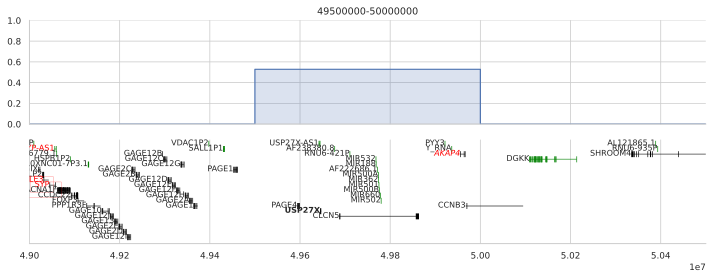

In [64]:
plot_next(4)

In mice the down regulation of CCNB3 marks zygotene-pachytene boundary. I.e. beginning of MCSI.

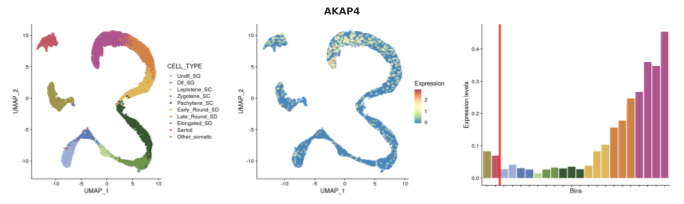

In [65]:
kaessmann_plot('AKAP4')

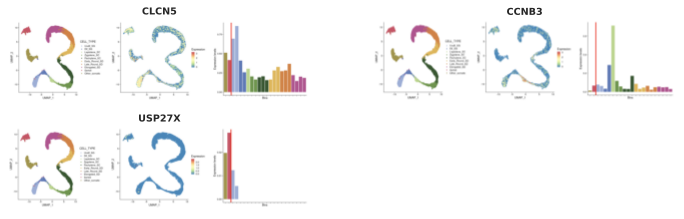

In [66]:
kaessmann_plots(['CLCN5', 'CCNB3', 'USP27X'])

In [137]:
gi.gene_info(['AKAP4', 'CLCN5', 'CCNB3', 'USP27X'])

**Symbol:** **_AKAP4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** AKAP 82, AKAP-4, AKAP82, CT99, FSC1, HI, PRKA4, hAKAP82, p82  
*A-kinase anchoring protein 4*  
**Summary:** The A-kinase anchor proteins (AKAPs) are a group of structurally diverse proteins, which have the common function of binding to the regulatory subunit of protein kinase A (PKA) and confining the holoenzyme to discrete locations within the cell. This gene encodes a member of the AKAP family. The encoded protein is localized to the sperm flagellum and may be involved in the regulation of sperm motility. Alternative splicing of this gene results in two transcript variants encoding different isoforms. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:50190777-50201007 (hg38), HG1436_HG1432_PATCH:50000162-50010412, X:49955406-49965664 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=AKAP4)  


 ----

**Symbol:** **_CLCN5_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CLC5, CLCK2, ClC-5, DENT1, DENTS, NPHL1, NPHL2, XLRH, XRN, hCIC-K2  
*chloride voltage-gated channel 5*  
**Summary:** This gene encodes a member of the ClC family of chloride ion channels and ion transporters. The encoded protein is primarily localized to endosomal membranes and may function to facilitate albumin uptake by the renal proximal tubule. Mutations in this gene have been found in Dent disease and renal tubular disorders complicated by nephrolithiasis. Alternatively spliced transcript variants have been found for this gene. [provided by RefSeq, Jan 2013].  
**Genomic position:** X:49922596-50099235 (hg38), HG1436_HG1432_PATCH:49732014-49908634, X:49687225-49863892 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CLCN5)  


 ----

**Symbol:** **_CCNB3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CYCB3  
*cyclin B3*  
**Summary:** The protein encoded by this gene belongs to the highly conserved cyclin family, whose members are characterized by a dramatic periodicity in protein abundance through the cell cycle. Cyclins function as positive regulators of cyclin-dependent kinases (CDKs), and thereby play an essential role in the control of the cell cycle. Different cyclins exhibit distinct expression and degradation patterns, which contribute to the temporal coordination of each mitotic event. Studies of similar genes in chicken and drosophila suggest that this cyclin may associate with CDC2 and CDK2 kinases, and may be required for proper spindle reorganization and restoration of the interphase nucleus. Alternatively spliced transcript variants encoding different isoforms have been described for this gene. [provided by RefSeq, Oct 2011].  
**Genomic position:** X:50202713-50351914 (hg38), HG1433_PATCH:49967364-50094910, HG1436_HG1432_PATCH:50012112-50159099, X:49967364-50094909 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CCNB3)  


 ----

**Symbol:** **_USP27X_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** MRX105, USP22L, USP27, XLID105  
*ubiquitin specific peptidase 27 X-linked*  
**Summary:** This gene encodes a member of the peptidase protein family. The encoded protein functions as a deubiquitinase that is involved in upregulation of the pro-apoptotic Bim protein. This protein may act as a tumor suppressor by increasing levels of Bim to counteract anti-apoptotic signals in cancer cells. Mutations in this gene have been associated with X-linked cognitive disability. [provided by RefSeq, Dec 2016].  
**Genomic position:** X:49879484-49882558 (hg38), X:49644470-49647166 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=USP27X)  


 ----

### AKAP4

- Entrez Gene Summary: The A-kinase anchor proteins (AKAPs) are a group of structurally diverse proteins, which have the common function of binding to the regulatory subunit of protein kinase A (PKA) and confining the holoenzyme to discrete locations within the cell. This gene encodes a member of the AKAP family. **The encoded protein is localized to the sperm flagellum and may be involved in the regulation of sperm motility**. Alternative splicing of this gene results in two transcript variants encoding different isoforms. [provided by RefSeq, Jul 2008]
- Differentially expressed

In [138]:
gi.go_info(gi.get_go_terms_for_genes(['AKAP4']))

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005856:</span>** **cytoskeleton**  
 Any of the various filamentous elements that form the internal framework of cells, and typically remain after treatment of the cells with mild detergent to remove membrane constituents and soluble components of the cytoplasm. The term embraces intermediate filaments, microfilaments, microtubules, the microtrabecular lattice, and other structures characterized by a polymeric filamentous nature and long-range order within the cell. The various elements of the cytoskeleton not only serve in the maintenance of cellular shape but also have roles in other cellular functions, including cellular movement, cell division, endocytosis, and movement of organelles.    

 ----

**<span style="color:gray;">GO:0005952:</span>** **cAMP-dependent protein kinase complex**  
 An enzyme complex, composed of regulatory and catalytic subunits, that catalyzes protein phosphorylation. Inactive forms of the enzyme have two regulatory chains and two catalytic chains; activation by cAMP produces two active catalytic monomers and a regulatory dimer.    

 ----

**<span style="color:gray;">GO:0007165:</span>** **signal transduction**  
 The cellular process in which a signal is conveyed to trigger a change in the activity or state of a cell. Signal transduction begins with reception of a signal (e.g. a ligand binding to a receptor or receptor activation by a stimulus such as light), or for signal transduction in the absence of ligand, signal-withdrawal or the activity of a constitutively active receptor. Signal transduction ends with regulation of a downstream cellular process, e.g. regulation of transcription or regulation of a metabolic process. Signal transduction covers signaling from receptors located on the surface of the cell and signaling via molecules located within the cell. For signaling between cells, signal transduction is restricted to events at and within the receiving cell.    

 ----

**<span style="color:gray;">GO:0007178:</span>** **transmembrane receptor protein serine/threonine kinase signaling pathway**  
 The series of molecular signals initiated by an extracellular ligand binding to a receptor on the surface of the target cell where the receptor possesses serine/threonine kinase activity, and ending with the regulation of a downstream cellular process, e.g. transcription.    

 ----

**<span style="color:gray;">GO:0007338:</span>** **single fertilization**  
 The union of male and female gametes to form a zygote.    

 ----

**<span style="color:gray;">GO:0008104:</span>** **protein localization**  
 Any process in which a protein is transported to, or maintained in, a specific location.    

 ----

**<span style="color:gray;">GO:0030018:</span>** **Z disc**  
 Platelike region of a muscle sarcomere to which the plus ends of actin filaments are attached.    

 ----

**<span style="color:gray;">GO:0030317:</span>** **flagellated sperm motility**  
 The directed, self-propelled movement of a cilium (aka flagellum) that contributes to the movement of a flagellated sperm.    

 ----

**<span style="color:gray;">GO:0031514:</span>** **motile cilium**  
 A cilium which may have a variable arrangement of axonemal microtubules and also contains molecular motors. It may beat with a whip-like pattern that promotes cell motility or transport of fluids and other cells across a cell surface, such as on epithelial cells that line the lumenal ducts of various tissues; or they may display a distinct twirling motion that directs fluid flow asymmetrically across the cellular surface to affect asymmetric body plan organization. Motile cilia can be found in single as well as multiple copies per cell.    

 ----

**<span style="color:gray;">GO:0035686:</span>** **sperm fibrous sheath**  
 A cytoskeletal structure surrounding the axoneme and outer dense fibers of the sperm flagellum. Consists of two longitudinal columns connected by closely arrayed semicircular ribs that assemble from distal to proximal throughout spermiogenesis. The fibrous sheath probably influences the degree of flexibility, plane of flagellar motion, and the shape of the flagellar beat.    

 ----

**<span style="color:gray;">GO:0044458:</span>** **motile cilium assembly**  
 The aggregation, arrangement and bonding together of a set of components to form a motile cilium.    

 ----

**<span style="color:gray;">GO:0045184:</span>** **establishment of protein localization**  
 The directed movement of a protein to a specific location.    

 ----

**<span style="color:gray;">GO:0048471:</span>** **perinuclear region of cytoplasm**  
 Cytoplasm situated near, or occurring around, the nucleus.    

 ----

**<span style="color:gray;">GO:0051018:</span>** **protein kinase A binding**  
 Binding to a protein kinase A.    

 ----

**<span style="color:gray;">GO:0097224:</span>** **sperm connecting piece**  
 The segment of the sperm flagellum that attaches to the implantation fossa of the nucleus in the sperm head; from the remnant of the centriole at this point, the axoneme extends throughout the length of the flagellum.    

 ----

**<span style="color:gray;">GO:0097225:</span>** **sperm midpiece**  
 The highly organized segment of the sperm flagellum which begins at the connecting piece and is characterized by the presence of 9 outer dense fibers (ODFs) that lie outside each of the 9 outer axonemal microtubule doublets and by a sheath of mitochondria that encloses the ODFs and the axoneme; the midpiece terminates about one-fourth of the way down the sperm flagellum at the annulus, which marks the beginning of the principal piece.    

 ----

**<span style="color:gray;">GO:0097228:</span>** **sperm principal piece**  
 The segment of the sperm flagellum where the mitochondrial sheath ends, and the outer dense fibers (ODFs) associated with outer axonemal doublets 3 and 8 are replaced by the 2 longitudinal columns of the fibrous sheath (FS) which run the length of the principal piece and are stabilized by circumferential ribs. The principal piece makes up ~2/3 of the length of the sperm flagellum and is defined by the presence of the FS and of only 7 (rather than 9) ODFs which taper and then terminate near the distal end of the principal piece.    

 ----

**<span style="color:gray;">GO:0097229:</span>** **sperm end piece**  
 The short tip of the sperm flagellum, adjacent to the sperm principal piece and furthest from the sperm head, which contains only the axoneme surrounded by the plasma membrane.    

 ----

## Peak 6

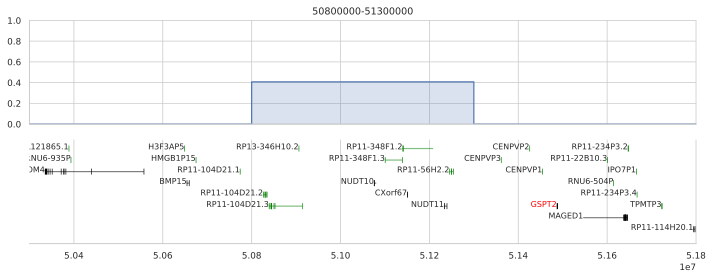

In [65]:
plot_next(5)

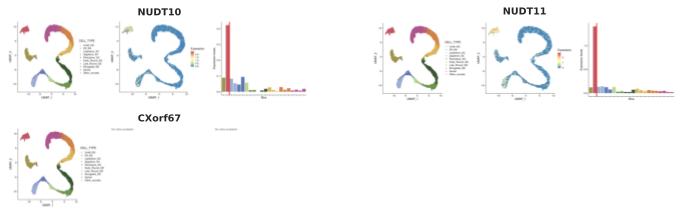

In [140]:
kaessmann_plots(['NUDT10', 'NUDT11', 'CXorf67'])

### ???

- ...

## Peak 7

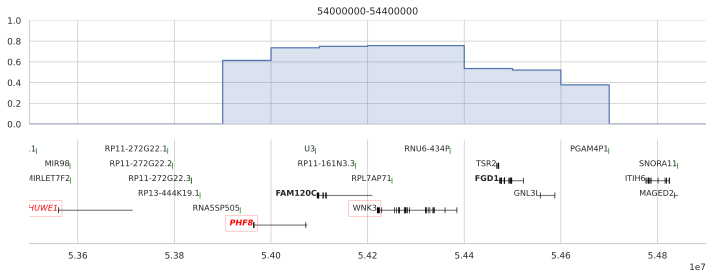

In [66]:
plot_next(6)

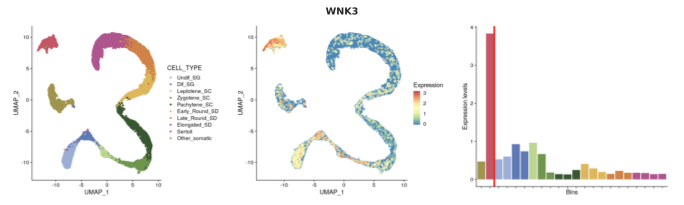

In [67]:
kaessmann_plot('WNK3')

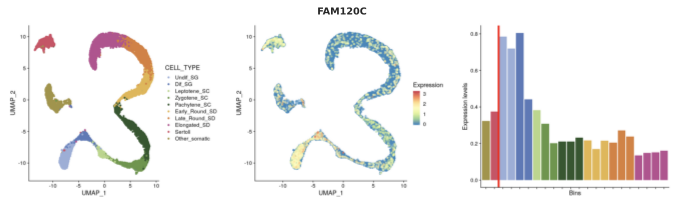

In [68]:
kaessmann_plot('FAM120C')

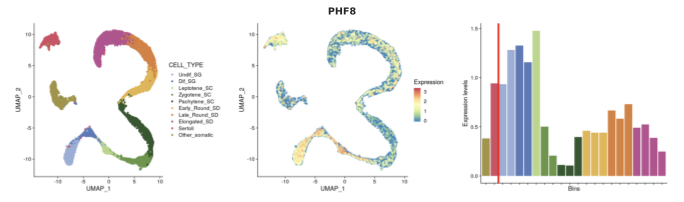

In [144]:
kaessmann_plot('PHF8')

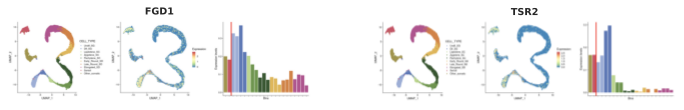

In [145]:
kaessmann_plots(['FGD1', 'TSR2'])

In [146]:
gi.gene_info(['PHF8', 'WNK3', 'FAM120C', 'FGD1', 'TSR2'])

**Symbol:** **_PHF8_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** JHDM1F, KDM7B, MRXSSD, ZNF422  
*PHD finger protein 8*  
**Summary:** The protein encoded by this gene is a histone lysine demethylase that preferentially acts on histones in the monomethyl or dimethyl states. The encoded protein requires Fe(2+) ion, 2-oxoglutarate, and oxygen for its catalytic activity. The protein has an N-terminal PHD finger and a central Jumonji C domain. This gene is thought to function as a transcription activator. Defects in this gene are a cause of syndromic X-linked Siderius type intellectual disability (MRXSSD) and over-expression of this gene is associated with several forms of cancer. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:53936676-54048958 (hg38), HG1433_PATCH:53679676-53791958, X:53963109-54075391 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PHF8)  


 ----

**Symbol:** **_WNK3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PRKWNK3  
*WNK lysine deficient protein kinase 3*  
**Summary:** This gene encodes a protein belonging to the 'with no lysine' family of serine-threonine protein kinases. These family members lack the catalytic lysine in subdomain II, and instead have a conserved lysine in subdomain I. This family member functions as a positive regulator of the transcellular Ca2+ transport pathway, and it plays a role in the increase of cell survival in a caspase-3-dependent pathway. Alternative splicing results in multiple transcript variants. [provided by RefSeq, May 2010].  
**Genomic position:** X:54192823-54358642 (hg38), HG1433_PATCH:53935823-54101642, X:54219256-54385075 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=WNK3)  


 ----

**Symbol:** **_FAM120C_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf17, ORF34  
*family with sequence similarity 120C*  
**Summary:** This gene encodes a potential transmembrane protein and lies in a region where mutations and deletions have been associated with intellectual disability and autism. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Aug 2011].  
**Genomic position:** X:54068324-54183281 (hg38), HG1433_PATCH:53811324-53926281, X:54094757-54209714 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=FAM120C)  


 ----

**Symbol:** **_FGD1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** AAS, FGDY, MRXS16, ZFYVE3  
*FYVE, RhoGEF and PH domain containing 1*  
**Summary:** This gene encodes a protein that contains Dbl (DH) and pleckstrin (PH) homology domains and is similar to the Rho family of small GTP-binding proteins. The encoded protein specifically binds to the Rho family GTPase Cdc42Hs and can stimulate the GDP-GTP exchange of the isoprenylated form of Cdc42Hs. It also stimulates the mitogen activated protein kinase cascade leading to c-Jun kinase SAPK/JNK1 activation. Defects in this gene are the cause of the faciogenital dysplasia in Aarskog-Scott syndrome and a syndromatic form of X-linked cognitive disability. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:54445454-54496234 (hg38), X:54471887-54522599 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=FGD1)  


 ----

**Symbol:** **_TSR2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DBA14, DT1P1A10, WGG1  
*TSR2 ribosome maturation factor*  
**Summary:** The protein encoded by this gene appears to repress the transcription of NF-kappaB and may be involved in apoptosis. Defects in this gene are a cause of Diamond-Blackfan anemia. [provided by RefSeq, Oct 2016].  
**Genomic position:** X:54440404-54448032 (hg38), X:54466834-54471920 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TSR2)  


 ----

### PHF8

- Entrez Gene Summary: The protein encoded by this gene is a histone lysine demethylase that preferentially acts on histones in the monomethyl or dimethyl states. The encoded protein requires Fe(2+) ion, 2-oxoglutarate, and oxygen for its catalytic activity. The protein has an N-terminal PHD finger and a central Jumonji C domain. **This gene is thought to function as a transcription activator**. Defects in this gene are a cause of syndromic X-linked Siderius type intellectual disability (MRXSSD) and over-expression of this gene is associated with several forms of cancer. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Jul 2017]
- Differentially expressed

**Brain**

In [147]:
gi.go_info(gi.get_go_terms_for_genes(['PHF8']))

**<span style="color:gray;">GO:0000082:</span>** **G1/S transition of mitotic cell cycle**  
 The mitotic cell cycle transition by which a cell in G1 commits to S phase. The process begins with the build up of G1 cyclin-dependent kinase (G1 CDK), resulting in the activation of transcription of G1 cyclins. The process ends with the positive feedback of the G1 cyclins on the G1 CDK which commits the cell to S phase, in which DNA replication is initiated.    

 ----

**<span style="color:gray;">GO:0003682:</span>** **chromatin binding**  
 Binding to chromatin, the network of fibers of DNA, protein, and sometimes RNA, that make up the chromosomes of the eukaryotic nucleus during interphase.    

 ----

**<span style="color:gray;">GO:0003712:</span>** **transcription coregulator activity**  
 A transcription regulator activity that modulates the transcription of specific gene sets via binding to a DNA-bound DNA-binding transcription factor, either on its own or as part of a complex. Coregulators often act by altering chromatin structure and modifications. For example, one class of transcription coregulators modifies chromatin structure through covalent modification of histones. A second class remodels the conformation of chromatin in an ATP-dependent fashion. A third class modulates interactions of DNA-bound DNA-binding transcription factors with other transcription coregulators.    

 ----

**<span style="color:gray;">GO:0005506:</span>** **iron ion binding**  
 Binding to an iron (Fe) ion.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0005654:</span>** **nucleoplasm**  
 That part of the nuclear content other than the chromosomes or the nucleolus.    

 ----

**<span style="color:gray;">GO:0005730:</span>** **nucleolus**  
 A small, dense body one or more of which are present in the nucleus of eukaryotic cells. It is rich in RNA and protein, is not bounded by a limiting membrane, and is not seen during mitosis. Its prime function is the transcription of the nucleolar DNA into 45S ribosomal-precursor RNA, the processing of this RNA into 5.8S, 18S, and 28S components of ribosomal RNA, and the association of these components with 5S RNA and proteins synthesized outside the nucleolus. This association results in the formation of ribonucleoprotein precursors; these pass into the cytoplasm and mature into the 40S and 60S subunits of the ribosome.    

 ----

**<span style="color:gray;">GO:0006325:</span>** **chromatin organization**  
 Any process that results in the specification, formation or maintenance of the physical structure of eukaryotic chromatin.    

 ----

**<span style="color:gray;">GO:0006357:</span>** **regulation of transcription by RNA polymerase II**  
 Any process that modulates the frequency, rate or extent of transcription mediated by RNA polymerase II.    

 ----

**<span style="color:gray;">GO:0006482:</span>** **protein demethylation**  
 The removal of a methyl group, from a protein amino acid. A methyl group is derived from methane by the removal of a hydrogen atom.    

 ----

**<span style="color:gray;">GO:0007420:</span>** **brain development**  
 The process whose specific outcome is the progression of the brain over time, from its formation to the mature structure. Brain development begins with patterning events in the neural tube and ends with the mature structure that is the center of thought and emotion. The brain is responsible for the coordination and control of bodily activities and the interpretation of information from the senses (sight, hearing, smell, etc.).    

 ----

**<span style="color:gray;">GO:0008270:</span>** **zinc ion binding**  
 Binding to a zinc ion (Zn).    

 ----

**<span style="color:gray;">GO:0016706:</span>** **2-oxoglutarate-dependent dioxygenase activity**  
 Catalysis of the reaction: A + 2-oxoglutarate + O2 = B + succinate + CO2. This is an oxidation-reduction (redox) reaction in which hydrogen or electrons are transferred from 2-oxoglutarate and one other donor, and one atom of oxygen is incorporated into each donor.    

 ----

**<span style="color:gray;">GO:0031965:</span>** **nuclear membrane**  
 Either of the lipid bilayers that surround the nucleus and form the nuclear envelope; excludes the intermembrane space.    

 ----

**<span style="color:gray;">GO:0032452:</span>** **histone demethylase activity**  
 Catalysis of the removal of a methyl group from a histone.    

 ----

**<span style="color:gray;">GO:0032454:</span>** **histone H3-methyl-lysine-9 demethylase activity**  
 Catalysis of the removal of a methyl group from a modified lysine residue at position 9 of the histone H3 protein.    

 ----

**<span style="color:gray;">GO:0033169:</span>** **histone H3-K9 demethylation**  
 The modification of histone H3 by the removal of a methyl group from lysine at position 9 of the histone.    

 ----

**<span style="color:gray;">GO:0035064:</span>** **methylated histone binding**  
 Binding to a histone in which a residue has been modified by methylation. Histones are any of a group of water-soluble proteins found in association with the DNA of eukaroytic chromosomes.    

 ----

**<span style="color:gray;">GO:0035574:</span>** **histone H4-K20 demethylation**  
 The modification of histone H4 by the removal of a methyl group from lysine at position 20 of the histone.    

 ----

**<span style="color:gray;">GO:0035575:</span>** **histone H4-methyl-lysine-20 demethylase activity**  
 Catalysis of the removal of the methyl group from a modified lysine residue at position 20 of the histone H4 protein. This is a dioxygenase reaction that is dependent on Fe(II) and 2-oxoglutarate.    

 ----

**<span style="color:gray;">GO:0045893:</span>** **positive regulation of transcription, DNA-templated**  
 Any process that activates or increases the frequency, rate or extent of cellular DNA-templated transcription.    

 ----

**<span style="color:gray;">GO:0045943:</span>** **positive regulation of transcription by RNA polymerase I**  
 Any process that activates or increases the frequency, rate or extent of transcription mediated by RNA polymerase I.    

 ----

**<span style="color:gray;">GO:0051864:</span>** **histone H3-methyl-lysine-36 demethylase activity**  
 Catalysis of the removal of a methyl group from a modified lysine residue at position 36 of the histone H3 protein. This is a dioxygenase reaction that is dependent on Fe(II) and 2-oxoglutarate.    

 ----

**<span style="color:gray;">GO:0061188:</span>** **negative regulation of ribosomal DNA heterochromatin assembly**  
 Any process that decreases the rate, frequency, or extent of the repression of assembly of rDNA heterochromatin.    

 ----

**<span style="color:gray;">GO:0070544:</span>** **histone H3-K36 demethylation**  
 The modification of histone H3 by the removal of a methyl group from lysine at position 36 of the histone.    

 ----

**<span style="color:gray;">GO:0071557:</span>** **histone H3-K27 demethylation**  
 The modification of histone H3 by the removal of a methyl group from lysine at position 27 of the histone.    

 ----

**<span style="color:gray;">GO:0071558:</span>** **histone H3-tri/di-methyl-lysine-27 demethylase activity**  
 Catalysis of the removal of a methyl group from a tri- or a dimethyl-lysine residue at position 27 of the histone H3 protein. This is a dioxygenase reaction that is dependent on Fe(II) and 2-oxoglutarate.    

 ----

**<span style="color:gray;">GO:0140680:</span>** **histone H3-di/monomethyl-lysine-36 demethylase activity**  
 Catalysis of the removal of a methyl group from a di- or a monomethyl-lysine residue at position 36 of the histone H3 protein. This is a dioxygenase reaction that is dependent on Fe(II) and 2-oxoglutarate.    

 ----

**<span style="color:gray;">GO:0140683:</span>** **histone H3-di/monomethyl-lysine-9 demethylase activity**  
 Catalysis of the removal of a methyl group from a di or a monomethyl-lysine residue at position 9 of the histone H3 protein. This is a dioxygenase reaction that is dependent on Fe(II) and 2-oxoglutarate.    

 ----

### FAM120C

**Brain**

In [148]:
gi.go_info(gi.get_go_terms_for_genes(['FAM120C']))

**<span style="color:gray;">GO:0003723:</span>** **RNA binding**  
 Binding to an RNA molecule or a portion thereof.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

### WNK3

[increases cell survival in a caspase-3-dependent pathway](https://www.nature.com/articles/1209449)

**Brain**

In [149]:
gi.go_info(gi.get_go_terms_for_genes(['WNK3']))

**<span style="color:gray;">GO:0004672:</span>** **protein kinase activity**  
 Catalysis of the phosphorylation of an amino acid residue in a protein, usually according to the reaction: a protein + ATP = a phosphoprotein + ADP.    

 ----

**<span style="color:gray;">GO:0004674:</span>** **protein serine/threonine kinase activity**  
 Catalysis of the reactions: ATP + protein serine = ADP + protein serine phosphate, and ATP + protein threonine = ADP + protein threonine phosphate.    

 ----

**<span style="color:gray;">GO:0004712:</span>** **protein serine/threonine/tyrosine kinase activity**  
 Catalysis of the reactions: ATP + a protein serine = ADP + protein serine phosphate; ATP + a protein threonine = ADP + protein threonine phosphate; and ATP + a protein tyrosine = ADP + protein tyrosine phosphate.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005524:</span>** **ATP binding**  
 Binding to ATP, adenosine 5'-triphosphate, a universally important coenzyme and enzyme regulator.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005829:</span>** **cytosol**  
 The part of the cytoplasm that does not contain organelles but which does contain other particulate matter, such as protein complexes.    

 ----

**<span style="color:gray;">GO:0005912:</span>** **adherens junction**  
 A cell-cell junction composed of the epithelial cadherin-catenin complex. The epithelial cadherins, or E-cadherins, of each interacting cell extend through the plasma membrane into the extracellular space and bind to each other. The E-cadherins bind to catenins on the cytoplasmic side of the membrane, where the E-cadherin-catenin complex binds to cytoskeletal components and regulatory and signaling molecules.    

 ----

**<span style="color:gray;">GO:0005923:</span>** **bicellular tight junction**  
 An occluding cell-cell junction that is composed of a branching network of sealing strands that completely encircles the apical end of each cell in an epithelial sheet; the outer leaflets of the two interacting plasma membranes are seen to be tightly apposed where sealing strands are present. Each sealing strand is composed of a long row of transmembrane adhesion proteins embedded in each of the two interacting plasma membranes.    

 ----

**<span style="color:gray;">GO:0006468:</span>** **protein phosphorylation**  
 The process of introducing a phosphate group on to a protein.    

 ----

**<span style="color:gray;">GO:0006884:</span>** **cell volume homeostasis**  
 Any process involved in maintaining the steady state of a cell's volume. The cell's volume refers to the three-dimensional space occupied by a cell.    

 ----

**<span style="color:gray;">GO:0007231:</span>** **osmosensory signaling pathway**  
 The series of molecular signals initiated in response to osmotic change.    

 ----

**<span style="color:gray;">GO:0010765:</span>** **positive regulation of sodium ion transport**  
 Any process that increases the frequency, rate or extent of the directed movement of sodium ions (Na+) into, out of or within a cell, or between cells, by means of some agent such as a transporter or pore.    

 ----

**<span style="color:gray;">GO:0010766:</span>** **negative regulation of sodium ion transport**  
 Any process that decreases the frequency, rate or extent of the directed movement of sodium ions (Na+) into, out of or within a cell, or between cells, by means of some agent such as a transporter or pore.    

 ----

**<span style="color:gray;">GO:0010800:</span>** **positive regulation of peptidyl-threonine phosphorylation**  
 Any process that increases the frequency, rate or extent of peptidyl-threonine phosphorylation. Peptidyl-threonine phosphorylation is the phosphorylation of peptidyl-threonine to form peptidyl-O-phospho-L-threonine.    

 ----

**<span style="color:gray;">GO:0018107:</span>** **peptidyl-threonine phosphorylation**  
 The phosphorylation of peptidyl-threonine to form peptidyl-O-phospho-L-threonine.    

 ----

**<span style="color:gray;">GO:0019869:</span>** **chloride channel inhibitor activity**  
 Binds to and stops, prevents, or reduces the activity of a chloride channel.    

 ----

**<span style="color:gray;">GO:0019870:</span>** **potassium channel inhibitor activity**  
 Binds to and stops, prevents, or reduces the activity of a potassium channel.    

 ----

**<span style="color:gray;">GO:0032414:</span>** **positive regulation of ion transmembrane transporter activity**  
 Any process that activates or increases the activity of an ion transporter.    

 ----

**<span style="color:gray;">GO:0035556:</span>** **intracellular signal transduction**  
 The process in which a signal is passed on to downstream components within the cell, which become activated themselves to further propagate the signal and finally trigger a change in the function or state of the cell.    

 ----

**<span style="color:gray;">GO:0035633:</span>** **maintenance of blood-brain barrier**  
 Maintaining the structure and function of the blood-brain barrier, thus ensuring specific regulated transport of substances (e.g. macromolecules, small molecules, ions) into the brain, and out of the brain into the blood circulation.    

 ----

**<span style="color:gray;">GO:0043066:</span>** **negative regulation of apoptotic process**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of cell death by apoptotic process.    

 ----

**<span style="color:gray;">GO:0046777:</span>** **protein autophosphorylation**  
 The phosphorylation by a protein of one or more of its own amino acid residues (cis-autophosphorylation), or residues on an identical protein (trans-autophosphorylation).    

 ----

**<span style="color:gray;">GO:0050801:</span>** **ion homeostasis**  
 Any process involved in the maintenance of an internal steady state of ions within an organism or cell.    

 ----

**<span style="color:gray;">GO:0051928:</span>** **positive regulation of calcium ion transport**  
 Any process that activates or increases the frequency, rate or extent of the directed movement of calcium ions into, out of or within a cell, or between cells, by means of some agent such as a transporter or pore.    

 ----

**<span style="color:gray;">GO:0072659:</span>** **protein localization to plasma membrane**  
 A process in which a protein is transported to, or maintained in, a specific location in the plasma membrane.    

 ----

**<span style="color:gray;">GO:0090279:</span>** **regulation of calcium ion import**  
 Any process that modulates the rate, frequency, or extent of the directed movement of calcium ions into a cell or organelle.    

 ----

**<span style="color:gray;">GO:0106310:</span>** **protein serine kinase activity**  
 Catalysis of the reactions: ATP + protein serine = ADP + protein serine phosphate.    

 ----

**<span style="color:gray;">GO:1903078:</span>** **positive regulation of protein localization to plasma membrane**  
 Any process that activates or increases the frequency, rate or extent of protein localization to plasma membrane.    

 ----

**<span style="color:gray;">GO:1903288:</span>** **positive regulation of potassium ion import across plasma membrane**  
 Any process that activates or increases the frequency, rate or extent of potassium ion import across the plasma membrane.    

 ----

**<span style="color:gray;">GO:1904062:</span>** **regulation of cation transmembrane transport**  
 Any process that modulates the frequency, rate or extent of cation transmembrane transport.    

 ----

**<span style="color:gray;">GO:2000651:</span>** **positive regulation of sodium ion transmembrane transporter activity**  
 Any process that activates or increases the frequency, rate or extent of sodium ion transmembrane transporter activity.    

 ----

## Peak 8

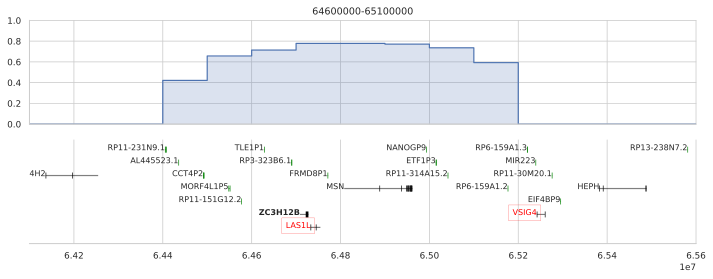

In [69]:
plot_next(7)

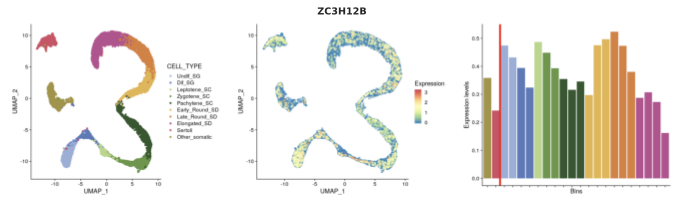

In [151]:
kaessmann_plot('ZC3H12B')

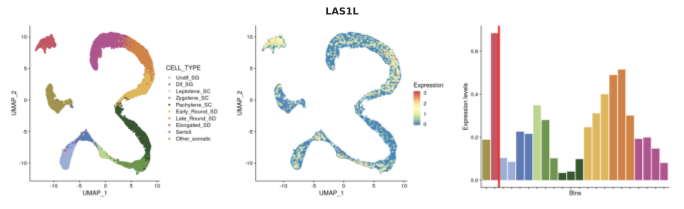

In [152]:
kaessmann_plot('LAS1L')

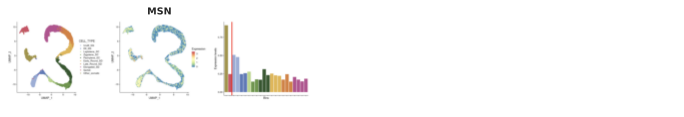

In [153]:
kaessmann_plots(['MSN'])

In [155]:
gi.gene_info(['ZC3H12B', 'LAS1L', 'MSN'])

**Symbol:** **_ZC3H12B_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf32, MCPIP2  
*zinc finger CCCH-type containing 12B*  
**Summary:** The protein encoded by this gene belongs to a family of CCCH-type zinc finger proteins that are involved in the proinflammatory activation of macrophages. The exact function of this family member is unknown, but it is thought to function as a ribonuclease. [provided by RefSeq, May 2010].  
**Genomic position:** X:65034788-65507887 (hg38), X:64708615-64727767 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ZC3H12B)  


 ----

**Symbol:** **_LAS1L_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** Las1, Las1-like, MRXSWTS, WTS, dJ475B7.2  
*LAS1 like ribosome biogenesis factor*  
**Genomic position:** X:65438549-65534810 (hg38), X:64732462-64754655 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=LAS1L)  


 ----

**Symbol:** **_MSN_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HEL70, IMD50  
*moesin*  
**Summary:** Moesin (for membrane-organizing extension spike protein) is a member of the ERM family which includes ezrin and radixin. ERM proteins appear to function as cross-linkers between plasma membranes and actin-based cytoskeletons. Moesin is localized to filopodia and other membranous protrusions that are important for cell-cell recognition and signaling and for cell movement. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:65588377-65741931 (hg38), X:64808257-64961791 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MSN)  


 ----

### ZC3H12B

- ...

In [156]:
gi.go_info(gi.get_go_terms_for_genes(['ZC3H12B']))

**<span style="color:gray;">GO:0003729:</span>** **mRNA binding**  
 Binding to messenger RNA (mRNA), an intermediate molecule between DNA and protein. mRNA includes UTR and coding sequences, but does not contain introns.    

 ----

**<span style="color:gray;">GO:0004521:</span>** **endoribonuclease activity**  
 Catalysis of the hydrolysis of ester linkages within ribonucleic acid by creating internal breaks.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0036464:</span>** **cytoplasmic ribonucleoprotein granule**  
 A ribonucleoprotein granule located in the cytoplasm.    

 ----

**<span style="color:gray;">GO:0046872:</span>** **metal ion binding**  
 Binding to a metal ion.    

 ----

**<span style="color:gray;">GO:0090502:</span>** **RNA phosphodiester bond hydrolysis, endonucleolytic**  
 The chemical reactions and pathways involving the hydrolysis of internal 3',5'-phosphodiester bonds in one or two strands of ribonucleotides.    

 ----

### LAS1L

- Differentially expressed

In [157]:
gi.go_info(gi.get_go_terms_for_genes(['LAS1L']))

**<span style="color:gray;">GO:0000460:</span>** **maturation of 5.8S rRNA**  
 Any process involved in the maturation of a precursor 5.8S ribosomal RNA (rRNA) molecule into a mature 5.8S rRNA molecule.    

 ----

**<span style="color:gray;">GO:0000470:</span>** **maturation of LSU-rRNA**  
 Any process involved in the maturation of a precursor Large SubUnit (LSU) ribosomal RNA (rRNA) molecule into a mature LSU-rRNA molecule.    

 ----

**<span style="color:gray;">GO:0003723:</span>** **RNA binding**  
 Binding to an RNA molecule or a portion thereof.    

 ----

**<span style="color:gray;">GO:0004519:</span>** **endonuclease activity**  
 Catalysis of the hydrolysis of ester linkages within nucleic acids by creating internal breaks.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005654:</span>** **nucleoplasm**  
 That part of the nuclear content other than the chromosomes or the nucleolus.    

 ----

**<span style="color:gray;">GO:0005730:</span>** **nucleolus**  
 A small, dense body one or more of which are present in the nucleus of eukaryotic cells. It is rich in RNA and protein, is not bounded by a limiting membrane, and is not seen during mitosis. Its prime function is the transcription of the nucleolar DNA into 45S ribosomal-precursor RNA, the processing of this RNA into 5.8S, 18S, and 28S components of ribosomal RNA, and the association of these components with 5S RNA and proteins synthesized outside the nucleolus. This association results in the formation of ribonucleoprotein precursors; these pass into the cytoplasm and mature into the 40S and 60S subunits of the ribosome.    

 ----

**<span style="color:gray;">GO:0016020:</span>** **membrane**  
 A lipid bilayer along with all the proteins and protein complexes embedded in it an attached to it.    

 ----

**<span style="color:gray;">GO:0030687:</span>** **preribosome, large subunit precursor**  
 A preribosomal complex consisting of 27SA, 27SB, and/or 7S pre-rRNA, 5S rRNA, ribosomal proteins including late-associating large subunit proteins, and associated proteins; a precursor of the eukaryotic cytoplasmic large ribosomal subunit.    

 ----

**<span style="color:gray;">GO:0071339:</span>** **MLL1 complex**  
 A protein complex that can methylate lysine-4 of histone H3. MLL1/MLL is the catalytic methyltransferase subunit, and the complex also contains the core components ASH2L, HCFC1/HCF1 WDR5 and RBBP5.    

 ----

**<span style="color:gray;">GO:0090305:</span>** **nucleic acid phosphodiester bond hydrolysis**  
 The nucleic acid metabolic process in which the phosphodiester bonds between nucleotides are cleaved by hydrolysis.    

 ----

**<span style="color:gray;">GO:0090730:</span>** **Las1 complex**  
 A four subunit complex, that comprises all the necessary RNA processing enzymes (endonuclease, polynucleotide kinase, and exonuclease) to mediate 'cistronic rRNA transcript ITS2 (internal transcribed spacer) cleavage' (GO:0000448).    

 ----

## Peak 9

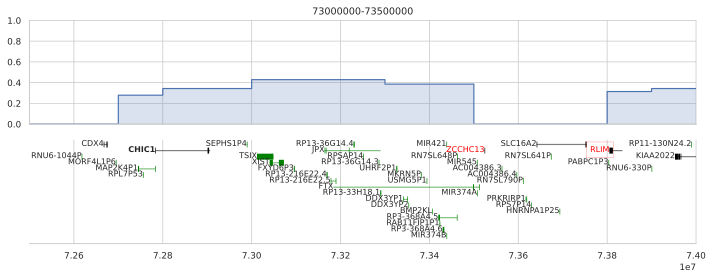

In [70]:
plot_next(8)

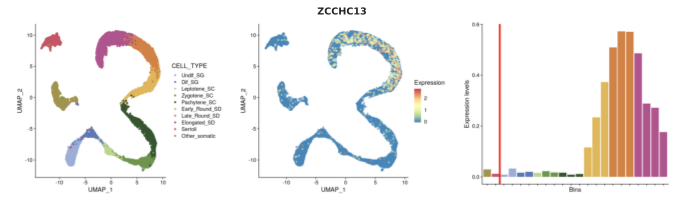

In [159]:
kaessmann_plot('ZCCHC13')

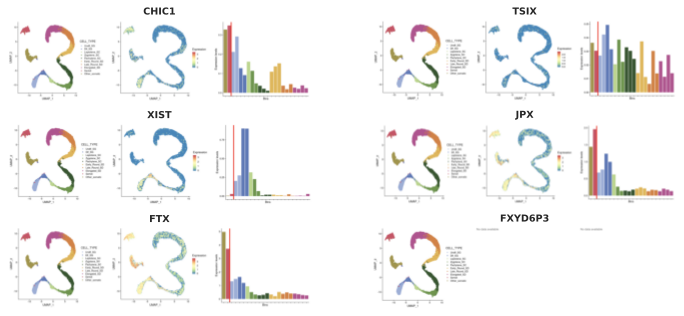

In [160]:
kaessmann_plots(['CHIC1', 'TSIX', 'XIST', 'JPX', 'FTX', 'FXYD6P3'])

In [162]:
gi.gene_info(['CHIC1', 'TSIX'])

**Symbol:** **_CHIC1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BRX  
*cysteine rich hydrophobic domain 1*  
**Summary:** This gene encodes a cysteine-rich hydrophobic (CHIC) domain-containing protein, and is one of the few protein-coding genes found near the X-inactivation center. Studies in mouse indicate that the mouse ortholog of this gene is subject to X-inactivation in mouse. Experiments with other CHIC domain-containing family members show that the cysteine residues are palmitoylated post-translationally, resulting in membrane association. Alternative splicing results in multiple transcript variants encoding different isoforms. [provided by RefSeq, May 2017].  
**Genomic position:** X:73563197-73687111 (hg38), X:72783036-72906937 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CHIC1)  


 ----

**Symbol:** **_TSIX_** (ncRNA) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** LINC00013, NCRNA00013, XIST-AS, XIST-AS1, XISTAS  
*TSIX transcript, XIST antisense RNA*  
**Summary:** In mammals, dosage compensation of genes on the X chromosome occurs by X inactivation, which is regulated in cis by the X-inactivation center (XIC) and expression of the XIST non-coding RNA. This gene expresses a non-coding antisense transcript across the 3' end of the XIST locus, and is coexpressed with XIST only from the inactive X chromosome. The mouse ortholog of this locus is required for imprinted X inactivation in extraembryonic tissues and silences Xist through modification of the chromatin structure in the Xist promoter region. In contrast, imprinted X inactivation does not occur in human extraembryonic tissues and transcripts from this locus do not repress XIST expression or affect random X chromosome inactivation in embryonic cells. This transcript is thought to be unspliced and extend over more than 30 kb, but its exact nature has not been determined. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:73792205-73829231 (hg38), X:73012040-73049066 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TSIX)  


 ----

### ZCCHC13

- Entrez Gene Summary: This gene appears to represent an intronless retrocopy of a related multi-exon gene located on chromosome 3 (KM: se expression below). However, the CDS of this intronless gene remains relatively intact, it is conserved in other mammalian species, it is known to be transcribed, and it is therefore thought to encode a functional protein. **The encoded protein contains six CCHC-type zinc fingers, and is thus thought to function as a transcription factor.** [provided by RefSeq, May 2010]

In [163]:
gi.go_info(gi.get_go_terms_for_genes(['ZCCHC13']))

**<span style="color:gray;">GO:0003727:</span>** **single-stranded RNA binding**  
 Binding to single-stranded RNA.    

 ----

**<span style="color:gray;">GO:0003729:</span>** **mRNA binding**  
 Binding to messenger RNA (mRNA), an intermediate molecule between DNA and protein. mRNA includes UTR and coding sequences, but does not contain introns.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0008270:</span>** **zinc ion binding**  
 Binding to a zinc ion (Zn).    

 ----

**<span style="color:gray;">GO:0045182:</span>** **translation regulator activity**  
 Any molecular function involved in the initiation, activation, perpetuation, repression or termination of polypeptide synthesis at the ribosome.    

 ----

**<span style="color:gray;">GO:2000767:</span>** **positive regulation of cytoplasmic translation**  
 Any process that activates or increases the frequency, rate or extent of cytoplasmic translation.    

 ----

## Peak 10

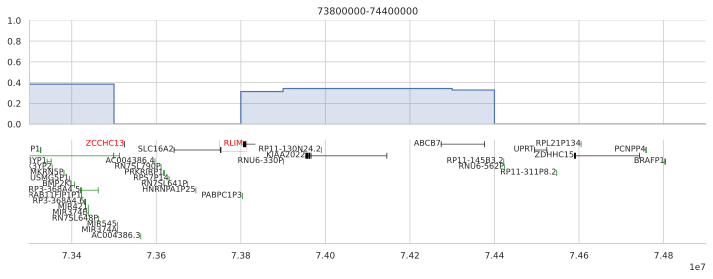

In [71]:
plot_next(9)

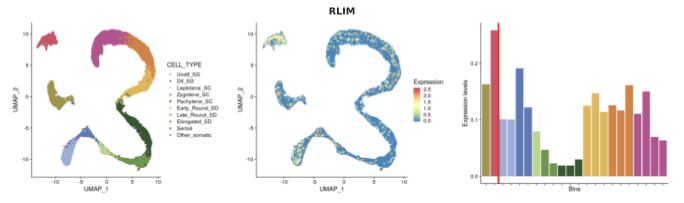

In [165]:
kaessmann_plot('RLIM')

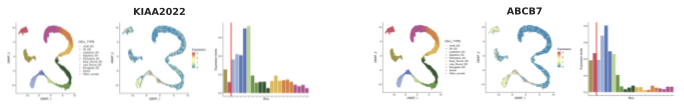

In [166]:
kaessmann_plots(['KIAA2022', 'ABCB7'])

### RLIM

- Entrez Gene Summary: The protein encoded by this gene is a RING-H2 zinc finger protein. It has been shown to be an E3 ubiquitin protein ligase that targets LIM domain binding 1 (LDB1/CLIM), and causes proteasome-dependent degradation of LDB1. This protein and LDB1 are co-repressors of LHX1/LIM-1, a homeodomain transcription factor. Multiple alternatively spliced variants, encoding the same protein, have been identified. [provided by RefSeq, Feb 2009]
- UniProtKB/Swiss-Prot Summary: E3 ubiquitin-protein ligase. Acts as a negative coregulator for LIM homeodomain transcription factors by mediating the ubiquitination and subsequent degradation of LIM cofactors LDB1 and LDB2 and by mediating the recruitment the SIN3a/histone deacetylase corepressor complex. Ubiquitination and degradation of LIM cofactors LDB1 and LDB2 allows DNA-bound LIM homeodomain transcription factors to interact with other protein partners such as RLIM. Plays a role in telomere length-mediated growth suppression by mediating the ubiquitination and degradation of TERF1. By targeting ZFP42 for degradation, **acts as an activator of random inactivation of X chromosome in the embryo**, a stochastic process in which one X chromosome is inactivated to minimize sex-related dosage differences of X-encoded genes in somatic cells of female placental mammals.
- **Differentially expressed**

In [167]:
gi.go_info(gi.get_go_terms_for_genes(['RLIM']))

**<span style="color:gray;">GO:0000122:</span>** **negative regulation of transcription by RNA polymerase II**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of transcription mediated by RNA polymerase II.    

 ----

**<span style="color:gray;">GO:0003714:</span>** **transcription corepressor activity**  
 A transcription coregulator activity that represses or decreases the transcription of specific gene sets via binding to a DNA-bound DNA-binding transcription factor, either on its own or as part of a complex. Corepressors often act by altering chromatin structure and modifications. For example, one class of transcription corepressors modifies chromatin structure through covalent modification of histones. A second class remodels the conformation of chromatin in an ATP-dependent fashion. A third class modulates interactions of DNA-bound DNA-binding transcription factors with other transcription coregulators.    

 ----

**<span style="color:gray;">GO:0004842:</span>** **ubiquitin-protein transferase activity**  
 Catalysis of the transfer of ubiquitin from one protein to another via the reaction X-Ub + Y --> Y-Ub + X, where both X-Ub and Y-Ub are covalent linkages.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0005654:</span>** **nucleoplasm**  
 That part of the nuclear content other than the chromosomes or the nucleolus.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005829:</span>** **cytosol**  
 The part of the cytoplasm that does not contain organelles but which does contain other particulate matter, such as protein complexes.    

 ----

**<span style="color:gray;">GO:0006511:</span>** **ubiquitin-dependent protein catabolic process**  
 The chemical reactions and pathways resulting in the breakdown of a protein or peptide by hydrolysis of its peptide bonds, initiated by the covalent attachment of a ubiquitin group, or multiple ubiquitin groups, to the protein.    

 ----

**<span style="color:gray;">GO:0016567:</span>** **protein ubiquitination**  
 The process in which one or more ubiquitin groups are added to a protein.    

 ----

**<span style="color:gray;">GO:0017053:</span>** **transcription repressor complex**  
 A protein complex that possesses activity that prevents or downregulates transcription.    

 ----

**<span style="color:gray;">GO:0043433:</span>** **negative regulation of DNA-binding transcription factor activity**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of the activity of a transcription factor, any factor involved in the initiation or regulation of transcription.    

 ----

**<span style="color:gray;">GO:0045892:</span>** **negative regulation of transcription, DNA-templated**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of cellular DNA-templated transcription.    

 ----

**<span style="color:gray;">GO:0046872:</span>** **metal ion binding**  
 Binding to a metal ion.    

 ----

**<span style="color:gray;">GO:0060816:</span>** **random inactivation of X chromosome**  
 Compensating for the two-fold variation in X-chromosome:autosome ratios between sexes by a global inactivation of all, or most of, the genes on either the paternal or maternal X-chromosome in the XX sex.    

 ----

**<span style="color:gray;">GO:0061630:</span>** **ubiquitin protein ligase activity**  
 Catalysis of the transfer of ubiquitin to a substrate protein via the reaction X-ubiquitin + S -> X + S-ubiquitin, where X is either an E2 or E3 enzyme, the X-ubiquitin linkage is a thioester bond, and the S-ubiquitin linkage is an amide bond: an isopeptide bond between the C-terminal glycine of ubiquitin and the epsilon-amino group of lysine residues in the substrate or, in the linear extension of ubiquitin chains, a peptide bond the between the C-terminal glycine and N-terminal methionine of ubiquitin residues.    

 ----

**<span style="color:gray;">GO:1900095:</span>** **regulation of dosage compensation by inactivation of X chromosome**  
 Any process that modulates the frequency, rate or extent of dosage compensation, by inactivation of X chromosome.    

 ----

## Peak 11

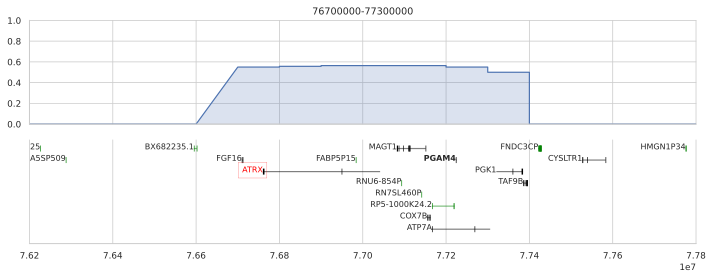

In [72]:
plot_next(10)

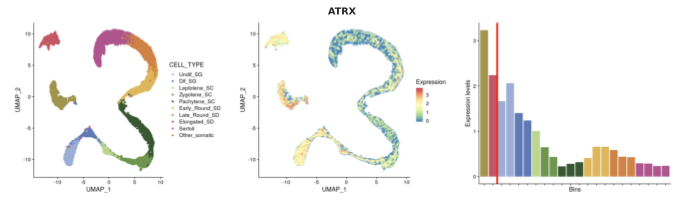

In [169]:
kaessmann_plot('ATRX')

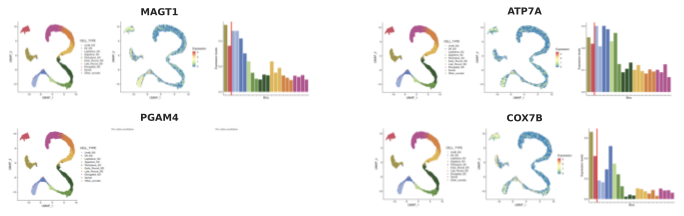

In [170]:
kaessmann_plots(['MAGT1', 'ATP7A', 'PGAM4', 'COX7B'])

In [172]:
gi.gene_info(['ATRX', 'MAGT1', 'COX7B', 'ATP7A', 'PGAM4'])

**Symbol:** **_ATRX_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** JMS, MRX52, RAD54, RAD54L, XH2, XNP, ZNF-HX  
*ATRX chromatin remodeler*  
**Summary:** The protein encoded by this gene contains an ATPase/helicase domain, and thus it belongs to the SWI/SNF family of chromatin remodeling proteins. This protein is found to undergo cell cycle-dependent phosphorylation, which regulates its nuclear matrix and chromatin association, and suggests its involvement in the gene regulation at interphase and chromosomal segregation in mitosis. Mutations in this gene are associated with X-linked syndromes exhibiting cognitive disabilities as well as alpha-thalassemia (ATRX) syndrome. These mutations have been shown to cause diverse changes in the pattern of DNA methylation, which may provide a link between chromatin remodeling, DNA methylation, and gene expression in developmental processes. Multiple alternatively spliced transcript variants encoding distinct isoforms have been reported. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:77504880-77786233 (hg38), HG1426_PATCH:76765832-77047170, X:76760356-77041702 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ATRX)  


 ----

**Symbol:** **_MAGT1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CDG1CC, IAP, MRX95, OST3B, PRO0756, SLC58A1, XMEN, bA217H1.1  
*magnesium transporter 1*  
**Summary:** This gene encodes a ubiquitously expressed magnesium cation transporter protein that localizes to the cell membrane. This protein also associates with N-oligosaccharyl transferase and therefore may have a role in N-glycosylation. Mutations in this gene cause a form of X-linked intellectual disability (XLID). This gene may have multiple in-frame translation initiation sites, one of which would encode a shorter protein with an N-terminus containing a signal peptide at amino acids 1-29. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:77825747-77899271 (hg38), HG1426_PATCH:77087318-77156547, X:77081861-77151090 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MAGT1)  


 ----

**Symbol:** **_COX7B_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** APLCC, LSDMCA2  
*cytochrome c oxidase subunit 7B*  
**Summary:** Cytochrome c oxidase (COX), the terminal component of the mitochondrial respiratory chain, catalyzes the electron transfer from reduced cytochrome c to oxygen. This component is a heteromeric complex consisting of 3 catalytic subunits encoded by mitochondrial genes and multiple structural subunits encoded by nuclear genes. The mitochondrially-encoded subunits function in electron transfer, and the nuclear-encoded subunits may function in the regulation and assembly of the complex. This nuclear gene encodes subunit VIIb, which is highly similar to bovine COX VIIb protein and is found in all tissues. This gene may have several pseudogenes on chromosomes 1, 2, 20 and 22. [provided by RefSeq, Jun 2011].  
**Genomic position:** X:77899440-77907376 (hg38), HG1426_PATCH:77160392-77168327, X:77154935-77162870 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=COX7B)  


 ----

**Symbol:** **_ATP7A_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DSMAX, MK, MNK, SMAX3  
*ATPase copper transporting alpha*  
**Summary:** This gene encodes a transmembrane protein that functions in copper transport across membranes. This protein is localized to the trans Golgi network, where it is predicted to supply copper to copper-dependent enzymes in the secretory pathway. It relocalizes to the plasma membrane under conditions of elevated extracellular copper, and functions in the efflux of copper from cells. Mutations in this gene are associated with Menkes disease, X-linked distal spinal muscular atrophy, and occipital horn syndrome. Alternatively-spliced transcript variants have been observed. [provided by RefSeq, Aug 2013].  
**Genomic position:** X:77910690-78050395 (hg38), HG1426_PATCH:77171651-77311349, X:77166194-77305892 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ATP7A)  


 ----

**Symbol:** **_PGAM4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PGAM-B, PGAM1, PGAM3, dJ1000K24.1  
*phosphoglycerate mutase family member 4*  
**Summary:** This intronless gene appears to have arisen from a retrotransposition event, yet it is thought to be an expressed, protein-coding gene. The encoded protein is a member of the phosphoglycerate mutase family, a set of enzymes that catalyze the transfer of a phosphate group from 3-phosphoglycerate to 2-phosphoglycerate. [provided by RefSeq, May 2010].  
**Genomic position:** X:77967949-77969638 (hg38), HG1426_PATCH:77228915-77230592, X:77223458-77225135 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PGAM4)  


 ----

### ARTX (AKA RAD54L)


- Entrez Gene Summary: The protein encoded by this gene contains an ATPase/helicase domain, and thus it **belongs to the SWI/SNF family of chromatin remodeling proteins**. This protein is found to undergo cell cycle-dependent phosphorylation, which regulates its nuclear matrix and chromatin association, and suggests its involvement in the gene regulation at interphase and chromosomal segregation in mitosis. Mutations in this gene are associated with X-linked syndromes exhibiting cognitive disabilities as well as alpha-thalassemia (ATRX) syndrome. These mutations have been shown to cause diverse changes in the pattern of DNA methylation, which may provide a link between chromatin remodeling, DNA methylation, and gene expression in developmental processes. Multiple alternatively spliced transcript variants encoding distinct isoforms have been reported. [provided by RefSeq, Jul 2017]
- **Missense change fixed (or almost fixed) in modern humans** (Peyrégne et al. 2021) (sites others to say: “ATRX is a chromatin remodeler required for normal chromosome alignment, cohesion and segregation during meiosis and mitosis”)
- **Differentially expressed**


> Peyrégne S., J. Kelso, B. M. Peter, and S. Pääbo, 2021 The evolutionary history of human spindle genes includes back-and-forth gene flow with Neandertals. Biorxiv 2021.11.29.470407. https://doi.org/10.1101/2021.11.29.470407

**Brain**

In [173]:
gi.go_info(gi.get_go_terms_for_genes(['ATRX']))

**<span style="color:gray;">GO:0000212:</span>** **meiotic spindle organization**  
 A process that is carried out at the cellular level which results in the assembly, arrangement of constituent parts, or disassembly of the microtubule spindle during a meiotic cell cycle.    

 ----

**<span style="color:gray;">GO:0000228:</span>** **nuclear chromosome**  
 A chromosome that encodes the nuclear genome and is found in the nucleus of a eukaryotic cell during the cell cycle phases when the nucleus is intact.    

 ----

**<span style="color:gray;">GO:0000779:</span>** **condensed chromosome, centromeric region**  
 The region of a condensed chromosome that includes the centromere and associated proteins, including the kinetochore. In monocentric chromosomes, this region corresponds to a single area of the chromosome, whereas in holocentric chromosomes, it is evenly distributed along the chromosome.    

 ----

**<span style="color:gray;">GO:0000781:</span>** **chromosome, telomeric region**  
 The end of a linear chromosome, required for the integrity and maintenance of the end. A chromosome telomere usually includes a region of telomerase-encoded repeats the length of which rarely exceeds 20 bp each and that permits the formation of a telomeric loop (T-loop). The telomeric repeat region is usually preceded by a sub-telomeric region that is gene-poor but rich in repetitive elements. Some telomeres only consist of the latter part (for eg. D. melanogaster telomeres).    

 ----

**<span style="color:gray;">GO:0000792:</span>** **heterochromatin**  
 A compact and highly condensed form of chromatin that is refractory to transcription.    

 ----

**<span style="color:gray;">GO:0003677:</span>** **DNA binding**  
 Any molecular function by which a gene product interacts selectively and non-covalently with DNA (deoxyribonucleic acid).    

 ----

**<span style="color:gray;">GO:0003678:</span>** **DNA helicase activity**  
 Unwinding of a DNA helix, driven by ATP hydrolysis.    

 ----

**<span style="color:gray;">GO:0003682:</span>** **chromatin binding**  
 Binding to chromatin, the network of fibers of DNA, protein, and sometimes RNA, that make up the chromosomes of the eukaryotic nucleus during interphase.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005524:</span>** **ATP binding**  
 Binding to ATP, adenosine 5'-triphosphate, a universally important coenzyme and enzyme regulator.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0005654:</span>** **nucleoplasm**  
 That part of the nuclear content other than the chromosomes or the nucleolus.    

 ----

**<span style="color:gray;">GO:0005721:</span>** **pericentric heterochromatin**  
 Heterochromatin that is located adjacent to the CENP-A rich centromere 'central core' and characterized by methylated H3 histone at lysine 9 (H3K9me2/H3K9me3).    

 ----

**<span style="color:gray;">GO:0006281:</span>** **DNA repair**  
 The process of restoring DNA after damage. Genomes are subject to damage by chemical and physical agents in the environment (e.g. UV and ionizing radiations, chemical mutagens, fungal and bacterial toxins, etc.) and by free radicals or alkylating agents endogenously generated in metabolism. DNA is also damaged because of errors during its replication. A variety of different DNA repair pathways have been reported that include direct reversal, base excision repair, nucleotide excision repair, photoreactivation, bypass, double-strand break repair pathway, and mismatch repair pathway.    

 ----

**<span style="color:gray;">GO:0006306:</span>** **DNA methylation**  
 The covalent transfer of a methyl group to either N-6 of adenine or C-5 or N-4 of cytosine.    

 ----

**<span style="color:gray;">GO:0006334:</span>** **nucleosome assembly**  
 The aggregation, arrangement and bonding together of a nucleosome, the beadlike structural units of eukaryotic chromatin composed of histones and DNA.    

 ----

**<span style="color:gray;">GO:0006336:</span>** **DNA replication-independent chromatin assembly**  
 The formation of nucleosomes outside the context of DNA replication.    

 ----

**<span style="color:gray;">GO:0006338:</span>** **chromatin remodeling**  
 A dynamic process of chromatin reorganization resulting in changes to chromatin structure. These changes allow DNA metabolic processes such as transcriptional regulation, DNA recombination, DNA repair, and DNA replication.    

 ----

**<span style="color:gray;">GO:0006355:</span>** **regulation of transcription, DNA-templated**  
 Any process that modulates the frequency, rate or extent of cellular DNA-templated transcription.    

 ----

**<span style="color:gray;">GO:0007283:</span>** **spermatogenesis**  
 The developmental process by which male germ line stem cells self renew or give rise to successive cell types resulting in the development of a spermatozoa.    

 ----

**<span style="color:gray;">GO:0010571:</span>** **positive regulation of nuclear cell cycle DNA replication**  
 Any process that activates or increases the frequency, rate or extent of the DNA-dependent DNA replication that occurs in the nucleus of eukaryotic organisms as part of the cell cycle.    

 ----

**<span style="color:gray;">GO:0015616:</span>** **DNA translocase activity**  
 Generation of movement along a single- or double-stranded DNA molecule, driven by ATP hydrolysis.    

 ----

**<span style="color:gray;">GO:0016604:</span>** **nuclear body**  
 Extra-nucleolar nuclear domains usually visualized by confocal microscopy and fluorescent antibodies to specific proteins.    

 ----

**<span style="color:gray;">GO:0016605:</span>** **PML body**  
 A class of nuclear body; they react against SP100 auto-antibodies (PML, promyelocytic leukemia); cells typically contain 10-30 PML bodies per nucleus; alterations in the localization of PML bodies occurs after viral infection.    

 ----

**<span style="color:gray;">GO:0016887:</span>** **ATP hydrolysis activity**  
 Catalysis of the reaction: ATP + H2O = ADP + H+ Pi. ATP hydrolysis is used in some reactions as an energy source, for example to catalyze a reaction or drive transport against a concentration gradient.    

 ----

**<span style="color:gray;">GO:0030330:</span>** **DNA damage response, signal transduction by p53 class mediator**  
 A cascade of processes induced by the cell cycle regulator phosphoprotein p53, or an equivalent protein, in response to the detection of DNA damage.    

 ----

**<span style="color:gray;">GO:0030900:</span>** **forebrain development**  
 The process whose specific outcome is the progression of the forebrain over time, from its formation to the mature structure. The forebrain is the anterior of the three primary divisions of the developing chordate brain or the corresponding part of the adult brain (in vertebrates, includes especially the cerebral hemispheres, the thalamus, and the hypothalamus and especially in higher vertebrates is the main control center for sensory and associative information processing, visceral functions, and voluntary motor functions).    

 ----

**<span style="color:gray;">GO:0031297:</span>** **replication fork processing**  
 The process in which a DNA replication fork that has stalled is restored to a functional state and replication is restarted. The stalling may be due to DNA damage, DNA secondary structure, bound proteins, dNTP shortage, or other causes.    

 ----

**<span style="color:gray;">GO:0032206:</span>** **positive regulation of telomere maintenance**  
 Any process that activates or increases the frequency, rate or extent of a process that affects and monitors the activity of telomeric proteins and the length of telomeric DNA.    

 ----

**<span style="color:gray;">GO:0032508:</span>** **DNA duplex unwinding**  
 The process in which interchain hydrogen bonds between two strands of DNA are broken or 'melted', generating a region of unpaired single strands.    

 ----

**<span style="color:gray;">GO:0035064:</span>** **methylated histone binding**  
 Binding to a histone in which a residue has been modified by methylation. Histones are any of a group of water-soluble proteins found in association with the DNA of eukaroytic chromosomes.    

 ----

**<span style="color:gray;">GO:0035128:</span>** **post-embryonic forelimb morphogenesis**  
 The process, occurring after embryonic development, by which the anatomical structures of the forelimb are generated and organized. The forelimbs are the front limbs of an organism.    

 ----

**<span style="color:gray;">GO:0035264:</span>** **multicellular organism growth**  
 The increase in size or mass of an entire multicellular organism, as opposed to cell growth.    

 ----

**<span style="color:gray;">GO:0042393:</span>** **histone binding**  
 Binding to a histone, any of a group of water-soluble proteins found in association with the DNA of eukaroytic chromosomes. They are involved in the condensation and coiling of chromosomes during cell division and have also been implicated in nonspecific suppression of gene activity.    

 ----

**<span style="color:gray;">GO:0045944:</span>** **positive regulation of transcription by RNA polymerase II**  
 Any process that activates or increases the frequency, rate or extent of transcription from an RNA polymerase II promoter.    

 ----

**<span style="color:gray;">GO:0046872:</span>** **metal ion binding**  
 Binding to a metal ion.    

 ----

**<span style="color:gray;">GO:0060009:</span>** **Sertoli cell development**  
 The process whose specific outcome is the progression of a Sertoli cell over time, from its formation to the mature structure. Cell development does not include the steps involved in committing a cell to a Sertoli cell fate.    

 ----

**<span style="color:gray;">GO:0070087:</span>** **chromo shadow domain binding**  
 Binding to a chromo shadow domain, a protein domain that is distantly related, and found in association with, the chromo domain.    

 ----

**<span style="color:gray;">GO:0070192:</span>** **chromosome organization involved in meiotic cell cycle**  
 A process of chromosome organization that is involved in a meiotic cell cycle.    

 ----

**<span style="color:gray;">GO:0070198:</span>** **protein localization to chromosome, telomeric region**  
 Any process in which a protein is transported to, or maintained at, the telomeric region of a chromosome.    

 ----

**<span style="color:gray;">GO:0072520:</span>** **seminiferous tubule development**  
 The reproductive developmental process whose specific outcome is the progression of the seminiferous tubule over time, from its formation to the mature structure. Seminiferous tubules are ducts located in the testicles, and are the specific location of meiosis, and the subsequent creation of gametes, namely spermatozoa.    

 ----

**<span style="color:gray;">GO:0072711:</span>** **cellular response to hydroxyurea**  
 Any process that results in a change in state or activity of a cell (in terms of movement, secretion, enzyme production, gene expression, etc.) as a result of a hydroxyurea stimulus.    

 ----

**<span style="color:gray;">GO:0099115:</span>** **chromosome, subtelomeric region**  
 A region of the chromosome, adjacent to the telomere (on the centromeric side) that contains repetitive DNA and sometimes genes. This region is usually heterochromatin.    

 ----

**<span style="color:gray;">GO:0140658:</span>** **ATP-dependent chromatin remodeler activity**  
 An activity, driven by ATP hydrolysis, that modulates the contacts between histones and DNA, resulting in a change in chromosome architecture within the nucleosomal array, leading to chromatin remodeling.    

 ----

**<span style="color:gray;">GO:1900112:</span>** **regulation of histone H3-K9 trimethylation**  
 Any process that modulates the frequency, rate or extent of histone H3-K9 trimethylation.    

 ----

**<span style="color:gray;">GO:1901581:</span>** **negative regulation of telomeric RNA transcription from RNA pol II promoter**  
 Any process that stops, prevents or reduces the frequency, rate or extent of telomeric RNA transcription from RNA pol II promoter.    

 ----

**<span style="color:gray;">GO:1901582:</span>** **positive regulation of telomeric RNA transcription from RNA pol II promoter**  
 Any process that activates or increases the frequency, rate or extent of telomeric RNA transcription from RNA pol II promoter.    

 ----

**<span style="color:gray;">GO:1904908:</span>** **negative regulation of maintenance of mitotic sister chromatid cohesion, telomeric**  
 Any process that stops, prevents or reduces the frequency, rate or extent of maintenance of mitotic sister chromatid cohesion, telomeric.    

 ----

## Peak 12

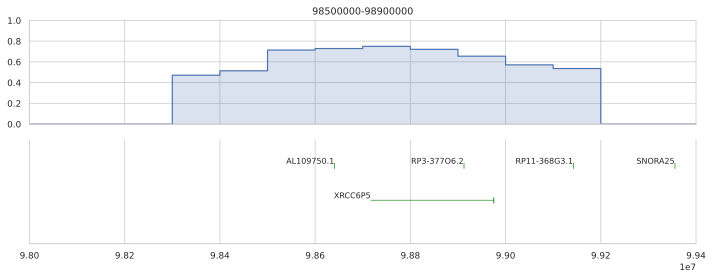

In [73]:
plot_next(11)

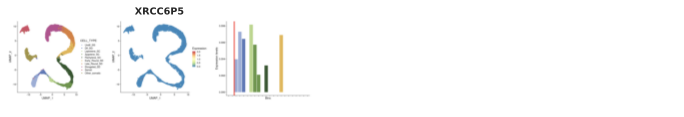

In [175]:
kaessmann_plots(['XRCC6P5'])

### ???

- ...

## Peak 13

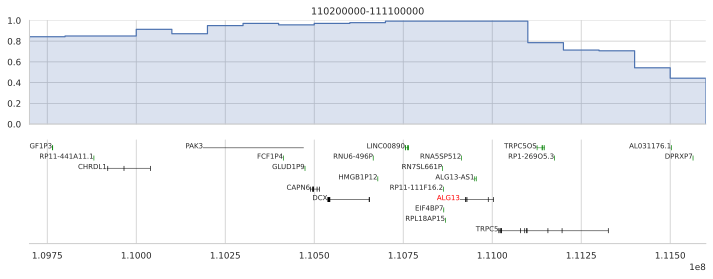

In [74]:
plot_next(12)

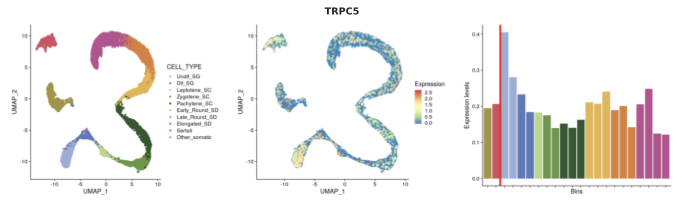

In [177]:
kaessmann_plot('TRPC5')

**ALG13:** 

- Entrez Gene Summary: The protein encoded by this gene is a subunit of a bipartite UDP-N-acetylglucosamine transferase. It heterodimerizes with asparagine-linked glycosylation 14 homolog to form a functional UDP-GlcNAc glycosyltransferase that catalyzes the second sugar addition of the highly conserved oligosaccharide precursor in endoplasmic reticulum N-linked glycosylation. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Dec 2009].
- Differentially expressed


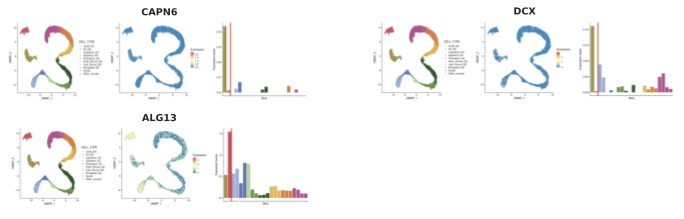

In [75]:
kaessmann_plots(['CAPN6', 'DCX', 'ALG13'])

In [179]:
gi.gene_info(['CAPN6', 'DCX', 'ALG13', 'TRPC5'])

**Symbol:** **_CAPN6_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CANPX, CAPNX, CalpM, DJ914P14.1  
*calpain 6*  
**Summary:** Calpains are ubiquitous, well-conserved family of calcium-dependent, cysteine proteases. The calpain proteins are heterodimers consisting of an invariant small subunit and variable large subunits. The large subunit possesses a cysteine protease domain, and both subunits possess calcium-binding domains. Calpains have been implicated in neurodegenerative processes, as their activation can be triggered by calcium influx and oxidative stress. The protein encoded by this gene is highly expressed in the placenta. Its C-terminal region lacks any homology to the calmodulin-like domain of other calpains. The protein lacks critical active site residues and thus is suggested to be proteolytically inactive. The protein may play a role in tumor formation by inhibiting apoptosis and promoting angiogenesis. [provided by RefSeq, Nov 2009].  
**Genomic position:** X:111245099-111270483 (hg38), X:110488331-110513751 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CAPN6)  


 ----

**Symbol:** **_DCX_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DBCN, DC, LISX, SCLH, XLIS  
*doublecortin*  
**Summary:** This gene encodes a member of the doublecortin family. The protein encoded by this gene is a cytoplasmic protein and contains two doublecortin domains, which bind microtubules. In the developing cortex, cortical neurons must migrate over long distances to reach the site of their final differentiation. The encoded protein appears to direct neuronal migration by regulating the organization and stability of microtubules. In addition, the encoded protein interacts with LIS1, the regulatory gamma subunit of platelet activating factor acetylhydrolase, and this interaction is important to proper microtubule function in the developing cortex. Mutations in this gene cause abnormal migration of neurons during development and disrupt the layering of the cortex, leading to epilepsy, cognitive disability, subcortical band heterotopia ('double cortex' syndrome) in females and lissencephaly ('smooth brain' syndrome) in males. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Sep 2010].  
**Genomic position:** X:111293779-111412429 (hg38), X:110537007-110655603 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=DCX)  


 ----

**Symbol:** **_ALG13_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CDG1S, CXorf45, DEE36, EIEE36, GLT28D1, MDS031, TDRD13, YGL047W  
*ALG13 UDP-N-acetylglucosaminyltransferase subunit*  
**Summary:** The protein encoded by this gene is a subunit of a bipartite UDP-N-acetylglucosamine transferase. It heterodimerizes with asparagine-linked glycosylation 14 homolog to form a functional UDP-GlcNAc glycosyltransferase that catalyzes the second sugar addition of the highly conserved oligosaccharide precursor in endoplasmic reticulum N-linked glycosylation. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Dec 2009].  
**Genomic position:** X:111665811-111760649 (hg38), X:110909043-111003877 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ALG13)  


 ----

**Symbol:** **_TRPC5_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PPP1R159, TRP5  
*transient receptor potential cation channel subfamily C member 5*  
**Summary:** This gene belongs to the transient receptor family. It encodes one of the seven mammalian TRPC (transient receptor potential channel) proteins. The encoded protein is a multi-pass membrane protein and is thought to form a receptor-activated non-selective calcium permeant cation channel. The protein is active alone or as a heteromultimeric assembly with TRPC1, TRPC3, and TRPC4. It also interacts with multiple proteins including calmodulin, CABP1, enkurin, Na(+)-H+ exchange regulatory factor (NHERF ), interferon-induced GTP-binding protein (MX1), ring finger protein 24 (RNF24), and SEC14 domain and spectrin repeat-containing protein 1 (SESTD1). [provided by RefSeq, May 2010].  
**Genomic position:** X:111768011-112082776 (hg38), X:111017543-111326004 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TRPC5)  


 ----

### TRPC5

- Differentially expressed
- This gene belongs to the transient receptor family. It encodes one of the seven mammalian TRPC (transient receptor potential channel) proteins. The encoded protein is a multi-pass membrane protein and is thought to form a receptor-activated non-selective calcium permeant cation channel. The protein is active alone or as a heteromultimeric assembly with TRPC1, TRPC3, and TRPC4. It also interacts with multiple proteins including calmodulin, CABP1, enkurin, Na(+)-H+ exchange regulatory factor (NHERF ), interferon-induced GTP-binding protein (MX1), ring finger protein 24 (RNF24), and SEC14 domain and spectrin repeat-containing protein 1 (SESTD1). [provided by RefSeq, May 2010].

**Brain**


In [180]:
gi.go_info(gi.get_go_terms_for_genes(['TRPC5']))

**<span style="color:gray;">GO:0003779:</span>** **actin binding**  
 Binding to monomeric or multimeric forms of actin, including actin filaments.    

 ----

**<span style="color:gray;">GO:0005262:</span>** **calcium channel activity**  
 Enables the facilitated diffusion of a calcium ion (by an energy-independent process) involving passage through a transmembrane aqueous pore or channel without evidence for a carrier-mediated mechanism.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005886:</span>** **plasma membrane**  
 The membrane surrounding a cell that separates the cell from its external environment. It consists of a phospholipid bilayer and associated proteins.    

 ----

**<span style="color:gray;">GO:0005887:</span>** **integral component of plasma membrane**  
 The component of the plasma membrane consisting of the gene products and protein complexes having at least some part of their peptide sequence embedded in the hydrophobic region of the membrane.    

 ----

**<span style="color:gray;">GO:0006816:</span>** **calcium ion transport**  
 The directed movement of calcium (Ca) ions into, out of or within a cell, or between cells, by means of some agent such as a transporter or pore.    

 ----

**<span style="color:gray;">GO:0006828:</span>** **manganese ion transport**  
 The directed movement of manganese (Mn) ions into, out of or within a cell, or between cells, by means of some agent such as a transporter or pore.    

 ----

**<span style="color:gray;">GO:0007204:</span>** **positive regulation of cytosolic calcium ion concentration**  
 Any process that increases the concentration of calcium ions in the cytosol.    

 ----

**<span style="color:gray;">GO:0007399:</span>** **nervous system development**  
 The process whose specific outcome is the progression of nervous tissue over time, from its formation to its mature state.    

 ----

**<span style="color:gray;">GO:0008284:</span>** **positive regulation of cell population proliferation**  
 Any process that activates or increases the rate or extent of cell proliferation.    

 ----

**<span style="color:gray;">GO:0010800:</span>** **positive regulation of peptidyl-threonine phosphorylation**  
 Any process that increases the frequency, rate or extent of peptidyl-threonine phosphorylation. Peptidyl-threonine phosphorylation is the phosphorylation of peptidyl-threonine to form peptidyl-O-phospho-L-threonine.    

 ----

**<span style="color:gray;">GO:0015279:</span>** **store-operated calcium channel activity**  
 A ligand-gated ion channel activity which transports calcium in response to emptying of intracellular calcium stores.    

 ----

**<span style="color:gray;">GO:0030182:</span>** **neuron differentiation**  
 The process in which a relatively unspecialized cell acquires specialized features of a neuron.    

 ----

**<span style="color:gray;">GO:0030276:</span>** **clathrin binding**  
 Binding to a clathrin heavy or light chain, the main components of the coat of coated vesicles and coated pits, and which also occurs in synaptic vesicles.    

 ----

**<span style="color:gray;">GO:0030425:</span>** **dendrite**  
 A neuron projection that has a short, tapering, morphology. Dendrites receive and integrate signals from other neurons or from sensory stimuli, and conduct nerve impulses towards the axon or the cell body. In most neurons, the impulse is conveyed from dendrites to axon via the cell body, but in some types of unipolar neuron, the impulse does not travel via the cell body.    

 ----

**<span style="color:gray;">GO:0030426:</span>** **growth cone**  
 The migrating motile tip of a growing neuron projection, where actin accumulates, and the actin cytoskeleton is the most dynamic.    

 ----

**<span style="color:gray;">GO:0034703:</span>** **cation channel complex**  
 An ion channel complex through which cations pass.    

 ----

**<span style="color:gray;">GO:0034704:</span>** **calcium channel complex**  
 An ion channel complex through which calcium ions pass.    

 ----

**<span style="color:gray;">GO:0042805:</span>** **actinin binding**  
 Binding to actinin, any member of a family of proteins that crosslink F-actin.    

 ----

**<span style="color:gray;">GO:0043025:</span>** **neuronal cell body**  
 The portion of a neuron that includes the nucleus, but excludes cell projections such as axons and dendrites.    

 ----

**<span style="color:gray;">GO:0045121:</span>** **membrane raft**  
 Any of the small (10-200 nm), heterogeneous, highly dynamic, sterol- and sphingolipid-enriched membrane domains that compartmentalize cellular processes. Small rafts can sometimes be stabilized to form larger platforms through protein-protein and protein-lipid interactions.    

 ----

**<span style="color:gray;">GO:0045666:</span>** **positive regulation of neuron differentiation**  
 Any process that activates or increases the frequency, rate or extent of neuron differentiation.    

 ----

**<span style="color:gray;">GO:0045773:</span>** **positive regulation of axon extension**  
 Any process that activates or increases the frequency, rate or extent of axon extension.    

 ----

**<span style="color:gray;">GO:0050774:</span>** **negative regulation of dendrite morphogenesis**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of dendrite morphogenesis.    

 ----

**<span style="color:gray;">GO:0051117:</span>** **ATPase binding**  
 Binding to an ATPase, any enzyme that catalyzes the hydrolysis of ATP.    

 ----

**<span style="color:gray;">GO:0051402:</span>** **neuron apoptotic process**  
 Any apoptotic process in a neuron, the basic cellular unit of nervous tissue. Each neuron consists of a body, an axon, and dendrites. Their purpose is to receive, conduct, and transmit impulses in the nervous system.    

 ----

**<span style="color:gray;">GO:0051480:</span>** **regulation of cytosolic calcium ion concentration**  
 Any process involved in the maintenance of an internal steady state of calcium ions within the cytosol of a cell or between the cytosol and its surroundings.    

 ----

**<span style="color:gray;">GO:0070588:</span>** **calcium ion transmembrane transport**  
 A process in which a calcium ion is transported from one side of a membrane to the other by means of some agent such as a transporter or pore.    

 ----

**<span style="color:gray;">GO:0070679:</span>** **inositol 1,4,5 trisphosphate binding**  
 Binding to inositol 1,4,5 trisphosphate.    

 ----

**<span style="color:gray;">GO:0070782:</span>** **phosphatidylserine exposure on apoptotic cell surface**  
 A phospholipid scrambling process that results in the appearance of phosphatidylserine on the outer leaflet of the plasma membrane of an apoptotic cell, which acts as an 'eat-me' signal for engulfing cells. Phosphatidylserine is exposed on the apoptotic cell surface by a phospholipid scramblase activity.    

 ----

**<span style="color:gray;">GO:1902630:</span>** **regulation of membrane hyperpolarization**  
 Any process that modulates the frequency, rate or extent of membrane hyperpolarization.    

 ----

## Peak 14

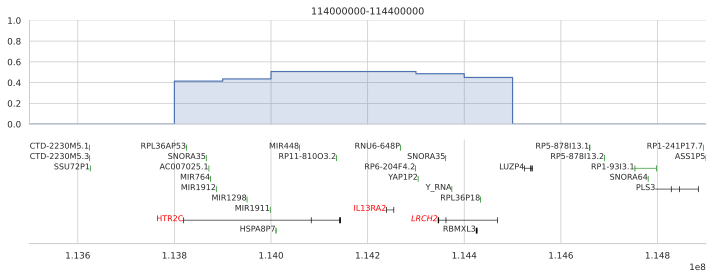

In [76]:
plot_next(13)

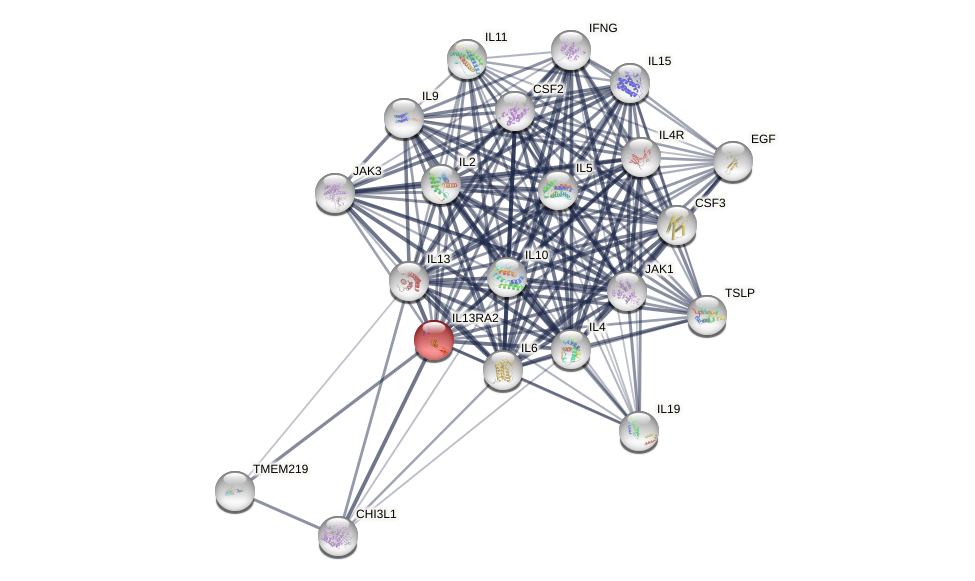

In [182]:
gi.show_string_network(['IL13RA2'], nodes=20)

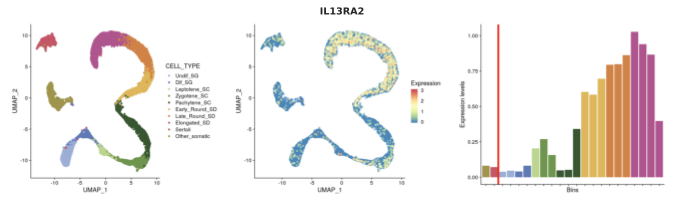

In [183]:
kaessmann_plot('IL13RA2')

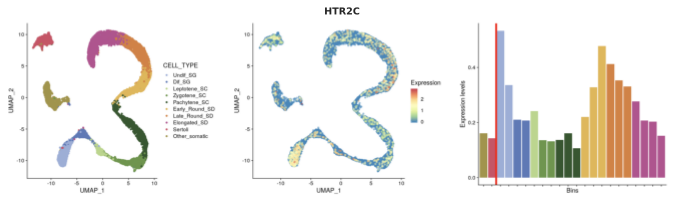

In [184]:
kaessmann_plot('HTR2C')

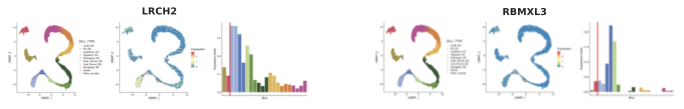

In [73]:
kaessmann_plots(['LRCH2', 'RBMXL3'])

In [91]:
gi.gene_info(['HTR2C', 'IL13RA2', 'LRCH2', 'RBMXL3'])

**Symbol:** **_HTR2C_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** 5-HT1C, 5-HT2C, 5-HTR2C, 5HTR2C, HTR1C  
*5-hydroxytryptamine receptor 2C*  
**Summary:** This gene encodes a seven-transmembrane G-protein-coupled receptor. The encoded protein responds to signaling through the neurotransmitter serotonin. The mRNA of this gene is subject to multiple RNA editing events, where adenosine residues encoded by the genome are converted to inosines. RNA editing is predicted to alter the structure of the second intracellular loop, thereby generating alternate protein forms with decreased ability to interact with G proteins. Abnormalities in RNA editing of this gene have been detected in victims of suicide that suffer from depression. In addition, naturally-occuring variation in the promoter and 5' non-coding and coding regions of this gene may show statistically-significant association with mental illness and behavioral disorders. Alternative splicing results in multiple different transcript variants. [provided by RefSeq, Jan 2015].  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HTR2C)  


 ----

**Symbol:** **_IL13RA2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CD213A2, CT19, IL-13R, IL13BP  
*interleukin 13 receptor subunit alpha 2*  
**Summary:** The protein encoded by this gene is closely related to Il13RA1, a subuint of the interleukin 13 receptor complex. This protein binds IL13 with high affinity, but lacks cytoplasmic domain, and does not appear to function as a signal mediator. It is reported to play a role in the internalization of IL13. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:115003975-115019977 (hg38), HG1462_PATCH:114240445-114256447, X:114238538-114254540 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=IL13RA2)  


 ----

**Symbol:** **_LRCH2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** dA204F4.4  
*leucine rich repeats and calponin homology domain containing 2*  
**Summary:** This gene encodes a member of the leucine-rich repeat and calponin homology domain-containing protein family. These family members contain multiple N-terminal leucine-rich repeats, in addition to a C-terminal calponin homology domain, a type of domain that mediates interactions with actin filaments. These proteins are conserved across animal species, and studies of a similar Drosophila protein indicate a function as a cytoskeletal scaffolding protein. Alternative splicing of this gene results in multiple transcript variants. [provided by RefSeq, Sep 2011].  
**Genomic position:** X:115110616-115234096 (hg38), HG1462_PATCH:114347092-114470542, X:114345185-114468635 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=LRCH2)  


 ----

**Symbol:** **_RBMXL3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf55  
*RBMX like 3*  
**Genomic position:** X:115189410-115192868 (hg38), HG1462_PATCH:114425870-114429338, X:114423963-114427431 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RBMXL3)  


 ----

### IL13RA2

- Differentially expressed
- The protein encoded by this gene is closely related to Il13RA1, a subuint of the interleukin 13 receptor complex. This protein binds IL13 with high affinity, but lacks cytoplasmic domain, and does not appear to function as a signal mediator. It is reported to play a role in the internalization of IL13. [provided by RefSeq, Jul 2008].
- ...part of the Jak–Stat signaling pathway...
- wikipedia: **Since the JAK-STAT pathway plays a major role in many fundamental processes, such as apoptosis and inflammation...**
- [IL-13 also binds to a third IL-13Rα2 receptor](https://www.frontiersin.org/articles/10.3389/fphar.2019.01387/full)

<img src="https://www.frontiersin.org/files/Articles/486447/fphar-10-01387-HTML/image_m/fphar-10-01387-g001.jpg" alt="" width="300">

No expressed prior to MSCI. Strongly expressed in early, late and elongated spermatids
Prevents apoptosis by acting as a “decoy” receptor: This receptor has a high affinity for IL-13 (Interleukin-13), binds the cytokine, and competitively inhibits the intracellular signaling cascade initiated by IL-13. In cells lacking the IL-13Rα2 decoy receptor, IL-13 initiates the production of 15-lipoxygenase-1 (15-LOX-1), which has been implicated in cellular apoptosis: [link](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3132296/)



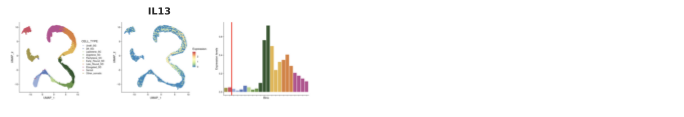

In [92]:
kaessmann_plots(['IL13'])

In [93]:
gi.go_info(gi.get_go_terms_for_genes(['IL13RA2']))

**<span style="color:gray;">GO:0002638:</span>** **negative regulation of immunoglobulin production**  
 Any process that stops, prevents, or reduces the frequency, rate, or extent of immunoglobulin production.    

 ----

**<span style="color:gray;">GO:0004896:</span>** **cytokine receptor activity**  
 Combining with a cytokine and transmitting the signal from one side of the membrane to the other to initiate a change in cell activity.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005576:</span>** **extracellular region**  
 The space external to the outermost structure of a cell. For cells without external protective or external encapsulating structures this refers to space outside of the plasma membrane. This term covers the host cell environment outside an intracellular parasite.    

 ----

**<span style="color:gray;">GO:0005615:</span>** **extracellular space**  
 That part of a multicellular organism outside the cells proper, usually taken to be outside the plasma membranes, and occupied by fluid.    

 ----

**<span style="color:gray;">GO:0009897:</span>** **external side of plasma membrane**  
 The leaflet of the plasma membrane that faces away from the cytoplasm and any proteins embedded or anchored in it or attached to its surface.    

 ----

**<span style="color:gray;">GO:0016021:</span>** **integral component of membrane**  
 The component of a membrane consisting of the gene products and protein complexes having at least some part of their peptide sequence embedded in the hydrophobic region of the membrane.    

 ----

**<span style="color:gray;">GO:0016064:</span>** **immunoglobulin mediated immune response**  
 An immune response mediated by immunoglobulins, whether cell-bound or in solution.    

 ----

**<span style="color:gray;">GO:0019221:</span>** **cytokine-mediated signaling pathway**  
 The series of molecular signals initiated by the binding of a cytokine to a receptor on the surface of a cell, and ending with the regulation of a downstream cellular process, e.g. transcription.    

 ----

**<span style="color:gray;">GO:0019955:</span>** **cytokine binding**  
 Binding to a cytokine, any of a group of proteins that function to control the survival, growth and differentiation of tissues and cells, and which have autocrine and paracrine activity.    

 ----

**<span style="color:gray;">GO:0043235:</span>** **receptor complex**  
 Any protein complex that undergoes combination with a hormone, neurotransmitter, drug or intracellular messenger to initiate a change in cell function.    

 ----

**<span style="color:gray;">GO:0043305:</span>** **negative regulation of mast cell degranulation**  
 Any process that stops, prevents, or reduces the rate of mast cell degranulation.    

 ----

### HTR2C

- **Differentially expressed**
- This gene encodes a seven-transmembrane G-protein-coupled receptor. The encoded protein responds to signaling through the neurotransmitter serotonin. The mRNA of this gene is subject to multiple RNA editing events, where adenosine residues encoded by the genome are converted to inosines. RNA editing is predicted to alter the structure of the second intracellular loop, thereby generating alternate protein forms with decreased ability to interact with G proteins. Abnormalities in RNA editing of this gene have been detected in victims of suicide that suffer from depression. In addition, naturally-occuring variation in the promoter and 5' non-coding and coding regions of this gene may show statistically-significant association with mental illness and behavioral disorders. Alternative splicing results in multiple different transcript variants. [provided by RefSeq, Jan 2015].
- tramemembrane protein

**Brain**



In [94]:
gi.go_info(gi.get_go_terms_for_genes(['HTR2C']))

**<span style="color:gray;">GO:0001587:</span>** **Gq/11-coupled serotonin receptor activity**  
 Combining with serotonin and transmitting the signal across the membrane by activation of the Gq/11 subunit of an associated cytoplasmic heterotrimeric G protein complex. The Gq/11 subunit subsequently activates phospholipase C and results in an increase in inositol triphosphate (IP3) levels.    

 ----

**<span style="color:gray;">GO:0001662:</span>** **behavioral fear response**  
 An acute behavioral change resulting from a perceived external threat.    

 ----

**<span style="color:gray;">GO:0004993:</span>** **G protein-coupled serotonin receptor activity**  
 Combining with the biogenic amine serotonin and transmitting the signal across the membrane by activating an associated G-protein. Serotonin (5-hydroxytryptamine) is a neurotransmitter and hormone found in vertebrates and invertebrates.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005886:</span>** **plasma membrane**  
 The membrane surrounding a cell that separates the cell from its external environment. It consists of a phospholipid bilayer and associated proteins.    

 ----

**<span style="color:gray;">GO:0005887:</span>** **integral component of plasma membrane**  
 The component of the plasma membrane consisting of the gene products and protein complexes having at least some part of their peptide sequence embedded in the hydrophobic region of the membrane.    

 ----

**<span style="color:gray;">GO:0006874:</span>** **cellular calcium ion homeostasis**  
 Any process involved in the maintenance of an internal steady state of calcium ions at the level of a cell.    

 ----

**<span style="color:gray;">GO:0007187:</span>** **G protein-coupled receptor signaling pathway, coupled to cyclic nucleotide second messenger**  
 A G protein-coupled receptor signaling pathway in which the signal is transmitted via the activation or inhibition of a nucleotide cyclase activity and a subsequent change in the concentration of a cyclic nucleotide.    

 ----

**<span style="color:gray;">GO:0007200:</span>** **phospholipase C-activating G protein-coupled receptor signaling pathway**  
 A G protein-coupled receptor signaling pathway in which the signal is transmitted via the  activation of phospholipase C (PLC) and a subsequent increase in the intracellular concentration of inositol trisphosphate (IP3) and diacylglycerol (DAG).    

 ----

**<span style="color:gray;">GO:0007208:</span>** **phospholipase C-activating serotonin receptor signaling pathway**  
 A phospholipase C-activating receptor G protein-coupled receptor signaling pathway initiated by serotonin binding to its receptor on the surface of a target cell, and ending with the regulation of a downstream cellular process, e.g. transcription.    

 ----

**<span style="color:gray;">GO:0007268:</span>** **chemical synaptic transmission**  
 The vesicular release of classical neurotransmitter molecules from a presynapse, across a chemical synapse, the subsequent activation of neurotransmitter receptors at the postsynapse of a target cell (neuron, muscle, or secretory cell) and the effects of this activation on the postsynaptic membrane potential and ionic composition of the postsynaptic cytosol. This process encompasses both spontaneous and evoked release of neurotransmitter and all parts of synaptic vesicle exocytosis. Evoked transmission starts with the arrival of an action potential at the presynapse.    

 ----

**<span style="color:gray;">GO:0007626:</span>** **locomotory behavior**  
 The specific movement from place to place of an organism in response to external or internal stimuli. Locomotion of a whole organism in a manner dependent upon some combination of that organism's internal state and external conditions.    

 ----

**<span style="color:gray;">GO:0007631:</span>** **feeding behavior**  
 Behavior associated with the intake of food.    

 ----

**<span style="color:gray;">GO:0010513:</span>** **positive regulation of phosphatidylinositol biosynthetic process**  
 Any process that increases the frequency, rate or extent of the chemical reactions and pathways resulting in the formation of phosphatidylinositol.    

 ----

**<span style="color:gray;">GO:0019934:</span>** **cGMP-mediated signaling**  
 Any intracellular signal transduction in which the signal is passed on within the cell via cyclic GMP (cGMP). Includes production of cGMP, and downstream effectors that further transmit the signal within the cell.    

 ----

**<span style="color:gray;">GO:0030425:</span>** **dendrite**  
 A neuron projection that has a short, tapering, morphology. Dendrites receive and integrate signals from other neurons or from sensory stimuli, and conduct nerve impulses towards the axon or the cell body. In most neurons, the impulse is conveyed from dendrites to axon via the cell body, but in some types of unipolar neuron, the impulse does not travel via the cell body.    

 ----

**<span style="color:gray;">GO:0030594:</span>** **neurotransmitter receptor activity**  
 Combining with a neurotransmitter and transmitting the signal to initiate a change in cell activity.    

 ----

**<span style="color:gray;">GO:0031644:</span>** **regulation of nervous system process**  
 Any process that modulates the frequency, rate or extent of a neurophysiological process, an organ system process carried out by any of the organs or tissues of the nervous system.    

 ----

**<span style="color:gray;">GO:0032098:</span>** **regulation of appetite**  
 Any process which modulates appetite, the desire or physical craving for food.    

 ----

**<span style="color:gray;">GO:0042802:</span>** **identical protein binding**  
 Binding to an identical protein or proteins.    

 ----

**<span style="color:gray;">GO:0043397:</span>** **regulation of corticotropin-releasing hormone secretion**  
 Any process that modulates the frequency, rate or extent of corticotropin-releasing hormone secretion.    

 ----

**<span style="color:gray;">GO:0045202:</span>** **synapse**  
 The junction between an axon of one neuron and a dendrite of another neuron, a muscle fiber or a glial cell. As the axon approaches the synapse it enlarges into a specialized structure, the presynaptic terminal bouton, which contains mitochondria and synaptic vesicles. At the tip of the terminal bouton is the presynaptic membrane; facing it, and separated from it by a minute cleft (the synaptic cleft) is a specialized area of membrane on the receiving cell, known as the postsynaptic membrane. In response to the arrival of nerve impulses, the presynaptic terminal bouton secretes molecules of neurotransmitters into the synaptic cleft. These diffuse across the cleft and transmit the signal to the postsynaptic membrane.    

 ----

**<span style="color:gray;">GO:0045600:</span>** **positive regulation of fat cell differentiation**  
 Any process that activates or increases the frequency, rate or extent of adipocyte differentiation.    

 ----

**<span style="color:gray;">GO:0051209:</span>** **release of sequestered calcium ion into cytosol**  
 The process in which calcium ions sequestered in the endoplasmic reticulum, Golgi apparatus or mitochondria are released into the cytosolic compartment.    

 ----

**<span style="color:gray;">GO:0051378:</span>** **serotonin binding**  
 Binding to serotonin (5-hydroxytryptamine), a monoamine neurotransmitter occurring in the peripheral and central nervous systems, also having hormonal properties.    

 ----

**<span style="color:gray;">GO:0051482:</span>** **positive regulation of cytosolic calcium ion concentration involved in phospholipase C-activating G protein-coupled signaling pathway**  
 Any process that increases the concentration of calcium ions in the cytosol that occurs as part of a PLC-activating G protein-coupled receptor signaling pathway. G-protein-activated PLC hydrolyses phosphatidylinositol-bisphosphate (PIP2) to release diacylglycerol (DAG) and inositol trisphosphate (IP3). IP3 then binds to calcium release channels in the endoplasmic reticulum (ER) to trigger calcium ion release into the cytosol.    

 ----

**<span style="color:gray;">GO:0070374:</span>** **positive regulation of ERK1 and ERK2 cascade**  
 Any process that activates or increases the frequency, rate or extent of signal transduction mediated by the ERK1 and ERK2 cascade.    

 ----

**<span style="color:gray;">GO:0071886:</span>** **1-(4-iodo-2,5-dimethoxyphenyl)propan-2-amine binding**  
 Binding to the amine 1-(4-iodo-2,5-dimethoxyphenyl)propan-2-amine, a serotonin receptor agonist that can act as a psychedelic drug.    

 ----

**<span style="color:gray;">GO:0098664:</span>** **G protein-coupled serotonin receptor signaling pathway**  
 The series of molecular signals generated as a consequence of a G protein-coupled serotonin receptor binding to one of its physiological ligands.    

 ----

**<span style="color:gray;">GO:0098666:</span>** **G protein-coupled serotonin receptor complex**  
 A protein complex that is capable of G protein-coupled serotonin receptor activity.    

 ----

### LRCH2

- Differentially expressed
- This gene encodes a member of the leucine-rich repeat and calponin homology domain-containing protein family. These family members contain multiple N-terminal leucine-rich repeats, in addition to a C-terminal calponin homology domain, a type of domain that mediates interactions with actin filaments. These proteins are conserved across animal species, and studies of a similar Drosophila protein indicate a function as a cytoskeletal scaffolding protein. Alternative splicing of this gene results in multiple transcript variants. [provided by RefSeq, Sep 2011].

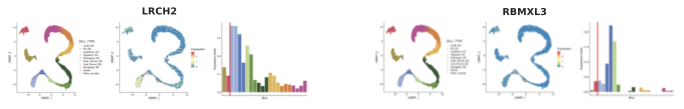

In [95]:
kaessmann_plots(['LRCH2', 'RBMXL3'])

In [97]:
gi.gene_info(['HTR2C', 'IL13RA2', 'LRCH2', 'RBMXL3'])

**Symbol:** **_HTR2C_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** 5-HT1C, 5-HT2C, 5-HTR2C, 5HTR2C, HTR1C  
*5-hydroxytryptamine receptor 2C*  
**Summary:** This gene encodes a seven-transmembrane G-protein-coupled receptor. The encoded protein responds to signaling through the neurotransmitter serotonin. The mRNA of this gene is subject to multiple RNA editing events, where adenosine residues encoded by the genome are converted to inosines. RNA editing is predicted to alter the structure of the second intracellular loop, thereby generating alternate protein forms with decreased ability to interact with G proteins. Abnormalities in RNA editing of this gene have been detected in victims of suicide that suffer from depression. In addition, naturally-occuring variation in the promoter and 5' non-coding and coding regions of this gene may show statistically-significant association with mental illness and behavioral disorders. Alternative splicing results in multiple different transcript variants. [provided by RefSeq, Jan 2015].  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HTR2C)  


 ----

**Symbol:** **_IL13RA2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CD213A2, CT19, IL-13R, IL13BP  
*interleukin 13 receptor subunit alpha 2*  
**Summary:** The protein encoded by this gene is closely related to Il13RA1, a subuint of the interleukin 13 receptor complex. This protein binds IL13 with high affinity, but lacks cytoplasmic domain, and does not appear to function as a signal mediator. It is reported to play a role in the internalization of IL13. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:115003975-115019977 (hg38), HG1462_PATCH:114240445-114256447, X:114238538-114254540 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=IL13RA2)  


 ----

**Symbol:** **_LRCH2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** dA204F4.4  
*leucine rich repeats and calponin homology domain containing 2*  
**Summary:** This gene encodes a member of the leucine-rich repeat and calponin homology domain-containing protein family. These family members contain multiple N-terminal leucine-rich repeats, in addition to a C-terminal calponin homology domain, a type of domain that mediates interactions with actin filaments. These proteins are conserved across animal species, and studies of a similar Drosophila protein indicate a function as a cytoskeletal scaffolding protein. Alternative splicing of this gene results in multiple transcript variants. [provided by RefSeq, Sep 2011].  
**Genomic position:** X:115110616-115234096 (hg38), HG1462_PATCH:114347092-114470542, X:114345185-114468635 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=LRCH2)  


 ----

**Symbol:** **_RBMXL3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf55  
*RBMX like 3*  
**Genomic position:** X:115189410-115192868 (hg38), HG1462_PATCH:114425870-114429338, X:114423963-114427431 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RBMXL3)  


 ----

## Peak 15

In [ ]:
plot_next(14)

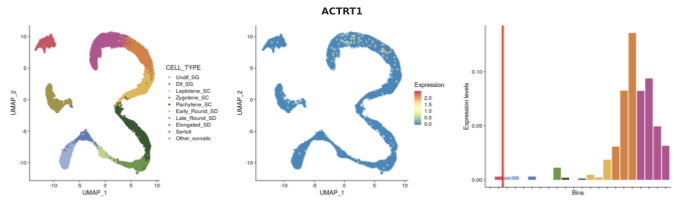

In [99]:
kaessmann_plot('ACTRT1')

In [101]:
gi.gene_info('ACTRT1')

**Symbol:** **_ACTRT1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** AIP1, ARIP1, ARPT1, HSD27  
*actin related protein T1*  
**Summary:** This gene encodes a protein related to the cytoskeletal protein beta-actin. This protein is a major component of the calyx in the perinuclear theca of mammalian sperm heads, and it therefore likely functions in spermatid formation. This gene is intronless and is similar to a related gene located on chromosome 1. A related pseudogene has also been identified approximately 75 kb downstream of this gene on chromosome X. [provided by RefSeq, May 2010].  
**Genomic position:** X:128050962-128052403 (hg38), X:127184943-127186382 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ACTRT1)  


 ----

### ACTRT1

- Entrez Gene Summary: This gene encodes a protein **related to the cytoskeletal protein beta-actin**. This protein is **a major component of the calyx in the perinuclear theca of mammalian sperm heads, and it therefore likely functions in spermatid formation**. This gene is intronless and is similar to a related gene located on chromosome 1. A related pseudogene has also been identified approximately 75 kb downstream of this gene on chromosome X. [provided by RefSeq, May 2010]
- The perinuclear theca is a cytoskeletal structure between the acrosome and the nucleus. The perinuclear theca plays a role in both the attachment and elongation of the nucleus and acrosome and later also a functional role in oocyte activation (Toshimori and Ito 2003). 
- **Differentially expressed**

> Toshimori K., and C. Ito, 2003 Formation and organization of the mammalian sperm head. Arch Histol Cytol 66: 383–396. https://doi.org/10.1679/aohc.66.383

In [102]:
gi.go_info(gi.get_go_terms_for_genes(['ACTRT1']))

**<span style="color:gray;">GO:0003682:</span>** **chromatin binding**  
 Binding to chromatin, the network of fibers of DNA, protein, and sometimes RNA, that make up the chromosomes of the eukaryotic nucleus during interphase.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005856:</span>** **cytoskeleton**  
 Any of the various filamentous elements that form the internal framework of cells, and typically remain after treatment of the cells with mild detergent to remove membrane constituents and soluble components of the cytoplasm. The term embraces intermediate filaments, microfilaments, microtubules, the microtrabecular lattice, and other structures characterized by a polymeric filamentous nature and long-range order within the cell. The various elements of the cytoskeleton not only serve in the maintenance of cellular shape but also have roles in other cellular functions, including cellular movement, cell division, endocytosis, and movement of organelles.    

 ----

**<span style="color:gray;">GO:0006355:</span>** **regulation of transcription, DNA-templated**  
 Any process that modulates the frequency, rate or extent of cellular DNA-templated transcription.    

 ----

**<span style="color:gray;">GO:0008589:</span>** **regulation of smoothened signaling pathway**  
 Any process that modulates the frequency, rate or extent of smoothened signaling.    

 ----

**<span style="color:gray;">GO:0045892:</span>** **negative regulation of transcription, DNA-templated**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of cellular DNA-templated transcription.    

 ----

## Peak 16

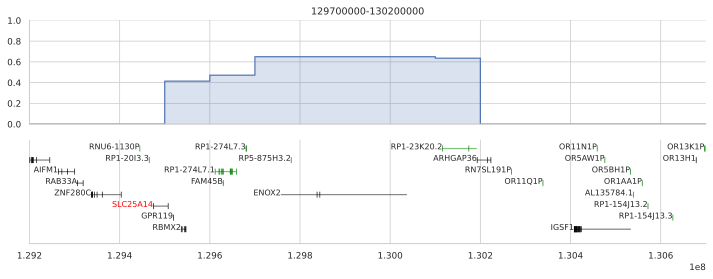

In [103]:
plot_next(15)

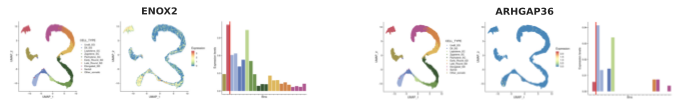

In [104]:
kaessmann_plots(['ENOX2', 'ARHGAP36'])

In [105]:
gi.gene_info(['ENOX2', 'ARHGAP36'])

**Symbol:** **_ENOX2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** APK1, COVA1, tNOX  
*ecto-NOX disulfide-thiol exchanger 2*  
**Summary:** This gene is a tumor-specific member of the ECTO-NOX family of genes that encode cell surface NADH oxidases. The encoded protein has two enzymatic activities: catalysis of hydroquinone or NADH oxidation, and protein disulfide interchange. The protein also displays prion-like properties. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Aug 2013].  
**Genomic position:** X:130622325-130903234 (hg38), X:129757350-130037208 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ENOX2)  


 ----

**Symbol:** **_ARHGAP36_** (protein-coding)  
*Rho GTPase activating protein 36*  
**Genomic position:** X:131058346-131089885 (hg38), X:130192216-130223857 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ARHGAP36)  


 ----

### ???

- ...

## Peak 17

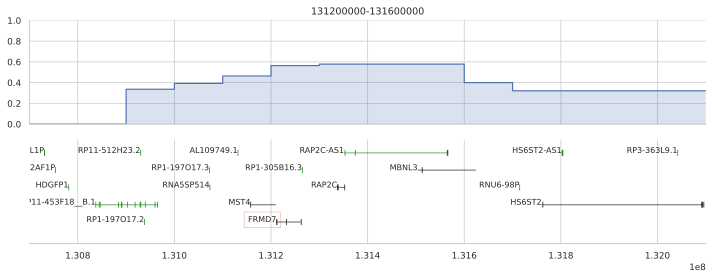

In [106]:
plot_next(16)

In [107]:
gi.gene_info('MBNL3')

**Symbol:** **_MBNL3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CHCR, MBLX, MBLX39, MBXL  
*muscleblind like splicing regulator 3*  
**Summary:** This gene encodes a member of the muscleblind-like family of proteins. The encoded protein may function in regulation of alternative splicing and may play a role in the pathophysiology of myotonic dystrophy. Alternatively spliced transcript variants have been described. [provided by RefSeq, Dec 2009].  
**Genomic position:** X:132369317-132489968 (hg38), X:131503345-131623996 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MBNL3)  


 ----

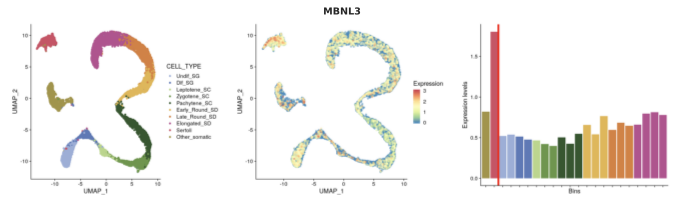

In [108]:
kaessmann_plot('MBNL3')

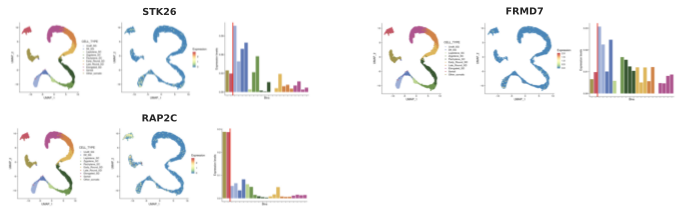

In [109]:
kaessmann_plots(['STK26', 'FRMD7', 'RAP2C'])

In [110]:
gi.gene_info(['STK26', 'FRMD7', 'RAP2C', 'MBNL3'])

**Symbol:** **_STK26_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** MASK, MST4  
*serine/threonine kinase 26*  
**Summary:** The product of this gene is a member of the GCK group III family of kinases, which are a subset of the Ste20-like kinases. The encoded protein contains an amino-terminal kinase domain, and a carboxy-terminal regulatory domain that mediates homodimerization. The protein kinase localizes to the Golgi apparatus and is specifically activated by binding to the Golgi matrix protein GM130. It is also cleaved by caspase-3 in vitro, and may function in the apoptotic pathway. Several alternatively spliced transcript variants of this gene have been described, but the full-length nature of some of these variants has not been determined. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:132023302-132075943 (hg38), X:131157293-131209971 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=STK26)  


 ----

**Symbol:** **_FRMD7_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** NYS, NYS1, XIPAN  
*FERM domain containing 7*  
**Summary:** Mutations in this gene are associated with X-linked congenital nystagmus. [provided by RefSeq, Dec 2008].  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=FRMD7)  


 ----

**Symbol:** **_RAP2C_** (protein-coding)  
*RAP2C, member of RAS oncogene family*  
**Summary:** The protein encoded by this gene is a member of the Ras-related protein subfamily of the Ras GTPase superfamily. Members of this family are small GTPases that act as molecular switches to regulate cellular proliferation, differentiation, and apoptosis. This protein has been reported to activate in vitro transcriptional activity of the serum response element. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Sep 2012].  
**Genomic position:** X:132203024-132219480 (hg38), X:131337053-131353471 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RAP2C)  


 ----

**Symbol:** **_MBNL3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CHCR, MBLX, MBLX39, MBXL  
*muscleblind like splicing regulator 3*  
**Summary:** This gene encodes a member of the muscleblind-like family of proteins. The encoded protein may function in regulation of alternative splicing and may play a role in the pathophysiology of myotonic dystrophy. Alternatively spliced transcript variants have been described. [provided by RefSeq, Dec 2009].  
**Genomic position:** X:132369317-132489968 (hg38), X:131503345-131623996 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MBNL3)  


 ----

### MBNL3

- ...

In [111]:
gi.go_info(gi.get_go_terms_for_genes(['MBNL3']))

**<span style="color:gray;">GO:0000381:</span>** **regulation of alternative mRNA splicing, via spliceosome**  
 Any process that modulates the frequency, rate or extent of alternative splicing of nuclear mRNAs.    

 ----

**<span style="color:gray;">GO:0003723:</span>** **RNA binding**  
 Binding to an RNA molecule or a portion thereof.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005654:</span>** **nucleoplasm**  
 That part of the nuclear content other than the chromosomes or the nucleolus.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0006397:</span>** **mRNA processing**  
 Any process involved in the conversion of a primary mRNA transcript into one or more mature mRNA(s) prior to translation into polypeptide.    

 ----

**<span style="color:gray;">GO:0008380:</span>** **RNA splicing**  
 The process of removing sections of the primary RNA transcript to remove sequences not present in the mature form of the RNA and joining the remaining sections to form the mature form of the RNA.    

 ----

**<span style="color:gray;">GO:0043484:</span>** **regulation of RNA splicing**  
 Any process that modulates the frequency, rate or extent of RNA splicing, the process of removing sections of the primary RNA transcript to remove sequences not present in the mature form of the RNA and joining the remaining sections to form the mature form of the RNA.    

 ----

**<span style="color:gray;">GO:0045662:</span>** **negative regulation of myoblast differentiation**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of myoblast differentiation. A myoblast is a mononucleate cell type that, by fusion with other myoblasts, gives rise to the myotubes that eventually develop into skeletal muscle fibers.    

 ----

**<span style="color:gray;">GO:0046872:</span>** **metal ion binding**  
 Binding to a metal ion.    

 ----

## Peak 18

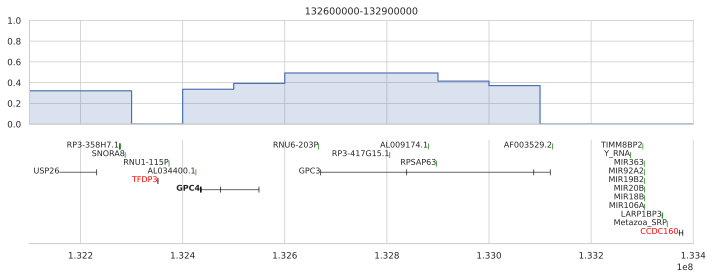

In [112]:
plot_next(17)

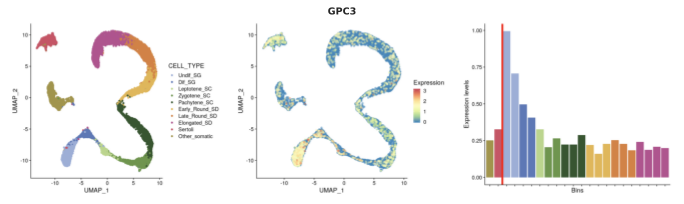

In [113]:
kaessmann_plot('GPC3')

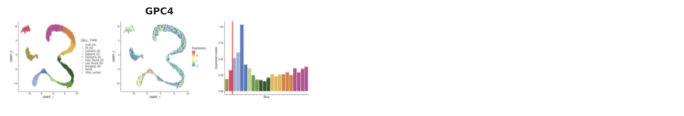

In [114]:
kaessmann_plots(['GPC4'])

In [115]:
gi.gene_info(['GPC3', 'GPC4'])

**Symbol:** **_GPC3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DGSX, GTR2-2, MXR7, OCI-5, SDYS, SGB, SGBS, SGBS1  
*glypican 3*  
**Summary:** Cell surface heparan sulfate proteoglycans are composed of a membrane-associated protein core substituted with a variable number of heparan sulfate chains. Members of the glypican-related integral membrane proteoglycan family (GRIPS) contain a core protein anchored to the cytoplasmic membrane via a glycosyl phosphatidylinositol linkage. These proteins may play a role in the control of cell division and growth regulation. The protein encoded by this gene can bind to and inhibit the dipeptidyl peptidase activity of CD26, and it can induce apoptosis in certain cell types. Deletion mutations in this gene are associated with Simpson-Golabi-Behmel syndrome, also known as Simpson dysmorphia syndrome. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Sep 2009].  
**Genomic position:** X:133535745-133987100 (hg38), X:132669773-133119922 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=GPC3)  


 ----

**Symbol:** **_GPC4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** K-glypican, KPTS  
*glypican 4*  
**Summary:** Cell surface heparan sulfate proteoglycans are composed of a membrane-associated protein core substituted with a variable number of heparan sulfate chains. Members of the glypican-related integral membrane proteoglycan family (GRIPS) contain a core protein anchored to the cytoplasmic membrane via a glycosyl phosphatidylinositol linkage.  These proteins may play a role in the control of cell division and growth regulation.  The GPC4 gene is adjacent to the 3' end of GPC3 and may also play a role in Simpson-Golabi-Behmel syndrome. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:133300103-133415489 (hg38), X:132434131-132549518 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=GPC4)  


 ----

### GPC3

- Cell surface heparan sulfate proteoglycans are composed of a membrane-associated protein core substituted with a variable number of heparan sulfate chains. Members of the glypican-related integral membrane proteoglycan family (GRIPS) contain a core protein anchored to the cytoplasmic membrane via a glycosyl phosphatidylinositol linkage. These proteins may play a role in the control of cell division and growth regulation. The protein encoded by this gene can bind to and inhibit the dipeptidyl peptidase activity of CD26, and it can induce apoptosis in certain cell types. Deletion mutations in this gene are associated with Simpson-Golabi-Behmel syndrome, also known as Simpson dysmorphia syndrome. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Sep 2009].

In [116]:
gi.go_info(gi.get_go_terms_for_genes(['GPC3']))

**<span style="color:gray;">GO:0001658:</span>** **branching involved in ureteric bud morphogenesis**  
 The process in which the branching structure of the ureteric bud is generated and organized. The ureteric bud is an epithelial tube that grows out from the metanephric duct. The bud elongates and branches to give rise to the ureter and kidney collecting tubules.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005788:</span>** **endoplasmic reticulum lumen**  
 The volume enclosed by the membranes of the endoplasmic reticulum.    

 ----

**<span style="color:gray;">GO:0005796:</span>** **Golgi lumen**  
 The volume enclosed by the membranes of any cisterna or subcompartment of the Golgi apparatus, including the cis- and trans-Golgi networks.    

 ----

**<span style="color:gray;">GO:0005886:</span>** **plasma membrane**  
 The membrane surrounding a cell that separates the cell from its external environment. It consists of a phospholipid bilayer and associated proteins.    

 ----

**<span style="color:gray;">GO:0009617:</span>** **response to bacterium**  
 Any process that results in a change in state or activity of a cell or an organism (in terms of movement, secretion, enzyme production, gene expression, etc.) as a result of a stimulus from a bacterium.    

 ----

**<span style="color:gray;">GO:0009653:</span>** **anatomical structure morphogenesis**  
 The process in which anatomical structures are generated and organized. Morphogenesis pertains to the creation of form.    

 ----

**<span style="color:gray;">GO:0009948:</span>** **anterior/posterior axis specification**  
 The establishment, maintenance and elaboration of the anterior/posterior axis. The anterior-posterior axis is defined by a line that runs from the head or mouth of an organism to the tail or opposite end of the organism.    

 ----

**<span style="color:gray;">GO:0009986:</span>** **cell surface**  
 The external part of the cell wall and/or plasma membrane.    

 ----

**<span style="color:gray;">GO:0010171:</span>** **body morphogenesis**  
 The process in which the anatomical structures of the soma are generated and organized.    

 ----

**<span style="color:gray;">GO:0010466:</span>** **negative regulation of peptidase activity**  
 Any process that stops or reduces the rate of peptidase activity, the hydrolysis of peptide bonds within proteins.    

 ----

**<span style="color:gray;">GO:0016477:</span>** **cell migration**  
 The controlled self-propelled movement of a cell from one site to a destination guided by molecular cues. Cell migration is a central process in the development and maintenance of multicellular organisms.    

 ----

**<span style="color:gray;">GO:0030282:</span>** **bone mineralization**  
 The deposition of hydroxyapatite, a form of calcium phosphate with the formula Ca10(PO4)6(OH)2, in bone tissue.    

 ----

**<span style="color:gray;">GO:0030316:</span>** **osteoclast differentiation**  
 The process in which a relatively unspecialized monocyte acquires the specialized features of an osteoclast. An osteoclast is a specialized phagocytic cell associated with the absorption and removal of the mineralized matrix of bone tissue.    

 ----

**<span style="color:gray;">GO:0030324:</span>** **lung development**  
 The process whose specific outcome is the progression of the lung over time, from its formation to the mature structure. In all air-breathing vertebrates the lungs are developed from the ventral wall of the oesophagus as a pouch which divides into two sacs. In amphibians and many reptiles the lungs retain very nearly this primitive sac-like character, but in the higher forms the connection with the esophagus becomes elongated into the windpipe and the inner walls of the sacs become more and more divided, until, in the mammals, the air spaces become minutely divided into tubes ending in small air cells, in the walls of which the blood circulates in a fine network of capillaries. In mammals the lungs are more or less divided into lobes, and each lung occupies a separate cavity in the thorax.    

 ----

**<span style="color:gray;">GO:0030513:</span>** **positive regulation of BMP signaling pathway**  
 Any process that activates or increases the frequency, rate or extent of BMP signaling pathway activity.    

 ----

**<span style="color:gray;">GO:0031226:</span>** **intrinsic component of plasma membrane**  
 The component of the plasma membrane consisting of the gene products and protein complexes having either part of their peptide sequence embedded in the hydrophobic region of the membrane or some other covalently attached group such as a GPI anchor that is similarly embedded in the membrane.    

 ----

**<span style="color:gray;">GO:0035116:</span>** **embryonic hindlimb morphogenesis**  
 The process, occurring in the embryo, by which the anatomical structures of the hindlimbs are generated and organized. The hindlimbs are the posterior limbs of an animal.    

 ----

**<span style="color:gray;">GO:0042074:</span>** **cell migration involved in gastrulation**  
 The migration of individual cells within the blastocyst to help establish the multi-layered body plan of the organism (gastrulation). For example, the migration of cells from the surface to the interior of the embryo (ingression).    

 ----

**<span style="color:gray;">GO:0043202:</span>** **lysosomal lumen**  
 The volume enclosed within the lysosomal membrane.    

 ----

**<span style="color:gray;">GO:0045732:</span>** **positive regulation of protein catabolic process**  
 Any process that activates or increases the frequency, rate or extent of the chemical reactions and pathways resulting in the breakdown of a protein by the destruction of the native, active configuration, with or without the hydrolysis of peptide bonds.    

 ----

**<span style="color:gray;">GO:0045807:</span>** **positive regulation of endocytosis**  
 Any process that activates or increases the frequency, rate or extent of endocytosis.    

 ----

**<span style="color:gray;">GO:0045879:</span>** **negative regulation of smoothened signaling pathway**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of smoothened signaling.    

 ----

**<span style="color:gray;">GO:0045880:</span>** **positive regulation of smoothened signaling pathway**  
 Any process that activates or increases the frequency, rate or extent of smoothened signaling.    

 ----

**<span style="color:gray;">GO:0045926:</span>** **negative regulation of growth**  
 Any process that stops, prevents or reduces the rate or extent of growth, the increase in size or mass of all or part of an organism.    

 ----

**<span style="color:gray;">GO:0046326:</span>** **positive regulation of glucose import**  
 Any process that activates or increases the frequency, rate or extent of the import of the hexose monosaccharide glucose into a cell or organelle.    

 ----

**<span style="color:gray;">GO:0046658:</span>** **anchored component of plasma membrane**  
 The component of the plasma membrane consisting of the gene products that are tethered to the membrane only by a covalently attached anchor, such as a lipid group, that is embedded in the membrane. Gene products with peptide sequences that are embedded in the membrane are excluded from this grouping.    

 ----

**<span style="color:gray;">GO:0050680:</span>** **negative regulation of epithelial cell proliferation**  
 Any process that stops, prevents or reduces the rate or extent of epithelial cell proliferation.    

 ----

**<span style="color:gray;">GO:0060422:</span>** **peptidyl-dipeptidase inhibitor activity**  
 Binds to and stops, prevents or reduces the activity of a peptidyl-dipeptidase. Peptidyl-dipeptidase activity catalyzes the release of C-terminal dipeptides from a polypeptide chain.    

 ----

**<span style="color:gray;">GO:0060828:</span>** **regulation of canonical Wnt signaling pathway**  
 Any process that modulates the rate, frequency, or extent of the Wnt signaling pathway through beta-catenin, the series of molecular signals initiated by binding of a Wnt protein to a frizzled family receptor on the surface of the target cell, followed by propagation of the signal via beta-catenin, and ending with a change in transcription of target genes.    

 ----

**<span style="color:gray;">GO:0060976:</span>** **coronary vasculature development**  
 The process whose specific outcome is the progression of the blood vessels of the heart over time, from its formation to the mature structure.    

 ----

**<span style="color:gray;">GO:0062023:</span>** **collagen-containing extracellular matrix**  
 An extracellular matrix consisting mainly of proteins (especially collagen) and glycosaminoglycans (mostly as proteoglycans) that provides not only essential physical scaffolding for the cellular constituents but can also initiate crucial biochemical and biomechanical cues required for tissue morphogenesis, differentiation and homeostasis. The components are secreted by cells in the vicinity and form a sheet underlying or overlying cells such as endothelial and epithelial cells.    

 ----

**<span style="color:gray;">GO:0072111:</span>** **cell proliferation involved in kidney development**  
 The multiplication or reproduction of cells, resulting in the expansion of the population in the kidney.    

 ----

**<span style="color:gray;">GO:0072138:</span>** **mesenchymal cell proliferation involved in ureteric bud development**  
 The multiplication or reproduction of cells, resulting in the expansion of a mesenchymal cell population of the ureteric bud, that contributes to ureteric bud development.    

 ----

**<span style="color:gray;">GO:0072180:</span>** **mesonephric duct morphogenesis**  
 The process in which the anatomical structures of the mesonephric duct are generated and organized. A mesonephric duct is a tube drains the mesonephros.    

 ----

**<span style="color:gray;">GO:0072203:</span>** **cell proliferation involved in metanephros development**  
 The multiplication or reproduction of cells, resulting in the expansion of the population in the metanephros.    

 ----

**<span style="color:gray;">GO:0090090:</span>** **negative regulation of canonical Wnt signaling pathway**  
 Any process that decreases the rate, frequency, or extent of the Wnt signaling pathway through beta-catenin, the series of molecular signals initiated by binding of a Wnt protein to a frizzled family receptor on the surface of the target cell, followed by propagation of the signal via beta-catenin, and ending with a change in transcription of target genes.    

 ----

**<span style="color:gray;">GO:0090263:</span>** **positive regulation of canonical Wnt signaling pathway**  
 Any process that increases the rate, frequency, or extent of the Wnt signaling pathway through beta-catenin, the series of molecular signals initiated by binding of a Wnt protein to a frizzled family receptor on the surface of the target cell, followed by propagation of the signal via beta-catenin, and ending with a change in transcription of target genes.    

 ----

**<span style="color:gray;">GO:1905475:</span>** **regulation of protein localization to membrane**  
 Any process that modulates the frequency, rate or extent of protein localization to membrane.    

 ----

**<span style="color:gray;">GO:2000050:</span>** **regulation of non-canonical Wnt signaling pathway**  
 Any process that modulates the frequency, rate or extent of non-canonical Wnt signaling pathway.    

 ----

**<span style="color:gray;">GO:2000096:</span>** **positive regulation of Wnt signaling pathway, planar cell polarity pathway**  
 Any process that activates or increases the frequency, rate or extent of Wnt signaling pathway, planar cell polarity pathway.    

 ----

## Peak 19

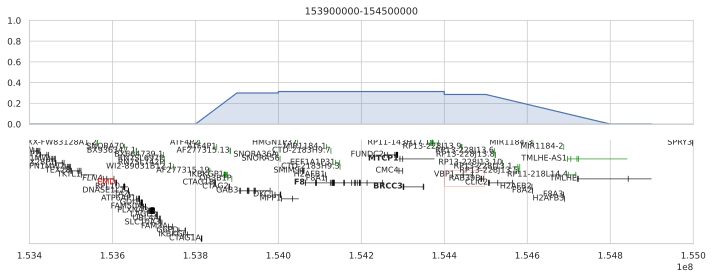

In [117]:
plot_next(18)

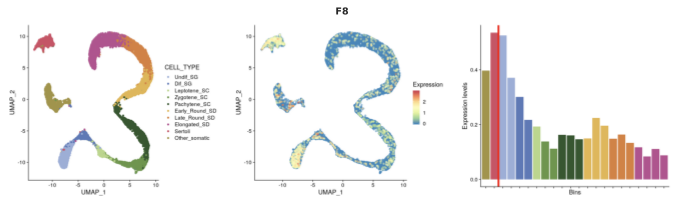

In [118]:
kaessmann_plot('F8')

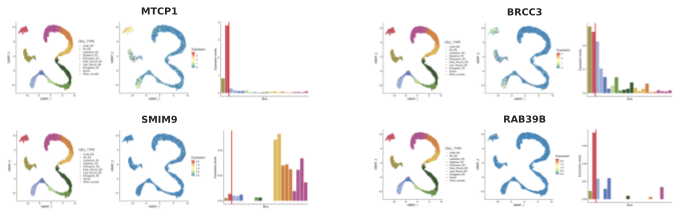

In [119]:
kaessmann_plots(['MTCP1', 'BRCC3', 'SMIM9', 'RAB39B'])

In [124]:
gi.gene_info(['SMIM9', 'F8', 'RAB39B', 'BRCC3'])

**Symbol:** **_SMIM9_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf68  
*small integral membrane protein 9*  
**Genomic position:** X:154823348-154834662 (hg38), HG1497_PATCH:153991816-154003130, X:154051623-154062937 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SMIM9)  


 ----

**Symbol:** **_F8_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** AHF, DXS1253E, F8B, F8C, FVIII, HEMA, THPH13  
*coagulation factor VIII*  
**Summary:** This gene encodes coagulation factor VIII, which participates in the intrinsic pathway of blood coagulation; factor VIII is a cofactor for factor IXa which, in the presence of Ca+2 and phospholipids, converts factor X to the activated form Xa. This gene produces two alternatively spliced transcripts. Transcript variant 1 encodes a large glycoprotein, isoform a, which circulates in plasma and associates with von Willebrand factor in a noncovalent complex. This protein undergoes multiple cleavage events. Transcript variant 2 encodes a putative small protein, isoform b, which consists primarily of the phospholipid binding domain of factor VIIIc. This binding domain is essential for coagulant activity. Defects in this gene results in hemophilia A, a common recessive X-linked coagulation disorder. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:154835788-155026940 (hg38), HG1497_PATCH:154004256-154195408, X:154064063-154255215 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=F8)  


 ----

**Symbol:** **_RAB39B_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BGMR, MRX72, WSMN, WSN, XLID72  
*RAB39B, member RAS oncogene family*  
**Summary:** This gene encodes a member of the Rab family of proteins. Rab proteins are small GTPases that are involved in vesicular trafficking. Mutations in this gene are associated with X-linked cognitive disability. [provided by RefSeq, Aug 2013].  
**Genomic position:** X:155258235-155264491 (hg38), HG1497_PATCH:154426709-154433057, X:154487526-154493874 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RAB39B)  


 ----

**Symbol:** **_BRCC3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BRCC36, C6.1A, CXorf53  
*BRCA1/BRCA2-containing complex subunit 3*  
**Summary:** This gene encodes a subunit of the BRCA1-BRCA2-containing complex (BRCC), which is an E3 ubiquitin ligase. This complex plays a role in the DNA damage response, where it is responsible for the stable accumulation of BRCA1 at DNA break sites. The component encoded by this gene can specifically cleave Lys 63-linked polyubiquitin chains, and it regulates the abundance of these polyubiquitin chains in chromatin. The loss of this gene results in abnormal angiogenesis and is associated with syndromic moyamoya, a cerebrovascular angiopathy. Alternative splicing results in multiple transcript variants. A related pseudogene has been identified on chromosome 5. [provided by RefSeq, Jun 2011].  
**Genomic position:** X:155071420-155123077 (hg38), HG1497_PATCH:154239888-154291542, X:154299695-154351349 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=BRCC3)  


 ----

### F8

- ...



In [125]:
gi.go_info(gi.get_go_terms_for_genes(['F8']))

**<span style="color:gray;">GO:0005507:</span>** **copper ion binding**  
 Binding to a copper (Cu) ion.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005576:</span>** **extracellular region**  
 The space external to the outermost structure of a cell. For cells without external protective or external encapsulating structures this refers to space outside of the plasma membrane. This term covers the host cell environment outside an intracellular parasite.    

 ----

**<span style="color:gray;">GO:0005615:</span>** **extracellular space**  
 That part of a multicellular organism outside the cells proper, usually taken to be outside the plasma membranes, and occupied by fluid.    

 ----

**<span style="color:gray;">GO:0005788:</span>** **endoplasmic reticulum lumen**  
 The volume enclosed by the membranes of the endoplasmic reticulum.    

 ----

**<span style="color:gray;">GO:0005796:</span>** **Golgi lumen**  
 The volume enclosed by the membranes of any cisterna or subcompartment of the Golgi apparatus, including the cis- and trans-Golgi networks.    

 ----

**<span style="color:gray;">GO:0005886:</span>** **plasma membrane**  
 The membrane surrounding a cell that separates the cell from its external environment. It consists of a phospholipid bilayer and associated proteins.    

 ----

**<span style="color:gray;">GO:0006953:</span>** **acute-phase response**  
 An acute inflammatory response that involves non-antibody proteins whose concentrations in the plasma increase in response to infection or injury of homeothermic animals.    

 ----

**<span style="color:gray;">GO:0007596:</span>** **blood coagulation**  
 The sequential process in which the multiple coagulation factors of the blood interact, ultimately resulting in the formation of an insoluble fibrin clot; it may be divided into three stages: stage 1, the formation of intrinsic and extrinsic prothrombin converting principle; stage 2, the formation of thrombin; stage 3, the formation of stable fibrin polymers.    

 ----

**<span style="color:gray;">GO:0007597:</span>** **blood coagulation, intrinsic pathway**  
 A protein activation cascade that contributes to blood coagulation and consists of the interactions among high molecular weight kininogen, prekallikrein, and factor XII that lead to the activation of clotting factor X.    

 ----

**<span style="color:gray;">GO:0016491:</span>** **oxidoreductase activity**  
 Catalysis of an oxidation-reduction (redox) reaction, a reversible chemical reaction in which the oxidation state of an atom or atoms within a molecule is altered. One substrate acts as a hydrogen or electron donor and becomes oxidized, while the other acts as hydrogen or electron acceptor and becomes reduced.    

 ----

**<span style="color:gray;">GO:0030134:</span>** **COPII-coated ER to Golgi transport vesicle**  
 A vesicle with a coat formed of the COPII coat complex proteins. The COPII coat complex is formed by the Sec23p/Sec24p and the Sec13p/Sec31p heterodimers. COPII-associated vesicles transport proteins from the rough endoplasmic reticulum to the Golgi apparatus (anterograde transport).    

 ----

**<span style="color:gray;">GO:0031093:</span>** **platelet alpha granule lumen**  
 The volume enclosed by the membrane of the platelet alpha granule.    

 ----

**<span style="color:gray;">GO:0033116:</span>** **endoplasmic reticulum-Golgi intermediate compartment membrane**  
 The lipid bilayer surrounding any of the compartments of the endoplasmic reticulum (ER)-Golgi intermediate compartment system.    

 ----

In [126]:
gi.show_string_network(['CXorf23', 'CNKSR2', 'CFAP47', 'DYNLT3', 'AKAP4', 'PHF8', 'ZC3H12B',  'LAS1L', 'RLIM', 'ATRX',
                        'TRPC5', 'IL13RA2', 'HTR2C' 'ACTRT1', 'MBNL3', 'GPC3', 'LANCL3'], nodes=100)

Gene candidates
We list the most likely protein-coding gene candidate in each ECH.
All with expression after MSCI. 
Descriptions of expression patterns refers to spermatogenesis

BCLAF3 (CXorf23)
Expression dips at the Zygotene/Pachytene boundary at the onset of MSCI, but then strongly peaks in early round spermatids.
Enhances apoptosis in mouse gastric epithelial cells
Coexpressed with CFAP47

CNKSR2
Only modest expression after MSCI with a slight peak in early spermatids
The only protein coding gene
Inhibits apoptosis in certain cancer cells. It may also play a role in ternary complex assembly of synaptic proteins at the postsynaptic membrane and coupling of signal transduction to membrane/cytoskeletal remodeling.
May function as an adapter protein or regulator of Ras signaling pathways (mouse)

CFAP47 (CXorf22)
Expression dips at the Zygotene/Pachytene boundary at the onset of MSCI, but then very strongly peaks in early round spermatids.
Coexpressed with BCLAF3
Linked to male infertility
Associated with sperm flagella function: asthenoteratozoospermia and primary male infertility

DYNLT3 
Expression dips at the Zygotene/Pachytene boundary at the onset of MSCI. Strong expression resumes in early, late, and elongated spermatids

AKAP4
Expression dips at the Zygotene/Pachytene boundary at the onset of MSCI. Strong expression resumes in early spermatids and continuously increases through late and elongated spermatids. 

PHF8
Expression dips at the Zygotene/Pachytene boundary at the onset of MSCI. Expression resumes in  early, late and elongated spermatids.
WNK3: increases cell survival in a caspase-3-dependent pathway




ZC3H12B
Strong expression throughout spermatogenesis. Not subject to MSCI. 

LAS1L 
Expression dips at the Zygotene/Pachytene boundary at the onset of MSCI. Expression resumes in early spermatids peaking in late spermatids.

ZCCHC13
Only expressed in spermatids, peaking in late spermatids

RLIM
Expression dips at the Zygotene/Pachytene boundary at the onset of MSCI. Expression resumes in early, late, and elongated spermatids
ATRX
Expression decreases at the Zygotene/Pachytene boundary at the onset of MSCI, but remains throughout spermatogenesis, with a slight peak in early spermatids.

TRPC5
Not subject to MSCI. Expression throughout spermatogenesis.

IL13RA2
No expressed prior to MSCI. Strongly expressed in early, late and elongated spermatids
Prevents apoptosis by acting as a “decoy” receptor: This receptor has a high affinity for IL-13 (Interleukin-13), binds the cytokine, and competitively inhibits the intracellular signaling cascade initiated by IL-13. In cells lacking the IL-13Rα2 decoy receptor, IL-13 initiates the production of 15-lipoxygenase-1 (15-LOX-1), which has been implicated in cellular apoptosis. 

HTR2C
No subject to MSCI. Peak expression at the transition between early and late spermatids.

ACTRT1:   
Only expressed in late and elongated spermatids

MBNL3: 
Not subject to MSCI. Expression throughout spermatogenesis.

GPC3: 
Expression falls before MSCI and remains throughout spermatogenesis.


In [129]:
df = gi.get_genes_for_go_terms(['GO:0043066'])
df

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(comment def relationship synonym xref)


,symbol,name,chrom,start,end
0,NR1H4,nuclear receptor subfamily 1 group H member 4,12,100473865,100564413
1,PAX2,paired box 2,10,100735395,100829943
2,YWHAZ,tyrosine 3-monooxygenase/tryptophan 5-monooxyg...,8,100953381,100916522
3,VHL,von Hippel-Lindau tumor suppressor,3,10141777,10153666
4,MAP4K4,mitogen-activated protein kinase kinase kinase...,2,101697706,101894689
...,...,...,...,...,...
483,ASNS,asparagine synthetase (glutamine-hydrolyzing),7,97928440,97851676
484,SOX8,SRY-box transcription factor 8,16,981769,986978
485,IGF1R,insulin like growth factor 1 receptor,15,98648538,98964529
486,BCL11B,BAF chromatin remodeling complex subunit BCL11B,14,99272196,99169286


In [131]:
df.loc[df.chrom == 'X']

,symbol,name,chrom,start,end
20,PSMD10,"proteasome 26S subunit, non-ATPase 10",X,108091541,108084206
51,XIAP,X-linked inhibitor of apoptosis,X,123859707,123913971
96,CD40LG,CD40 ligand,X,136648157,136660389
113,FMR1-AS1,FMR1 antisense RNA 1,X,147911816,147909430
121,FATE1,fetal and adult testis expressed 1,X,151716034,151723193
122,MAGEA4,MAGE family member A4,X,151912473,151925169
125,FLNA,filamin A,X,154374633,154348530
126,RPL10,ribosomal protein L10,X,154398064,154402338
176,RPS6KA3,ribosomal protein S6 kinase A3,X,20267096,20149910
296,DDX3X,DEAD-box helicase 3 X-linked,X,41333307,41364471


In [132]:
df.loc[df.chrom == '3']

,symbol,name,chrom,start,end
3,VHL,von Hippel-Lindau tumor suppressor,3,10141777,10153666
10,GHRL,ghrelin and obestatin prepropeptide,3,10292946,10285665
31,DRD3,dopamine receptor D3,3,114199406,114127579
43,GSK3B,glycogen synthase kinase 3 beta,3,120094446,119821320
45,FSTL1,follistatin like 1,3,120450991,120392292
56,RAF1,"Raf-1 proto-oncogene, serine/threonine kinase",3,12664116,12583600
98,WNT7A,Wnt family member 7A,3,13880070,13816257
118,SIAH2,siah E3 ubiquitin protein ligase 2,3,150763168,150741124
139,PDCD10,programmed cell death 10,3,167734891,167683297
143,PRKCI,protein kinase C iota,3,170222423,170305976


In [133]:
df = gi.get_genes_for_go_terms(['GO:0043065'])
df

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(comment def relationship synonym xref)


,symbol,name,chrom,start,end
0,KLF11,Kruppel like factor 11,2,10043549,10054835
1,ALDH1A3,aldehyde dehydrogenase 1 family member A3,15,100879830,100916625
2,GRIN2A,glutamate ionotropic receptor NMDA type subuni...,16,10182907,9753403
3,ADM,adrenomedullin,11,10305072,10307396
4,CALHM2,calcium homeostasis modulator family member 2,10,103452369,103446785
...,...,...,...,...,...
297,TCTN3,tectonic family member 3,10,95693926,95663400
298,PLEKHN1,pleckstrin homology domain containing N1,1,966481,975864
299,MIR137,microRNA 137,1,98046170,98046069
300,APAF1,apoptotic peptidase activating factor 1,12,98645289,98735432


In [134]:
df.groupby('chrom').agg('size')

chrom
1     30
10    17
11    16
12    18
13     9
14     8
15     4
16    10
17    13
18     2
19    13
2     25
20    12
21     3
22     9
3     19
4     11
5     10
6     20
7     13
8     17
9     15
X      8
dtype: int64

In [135]:
df.loc[df.chrom == 'X']

,symbol,name,chrom,start,end
41,AIFM1,apoptosis inducing factor mitochondria associa...,X,130165840,130129361
60,PNMA5,PNMA family member 5,X,152994115,152988823
61,PNMA3,PNMA family member 3,X,153056469,153060461
62,DUSP9,dual specificity phosphatase 9,X,153642440,153651325
185,DDX3X,DEAD-box helicase 3 X-linked,X,41333307,41364471
192,MIR221,microRNA 221,X,45746265,45746156
209,USP27X,ubiquitin specific peptidase 27 X-linked,X,49879483,49882557
229,NLRP2B,NLR family pyrin domain containing 2B,X,57680259,57677066


In [136]:
df.loc[df.chrom == '3']

,symbol,name,chrom,start,end
17,ATG7,autophagy related 7,3,11272396,11576352
28,FAM162A,family with sequence similarity 162 member A,3,122384181,122412333
51,FOXL2,forkhead box L2,3,138947136,138944223
69,MIR15B,microRNA 15b,3,160404587,160404684
79,TNFSF10,TNF superfamily member 10,3,172523429,172505507
81,ECT2,epithelial cell transforming 2,3,172750725,172829264
91,EIF2B5,eukaryotic translation initiation factor 2B su...,3,184135357,184145310
94,HRG,histidine rich glycoprotein,3,186666013,186678233
96,KNG1,kininogen 1,3,186717358,186744409
97,BCL6,BCL6 transcription repressor,3,187745467,187721376
